I. Set Up

In [1]:
# PYTHON Imports 
import pandas as pd
pd.options.mode.chained_assignment = None
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from pathlib import Path
import glob
import ipywidgets as widgets
from IPython.display import clear_output
import random
import math
# ASTROPHY Imports
import astropy 
from astropy.table import Table
from astropy.io import fits
import astropy.stats as astats
import hepstats
from hepstats import *
# CIAO Imports
import ciao_contrib.runtool
from ciao_contrib.runtool import *
from ciao_contrib.runtool import search_csc, obsid_search_csc
from sherpa.astro import ui
import bxa.sherpa as bxa

# CUSTOM Imports
from data_exploration_functions import *
from data_extraction_functions import *
from data_representation_functions import *

def list_folders_fun(path):
    """
    DESCRIPTION: List folders in a given directory.
    INPUT: Directory path
    OUTPUT: Folder names in a given directory
    """
    folder_list = [f.name for f in Path(path).iterdir() if f.is_dir()]
    return folder_list

# Specify global path
global_path = '/Users/steven/Library/Mobile Documents/com~apple~CloudDocs/0-CfA/4-Data/Datasets'
global_folders = list_folders_fun(global_path)

# Select dataset
set_widget = widgets.Dropdown(options=global_folders[:],value=global_folders[0],description='Set :',disabled=False); set_widget

Dropdown(description='Set :', options=('Full', 'All', 'Full_extra', 'New', 'Bona'), value='Full')

II. Load Data

In [2]:
# from matplotlib.colors import LogNorm
# from sherpa.astro import ui
# Set ID
set_id = set_widget.value

df_eventfiles_input = pd.read_csv(f'{global_path}/{set_id}/eventfiles-input-{set_id[0:4]}.csv')
df_properties_input = pd.read_csv(f'{global_path}/{set_id}/properties-input-{set_id[0:4]}.csv')

df_properties_global = pd.read_csv(f'{global_path}/{set_id}/properties-{set_id[0:4]}.csv')
df_properties_global['obsreg_id'] = df_properties_global['obsid'].astype(str) + '_' + df_properties_global['region_id'].astype(str)

df_eventfiles_group = df_eventfiles_input.groupby('obsreg_id')
df_properties_group = df_properties_input.groupby('obsreg_id')

print("Number of Eventfiles: ", df_eventfiles_group.ngroups)
print("Number of Property Sets: ", df_properties_group.ngroups)

#print("ObsID and RegID: ", df_eventfiles_group.groups.keys())

Number of Eventfiles:  95473
Number of Property Sets:  95473


Select

In [11]:
all_ids = list(df_eventfiles_group.groups.keys())
# all_names = list(df_properties_global['name'])
flares_df = pd.read_csv(f'{global_path}/Full/flare-properties-Full.csv')
sdss_df = pd.read_csv(f'{global_path}/Full/CSC2-SDSSDR15_FinalXmatch.csv')
cross_df = pd.merge(flares_df, sdss_df, left_on='name', right_on='CSC2_ID', how= 'inner')
cross_df['obsreg_id'] = cross_df['obsid'].astype(str) + '_' + cross_df['region_id'].astype(str)
star_df = cross_df[cross_df['SDSSDR15_Type']=='S']
star_df = star_df.reset_index(drop=True)
galaxy_df = cross_df[cross_df['SDSSDR15_Type']=='G']
galaxy_df = galaxy_df.reset_index(drop=True)

galaxy_ids = list(galaxy_df['obsreg_id'].values)
star_ids = list(star_df['obsreg_id'].values)

keep = star_ids
name = ['2CXO J140414.2+542604']

# 5322_229
df_properties_anomalies = df_properties_global[df_properties_global['obsreg_id'].isin(keep)]
# df_properties_anomalies = df_properties_global[df_properties_global['name'].isin(name)]

keep = df_properties_anomalies.obsreg_id.values
pd.set_option('display.max_columns', None)
df_properties_anomalies.head(50)

galaxy_df.to_csv('/Users/steven/Library/Mobile Documents/com~apple~CloudDocs/0-CfA/4-Data/Datasets/sdss_galaxy_potentialflares.csv',index=False)

Plots

In [7]:
imperial = '#003E74'
harvard = '#A51C30'
silver = '#777777'
silver2 = '#C0C0C0'
gold = '#cfbd62'
gold2 = '#dfc16d' #new but maybe worse
harvard2 = '#ed1b34'

import matplotlib.colors as mcolors
# Create a dictionary that maps values between 0 and 1 to colors
color_dict = {'red':   [(0.0, 1.0, 1.0), (1.0, 1.0, 1.0)],
              'green': [(0.0, 0.0, 0.0), (1.0, 0.0, 0.0)],
              'blue':  [(0.0, 0.0, 0.0), (1.0, 0.0, 0.0)]}
# Create the colormap using the dictionary and the two colors
cmap_h = mcolors.LinearSegmentedColormap.from_list('my_colormap', ['white', gold, harvard,'black'], N=256)
cmap_h2 = mcolors.LinearSegmentedColormap.from_list('my_colormap', ['white',harvard,'black'], N=256)
cmap_h3 = mcolors.LinearSegmentedColormap.from_list('my_colormap', [gold, harvard,'black'], N=256)
cmap_h4 = mcolors.LinearSegmentedColormap.from_list('my_colormap', ['#cfbd6240', harvard,'black'], N=256)
# Create the colormap using the dictionary and the two colors
cmap_ic = mcolors.LinearSegmentedColormap.from_list('my_colormap', ['white',silver2,imperial,'black'], N=256)
cmap_ic2 = mcolors.LinearSegmentedColormap.from_list('my_colormap', ['white',imperial,'black'], N=256)
cmap_ic3 = mcolors.LinearSegmentedColormap.from_list('my_colormap', [silver2,imperial,'black'], N=256)
cmap_ic4 = mcolors.LinearSegmentedColormap.from_list('my_colormap', ['#c0c0c066', imperial,'black'], N=256)

cmap_hic = mcolors.LinearSegmentedColormap.from_list('my_colormap', [imperial,'white',harvard], N=256)
cmap_hic2 = mcolors.LinearSegmentedColormap.from_list('my_colormap', [imperial,harvard,harvard, gold], N=256)

# cmap_extra = mcolors.LinearSegmentedColormap.from_list('my_colormap', [imperial,harvard,gold], N=256) #ffff00


def hist2D(df_eventfile_input, id_name, nbins_E, nbins_t, norm = 'minmax', plot = True, colmap = 'plasma', lognorm = True):
    # Define Font Settings
    plt.rcParams.update({'font.size': 13})
    plt.rcParams['font.family'] = 'sans-serif'
    plt.rcParams['font.sans-serif'] = 'Gill Sans'
    # Copy df
    df = df_eventfile_input.copy()
    df.sort_values(by='time', inplace = True) 
    df.reset_index(drop=True, inplace = True)
    # Define histogram boundaries
    E_start = np.log10(500)
    E_end = np.log10(7000)
    t_start = 0
    t_end = 1
    # IDs
    obsid = id_name.split("_")[0]
    regid = id_name.split("_")[1]
    # Eventfile length and duration
    N_length = len(df) 
    T_duration = max(df["time"])-min(df["time"])
    # Add E, t column
    df["E"] = np.log10(df["energy"])
    df["t"] = (df["time"]-min(df["time"]))/(max(df["time"])-min(df["time"]))
    # Add Et histogram
    hist_Et = np.histogram2d(df["t"],df["E"],range = [[t_start,t_end],[E_start, E_end]],bins=(nbins_t,nbins_E)) 
    # Create feature
    if norm == 'minmax':
        feature = (hist_Et[0]-np.min(hist_Et[0]))/(np.max(hist_Et[0])-np.min(hist_Et[0]))
    elif norm == 'none':
        feature = hist_Et[0]
    if plot == True:
        fig, ax1 = plt.subplots(1, 1, figsize=(8,6))
        if lognorm == True:
            ax1.imshow(feature.T, origin='lower', extent=[0, 1, E_start, E_end], cmap=colmap,norm=LogNorm())
        elif lognorm == False:
            ax1.imshow(feature.T, origin='lower', extent=[0, 1, E_start, E_end], cmap=colmap)
        #plt.colorbar()
        ax1.set_xlabel(r'$\tau$')
        ax1.set_ylabel(r'$\epsilon$')
        # plt.title(f'ObsID: {obsid}, RegID: {regid}, N: {N_length}, T: {int(T_duration)}s')
        plt.show()
    return feature


def hist3D(df_eventfile_input, id_name, nbins_E, nbins_t, nbins_dt, norm = 'minmax', plot = True, colmap = 'plasma', lognorm = True):
    # Define Font Settings
    plt.rcParams.update({'font.size': 13})
    plt.rcParams['font.family'] = 'sans-serif'
    plt.rcParams['font.sans-serif'] = 'Gill Sans'
    # Copy df
    df = df_eventfile_input.copy()
    df.sort_values(by='time', inplace = True) 
    df.reset_index(drop=True, inplace = True)
    # Define histogram boundaries
    E_start = np.log10(500)
    E_end = np.log10(7000)
    t_start = 0
    t_end = 1
    dt_start = 0
    dt_end = 1
    # IDs
    obsid = id_name.split("_")[0]
    regid = id_name.split("_")[1]
    # Eventfile length and duration
    N_length = len(df) 
    T_duration = max(df["time"])-min(df["time"])
    # Add E, t, dt columns
    df["E"] = np.log10(df["energy"])
    df["t"] = (df["time"]-min(df["time"]))/(max(df["time"])-min(df["time"]))
    # df["delta_time"] = df['time'].diff().shift(-1)
    # df = df[df["delta_time"].notna()]
    # df["dt"] = (df['delta_time'] - df['delta_time'].mean()) / df['delta_time'].std() 
    # df["dt"] = (df["dt"]-min(df["dt"]))/(max(df["dt"])-min(df["dt"]))
    df["delta_time"] = df['t'].diff().shift(-1)
    df = df[df["delta_time"].notna()]
    df["dt"] = (df['delta_time']-min(df['delta_time']))/(max(df['delta_time'])-min(df['delta_time']))
    # Add Etdt histogram
    hist3D, edges = np.histogramdd((df["t"], df["E"], df["dt"]), range = [[t_start,t_end],[E_start, E_end], [dt_start, dt_end]],bins=(nbins_t,nbins_E, nbins_dt))
    # Create feature
    if norm == 'minmax':
        feature = (hist3D-np.min(hist3D))/(np.max(hist3D)-np.min(hist3D))
    elif norm == 'none':
        feature = hist3D
    # Plot
    if plot == True:
        fig = plt.figure(figsize=(12, 12),constrained_layout = True)
        # fig.suptitle(f'ObsID: {obsid}, RegID: {regid}, N: {N_length}, T: {int(T_duration)}s')
        # Plot the E-t projection
        ax1 = fig.add_subplot(2, 2, 1)
        if lognorm == True:
            ax1.imshow(hist3D.sum(axis=2).T, origin='lower', extent=[t_start,t_end, E_start, E_end],cmap=colmap,norm=LogNorm())
        elif lognorm == False:
            ax1.imshow(hist3D.sum(axis=2).T, origin='lower', extent=[t_start,t_end, E_start, E_end],cmap=colmap)
        ax1.set_xlabel(r'$\tau$')
        ax1.set_ylabel(r'$\epsilon$')
        ax1.set_title(r'$\epsilon$ vs $\tau$')

        # Plot the dt-t projection
        ax2 = fig.add_subplot(2, 2, 2)
        if lognorm == True:
            ax2.imshow(hist3D.sum(axis=1).T, origin='lower', extent=[t_start,t_end, dt_start, dt_end],cmap=colmap,norm=LogNorm())
        elif lognorm == False:
            ax2.imshow(hist3D.sum(axis=1).T, origin='lower', extent=[t_start,t_end, dt_start, dt_end],cmap=colmap)
        ax2.set_xlabel(r'$\tau$')
        ax2.set_ylabel(r'$\delta\tau$')
        ax2.set_title(r'$\delta\tau$ vs $\tau$')

        # Plot the YZ projection
        ax3 = fig.add_subplot(2, 2, 3)
        if lognorm == True:
            ax3.imshow(hist3D.sum(axis=0), origin='lower', extent=[dt_start,dt_end, E_start, E_end],cmap=colmap,norm=LogNorm())
        elif lognorm == False:
            ax3.imshow(hist3D.sum(axis=0), origin='lower', extent=[dt_start,dt_end, E_start, E_end],cmap=colmap)
        ax3.set_xlabel(r'$\delta\tau$')
        ax3.set_ylabel(r'$\epsilon$')
        ax3.set_title(r'$\epsilon$ vs $\delta\tau$')

        # Plot 3D Histogram
        ax4 = fig.add_subplot(2, 2, 4, projection='3d')
        tt, EE, dtdt = np.meshgrid(edges[0][:-1], edges[1][:-1], edges[2][:-1], indexing='ij')
        tt = np.ravel(tt)
        EE = np.ravel(EE)
        dtdt = np.ravel(dtdt)
        h = np.ravel(hist3D)
        if lognorm == True:
            ax4.scatter(dtdt, tt, EE, s=1.5*np.log(h*10000), alpha=0.9, edgecolors='none', c=h, cmap=colmap, norm = LogNorm())
        elif lognorm == False:
            ax4.scatter(dtdt, tt, EE, s=1.5*np.log(h*10000), alpha=0.9, edgecolors='none', c=h, cmap=colmap)
        ax4.set_xlabel(r'$\delta\tau$')
        ax4.set_ylabel(r'$\tau$')
        ax4.set_zlabel(r'$\epsilon$')
        ax4.set_title(r'$\epsilon$ vs $\tau$ vs $\delta\tau$')
        ax4.view_init(elev=30, azim=45)
        ax4.xaxis.set_ticks_position('bottom')
        ax4.yaxis.set_ticks_position('top')
        ax4.zaxis.set_ticks_position('bottom')
        ax4.invert_xaxis()
        plt.show()
    return feature

# 6. Lightcurve Plotter Function
def lc_plotter(df_eventfiles_input,id_name,bin_size_sec, bb_p0 = 0.01, plot_what = 'lightcurve',c1 = '#003E74', c2 = '#dfc16d', c3 = '#A51C30'):
    """
    DESCRIPTION: Plots lightcurves and cumulative counts for given eventfile input dataframe
    INPUT: 1. Original eventfile table, 2. Original properties table, 3. Global Path, 4. Set Name
    OUTPUT: 1. Reduced eventfile table, 2. Reduced properties table
    """
    # Define Font Settings
    plt.rcParams.update({'font.size': 15})
    plt.rcParams['font.family'] = 'sans-serif'
    plt.rcParams['font.sans-serif'] = 'Gill Sans'
    # Prepare df
    df = df_eventfiles_input.copy()
    df['time'] = df_eventfiles_input['time'] - min(df_eventfiles_input['time'])
    df = df.sort_values(by='time') 
    df = df.reset_index(drop=True)
    # Create binned lightcurve
    df_binned = df.groupby(df['time'] // bin_size_sec * bin_size_sec).agg(
        broad_count = ('energy', lambda x: ((x >= 500) & (x <= 7000)).sum()),
        soft_count =('energy', lambda x: ((x >= 500) & (x < 1200)).sum()),
        medium_count=('energy', lambda x: ((x >= 1200) & (x < 2000)).sum()),
        hard_count=('energy', lambda x: ((x >= 2000) & (x <= 7000)).sum()))
    # Create rolling 3-bin averaged lightcurved
    df_rolling = df_binned.rolling(window=3, center=True).mean()
    rolling_std = df_binned.rolling(window=3, center=True).std()
    errors = rolling_std['broad_count']/math.sqrt(3)
    errors.iloc[0] = errors.iloc[0] * math.sqrt(3)/math.sqrt(2)
    errors.iloc[-1] = errors.iloc[-1] * math.sqrt(3)/math.sqrt(2)

    errors_h = rolling_std['hard_count']/math.sqrt(3)
    errors_h.iloc[0] = errors_h.iloc[0] * math.sqrt(3)/math.sqrt(2)
    errors_h.iloc[-1] = errors_h.iloc[-1] * math.sqrt(3)/math.sqrt(2)

    errors_m = rolling_std['medium_count']/math.sqrt(3)
    errors_m.iloc[0] = errors_m.iloc[0] * math.sqrt(3)/math.sqrt(2)
    errors_m.iloc[-1] = errors_m.iloc[-1] * math.sqrt(3)/math.sqrt(2)

    errors_s = rolling_std['soft_count']/math.sqrt(3)
    errors_s.iloc[0] = errors_s.iloc[0] * math.sqrt(3)/math.sqrt(2)
    errors_s.iloc[-1] = errors_s.iloc[-1] * math.sqrt(3)/math.sqrt(2)

    # Create cumulative count plot
    df_cumulative = df.copy()
    df_cumulative['count'] = 1
    df_cumulative['cumulative_count'] = df_cumulative['count'].cumsum()

    # Create a HR plot
    df_hr = df_binned.copy()
    df_hr['hr_hm'] = (df_hr['hard_count']-df_hr['medium_count'])/(df_hr['hard_count']+df_hr['medium_count'])
    df_hr['hr_hs'] = (df_hr['hard_count']-df_hr['soft_count'])/(df_hr['hard_count']+df_hr['soft_count'])
    df_hr['hr_ms'] = (df_hr['medium_count']-df_hr['soft_count'])/(df_hr['medium_count']+df_hr['soft_count'])
    
    # Create plot
    fig, ax = plt.subplots(1, 1, figsize=(8, 5))
    if plot_what == 'lightcurve':
        # Plot binned lightcurve
        print(f'Bin Size {bin_size_sec}s')
        ax.step(df_binned.index/1000, df_binned['broad_count'], color = c2 ,where="mid")#, marker = 'o', markerfacecolor = 'black', markersize = 8)
        ax.fill_between(df_binned.index/1000, df_binned['broad_count'], step="mid", color = c2, alpha=0.4,label=f'Time Binned Eventfile')
        ax.plot(df_rolling.index/1000, df_rolling['broad_count'], color = c1, label='Running Average Lightcurve')
        ax.errorbar(df_rolling.index/1000, df_rolling['broad_count'], yerr = errors, xerr = None,fmt ='.',color = c1,linewidth = 1,capsize = 2)
        ax.set_xlim([0,max(df_binned.index/1000)])
        ax.set_ylim([0,max(df_binned['broad_count'])*1.3])
        ax.set_ylabel('Counts')
        ax.tick_params(which='both', direction='in', top=True, right=True)
        ax.minorticks_on()
        ax.legend(loc='best',frameon=False, fontsize = 14)

    if plot_what == 'bands':
        # Plot binned lightcurve
        print(f'Bin Size {bin_size_sec}s')
        # ax.step(df_binned.index/1000, df_binned['broad_count'], color = bright,where="mid")#, marker = 'o', markerfacecolor = 'black', markersize = 8)
        # ax.fill_between(df_binned.index/1000, df_binned['broad_count'], step="mid", color = bright, alpha=0.4,label=f'Time Binned Eventfile')
        ax.plot(df_rolling.index/1000, df_rolling['hard_count'], color = c1, label='Hard')
        ax.plot(df_rolling.index/1000, df_rolling['medium_count'], color = c2, label='Medium')
        ax.plot(df_rolling.index/1000, df_rolling['soft_count'], color = c3, label='Soft')
        ax.errorbar(df_rolling.index/1000, df_rolling['hard_count'], yerr = errors_h, xerr = None,fmt ='.',color = c1,linewidth = 1,capsize = 2)
        ax.errorbar(df_rolling.index/1000, df_rolling['medium_count'], yerr = errors_m, xerr = None,fmt ='.',color = c2,linewidth = 1,capsize = 2)
        ax.errorbar(df_rolling.index/1000, df_rolling['soft_count'], yerr = errors_s, xerr = None,fmt ='.',color = c3,linewidth = 1,capsize = 2)
        ax.set_xlim([0,max(df_binned.index/1000)])
        ax.set_ylim([0,np.max([df_binned['hard_count'],df_binned['medium_count'],df_binned['soft_count']])*1.3])
        ax.set_ylabel('Counts')
        ax.tick_params(which='both', direction='in', top=True, right=True)
        ax.minorticks_on()
        ax.legend(loc='best',frameon=False, fontsize = 14)
    if plot_what == 'hr':
        ax.step(df_hr.index/1000, df_hr['hr_hs'], color = c1, label = 'H-S')
        ax.step(df_hr.index/1000, df_hr['hr_hm'], color = c2, label = 'H-M')
        ax.step(df_hr.index/1000, df_hr['hr_ms'], color = c3, label = 'M-S')
        ax.set_xlim([0,max(df_hr.index/1000)])
        ax.set_ylim([-1,1])
        ax.set_ylabel('HR')
        ax.tick_params(which='both', direction='in', top=True, right=True)
        ax.minorticks_on()
        ax.legend(loc='best',frameon=False, fontsize = 14)
    if plot_what == 'bb':
        # Create a BB plot
        bb_bins = astats.bayesian_blocks(df['time'].values/1000, fitness='events',p0 = bb_p0) # p0 = 0.01 or so BASED ON VINAY ! 6?
        bin_widths = bb_bins[1:] - bb_bins[:-1]
        counts, bins, _ =  ax.hist(df['time']/1000, bins=bb_bins, color=c2, histtype='step')
        ax.fill_between(bb_bins, np.append(counts, counts[-1]), step="post", color = c2, alpha=0.4, label='Bayesian Blocks Counts')
        ax.tick_params(direction='in', top=True)
        ax.minorticks_on()
        ax.set_ylim([0,max(counts)*1.3])
        ax.yaxis.label.set_color(c2)
        ax.tick_params(axis='y', colors=c2)
        ax.set_ylabel('Counts')
        countrate = counts/bin_widths 
        bin_centers = (bb_bins[:-1] + bb_bins[1:]) / 2
        ax2 = ax.twinx()
        rate = ax2.step(bb_bins, np.append(countrate, countrate[-1]), where='post', color=c1,label = 'Bayesian Blocks Count Rate')
        ax2.minorticks_on()
        ax2.set_ylabel('Count Rate')
        ax2.yaxis.label.set_color(c1)
        ax2.tick_params(axis='y', colors=c1)
        ax2.set_ylim([0,max(countrate)*1.3])
        ax2.tick_params(direction='in', top=True)
        # Combine all labels in one legend
        handles, labels = ax.get_legend_handles_labels()
        handles += rate
        labels += ['Bayesian Blocks Count Rate']
        plt.legend(handles=handles, labels=labels, loc='upper right', frameon=False, fontsize = 14)

    ax.set_xlabel('Time [ks]')
    plt.show()
    return

# 6. Lightcurve Plotter Function
def csc_plotter(df_eventfiles_input,id_name,pha_folder,group_counts = 10,t_start = 2.0, t_end = 5.0, fmt = '_', plot_what = 'lc',c1 = '#003E74', c2 = '#dfc16d', c3 = '#A51C30'):
    """
    DESCRIPTION: Plotsspectrum
    """
    obsid = id_name.split("_")[0]
    regionid = id_name.split("_")[1]
    pha_filename = [spec for spec in glob.iglob(f'{pha_folder}/acisf*pha3.fits.gz') if str(obsid) in spec and str(regionid) in spec][0]
    lc_filename = [lcurve for lcurve in glob.iglob(f'{pha_folder}/acisf*lc3.fits.gz') if str(obsid) in lcurve and str(regionid) in lcurve][0]
    # Define Font Settings
    plt.rcParams.update({'font.size': 15})
    plt.rcParams['font.family'] = 'sans-serif'
    plt.rcParams['font.sans-serif'] = 'Gill Sans'
    # Create plot
    fig, ax = plt.subplots(1, 1, figsize=(8, 5))

    if plot_what == 'lc':
        with fits.open(lc_filename) as hdul_lc:
            lc3 = hdul_lc[1].data
            bg3 = hdul_lc[2].data
            print('Time duration: ', min(lc3['Time']), max(lc3['Time']))
            time = lc3['Time'] - min(lc3['Time'])
            countrate = lc3['COUNT_RATE']
            y_err = lc3['COUNT_RATE_ERR']
            ax.plot(time/1000,countrate,color=c1,label='CSC Lightcurve')
            # ax.plot(time,countrate, color='white',linewidth=3) #comment out
            ax.errorbar(time/1000,countrate,y_err,fmt =fmt,color = c1,linewidth = 1,capsize = 2)
            ax.set_xlabel('Time [ks]')
            ax.set_ylabel('Count Rate [1/s]')
            plt.tick_params(which='both', direction='in', top=True, right=True)
            plt.minorticks_on()
            # Print the headers and data in all the HDUs
            hdul_lc.info()
    elif plot_what == 'lc-log':
        with fits.open(lc_filename) as hdul_lc:
            lc3 = hdul_lc[1].data
            bg3 = hdul_lc[2].data
            time = lc3['Time'] - min(lc3['Time'])
            idx = [i for i in range(len(time)) if time[i] >= t_start and time[i] <= t_end]
            time = time[idx]
            countrate = lc3['COUNT_RATE']/1000000000
            countrate= countrate[idx]
            y_err = lc3['COUNT_RATE_ERR']/1000000000
            y_err = y_err[idx]
            ax.plot(time,countrate,color=c1,label='CSC Lightcurve')
            ax.plot(time,countrate, color='white',linewidth=3)
            ax.errorbar(time,countrate,y_err,fmt =fmt,color = c1,linewidth = 0.1,capsize = 2)
            plt.tick_params(which='both', direction='in', top=True, right=True)
            plt.minorticks_on()
            ax.set_yscale('log')
            ax.set_xscale('log')
            ax.set_xlabel('Time [s]')
            ax.set_ylabel('Count Rate [1/s]')
    elif plot_what == 's':
        ui.load_pha(pha_filename)
        ui.ignore('0.:0.5,8.0:')
        ui.subtract()
        ui.notice_id(1,0.3,7.)
        ui.group_counts(group_counts)
        ui.set_ylog()
        ui.set_xlog()
        data_plot = ui.get_data_plot()
        energies = data_plot.x
        counts = data_plot.y
        y_err = data_plot.yerr
        ax.plot(energies, counts, color=c1, label='CSC Spectrum')
        ax.plot(energies, counts, color='white',linewidth=3)
        ax.errorbar(energies, counts, yerr=y_err,xerr = None, fmt=fmt, color = c1,linewidth = 1,capsize = 2)
        ax.set_yscale('log')
        ax.set_xscale('log')
        ax.set_xlim(0.1,10)  
        ax.set_ylim(min(counts)*0.5,max(counts)*1.5)
        ax.set_xlabel('Energy [keV]')
        ax.set_ylabel('Count Rate [1/s/keV]')
        plt.tick_params(which='both', direction='in', top=True, right=True)
        plt.minorticks_on()
        plt.title("") 
    plt.legend(loc='best',frameon=False, fontsize = 14) 
    # plt.legend(loc='upper left',frameon=False, fontsize = 14) 
    
    plt.show()
    return
    
# 6. Lightcurve Plotter Function
def lightcurveplotterNEW(df_eventfiles_input,id_name,bin_size_sec,hr_window=10,bb_p0 = 0.01,band_errors = True):
    """
    DESCRIPTION: Plots lightcurves and cumulative counts for given eventfile input dataframe
    INPUT: 1. Original eventfile table, 2. Original properties table, 3. Global Path, 4. Set Name
    OUTPUT: 1. Reduced eventfile table, 2. Reduced properties table
    """
    # Define Colour Scheme
    google_blue = '#4285F4'
    google_red = '#DB4437'
    google_yellow = '#F4B400'
    google_green = '#0F9D58'
    google_purple = '#6f2da8'
    # Define Font Settings
    plt.rcParams.update({'font.size': 9})
    plt.rcParams['font.sans-serif'] = 'Helvetica'
    plt.rcParams['font.family'] = 'sans-serif'
    # Create subplots 
    fig, axs = plt.subplots(5, 1, figsize=(6, 12),constrained_layout = True)
    fig.suptitle(f'ObsRegID: {id_name}',fontweight="bold")
    # Prepare df
    df = df_eventfiles_input.copy()
    df['time'] = df_eventfiles_input['time'] - min(df_eventfiles_input['time'])
    df = df.sort_values(by='time') 
    df = df.reset_index(drop=True)
    # Create binned lightcurve
    df_binned = df.groupby(df['time'] // bin_size_sec * bin_size_sec).agg(
        broad_count = ('energy', lambda x: ((x >= 500) & (x <= 7000)).sum()),
        soft_count =('energy', lambda x: ((x >= 500) & (x < 1200)).sum()),
        medium_count=('energy', lambda x: ((x >= 1200) & (x < 2000)).sum()),
        hard_count=('energy', lambda x: ((x >= 2000) & (x <= 7000)).sum()))
    # Plot binned lightcurve
    axs[0].plot(df_binned.index/1000, df_binned['broad_count'], color = google_blue, marker = 'o', markerfacecolor = 'black', markersize = 4)
    axs[0].set_xlabel('Time [ks]')
    axs[0].set_ylabel('Counts per Bin')
    axs[0].set_title(f'Lightcurve with {bin_size_sec}s Bin Size')
    axs[0].set_xlim([0,max(df["time"]/1000)])
    # Create rolling 3-bin averaged lightcurved
    df_rolling = df_binned.rolling(window=3, center=True).mean()
    rolling_std = df_binned.rolling(window=3, center=True).std()
    errors = rolling_std['broad_count']/math.sqrt(3)
    errors.iloc[0] = errors.iloc[0] * math.sqrt(3)/math.sqrt(2)
    errors.iloc[-1] = errors.iloc[-1] * math.sqrt(3)/math.sqrt(2)

    errors_h = rolling_std['hard_count']/math.sqrt(3)
    errors_h.iloc[0] = errors_h.iloc[0] * math.sqrt(3)/math.sqrt(2)
    errors_h.iloc[-1] = errors_h.iloc[-1] * math.sqrt(3)/math.sqrt(2)

    errors_m = rolling_std['medium_count']/math.sqrt(3)
    errors_m.iloc[0] = errors_m.iloc[0] * math.sqrt(3)/math.sqrt(2)
    errors_m.iloc[-1] = errors_m.iloc[-1] * math.sqrt(3)/math.sqrt(2)

    errors_s = rolling_std['soft_count']/math.sqrt(3)
    errors_s.iloc[0] = errors_s.iloc[0] * math.sqrt(3)/math.sqrt(2)
    errors_s.iloc[-1] = errors_s.iloc[-1] * math.sqrt(3)/math.sqrt(2)
    # Plot rolling 3-bin averaged lightcurved
    axs[1].plot(df_rolling.index/1000, df_rolling['broad_count'], color = google_red)
    axs[1].errorbar(df_rolling.index/1000, df_rolling['broad_count'], yerr = errors, xerr = None,fmt ='.',color = "black",linewidth = .5,capsize = 1)
    axs[1].set_xlabel('Time [ks]')
    axs[1].set_ylabel('Counts per Bin')
    axs[1].set_title('Running Average of 3 Bins')
    axs[1].set_xlim([0,max(df["time"]/1000)])
    # Create cumulative count plot
    df_cumulative = df.copy()
    df_cumulative['count'] = 1
    df_cumulative['cumulative_count'] = df_cumulative['count'].cumsum()
    # Create a BB plot
    bb_bins = astats.bayesian_blocks(df['time'].values/1000, fitness='events',p0 = bb_p0) # p0 = 0.01 or so BASED ON VINAY ! 6?
    bin_widths = bb_bins[1:] - bb_bins[:-1]
    counts, bins =  np.histogram(df['time']/1000, bins=bb_bins)
    countrate = counts/bin_widths 
    bin_centers = (bb_bins[:-1] + bb_bins[1:]) / 2
    axs[3].step(bb_bins, np.append(countrate, countrate[-1]), where='post', color='black')
    axs[3].set_xlim([0,max(df["time"]/1000)])
    # axs[3].set_xlim(axs[1].get_xlim())
    axs[3].set_xlabel('Time [ks]')
    axs[3].set_ylabel('Count Rate')
    axs[3].set_title(f'Bayesian Blocks Count Rate (p0 = {bb_p0})')
    # Create a Energy Band Plot
    axs[2].plot(df_rolling.index/1000, df_rolling['hard_count'], color = google_blue, label='Hard')
    axs[2].plot(df_rolling.index/1000, df_rolling['medium_count'], color = google_green, label='Medium')
    axs[2].plot(df_rolling.index/1000, df_rolling['soft_count'], color = google_red, label='Soft')
    if band_errors == True:
        axs[2].errorbar(df_rolling.index/1000, df_rolling['hard_count'], yerr = errors_h, xerr = None,fmt ='.',color = google_blue,linewidth = 1,capsize = 2)
        axs[2].errorbar(df_rolling.index/1000, df_rolling['medium_count'], yerr = errors_m, xerr = None,fmt ='.',color = google_green,linewidth = 1,capsize = 2)
        axs[2].errorbar(df_rolling.index/1000, df_rolling['soft_count'], yerr = errors_s, xerr = None,fmt ='.',color = google_red,linewidth = 1,capsize = 2)
    axs[2].set_xlim([0,max(df_binned.index/1000)])
    # axs[3].set_ylim([0,np.max([df_binned['hard_count'],df_binned['medium_count'],df_binned['soft_count']])*1.3])
    axs[2].set_ylabel('Counts')
    axs[2].set_xlabel('Time [ks]')
    axs[2].set_title(f'Energy Bands with {bin_size_sec}s Bin Size - Running Avg')
    axs[2].legend(loc='upper center', bbox_to_anchor=(0.5, 1.05),ncol=3, frameon = False, fontsize = 14)

    # # Create HR 
    # # Compute the counts for each energy band
    # df['soft_count'] = ((df['energy'] >= 500) & (df['energy'] < 1200)).rolling(hr_window).sum()
    # df['medium_count'] = ((df['energy'] >= 1200) & (df['energy'] < 2000)).rolling(hr_window).sum()
    # df['hard_count'] = ((df['energy'] >= 2000) & (df['energy'] <= 7000)).rolling(hr_window).sum()
    # df[['soft_count', 'medium_count','hard_count']] = df[['soft_count', 'medium_count','hard_count']].shift(-math.floor(hr_window/2))
    # # Compute the HR ratios using the counts
    # df['HR_hs'] = (df['hard_count'] - df['soft_count']) / (df['hard_count'] + df['soft_count'])
    # df['HR_hm'] = (df['hard_count'] - df['medium_count']) / (df['hard_count'] + df['medium_count'])
    # df['HR_ms'] = (df['medium_count'] - df['soft_count']) / (df['medium_count'] + df['soft_count'])

    # axs[4].plot(df["time"]/1000, df['HR_hs'], color = google_blue, label='H-S')
    # axs[4].plot(df["time"]/1000, df['HR_hm'], color = google_green, label='H-M')
    # axs[4].plot(df["time"]/1000, df['HR_ms'], color = google_red, label='M-S')
    # axs[4].set_xlim([0,max(df["time"]/1000)])
    # # axs[3].set_ylim([0,np.max([df_binned['hard_count'],df_binned['medium_count'],df_binned['soft_count']])*1.3])
    # axs[4].set_ylabel('HR')
    # axs[4].set_xlabel('Time [ks]')
    # axs[4].set_title(f'Running HR over {hr_window} counts')
    # axs[4].legend(loc='upper center', bbox_to_anchor=(0.5, 1.05),ncol=3, frameon = False)

    #Create BB HR
    df_hr_bb = df.copy()
    # compute photon counts in each bin
    df_hr_bb = df_hr_bb.groupby(pd.cut(df_hr_bb['time']/1000, bb_bins)).agg(
        hard_count=('energy', lambda x: ((x >= 2000) & (x <= 7000)).sum()),
        medium_count=('energy', lambda x: ((x >= 1200) & (x < 2000)).sum()),
        soft_count=('energy', lambda x: ((x >= 500) & (x < 1200)).sum())
    )
    df_hr_bb["bb_hs"] = (df_hr_bb['hard_count'] - df_hr_bb['soft_count']) / (df_hr_bb['hard_count'] + df_hr_bb['soft_count'])
    df_hr_bb["bb_hm"]  = (df_hr_bb['hard_count'] - df_hr_bb['medium_count']) / (df_hr_bb['hard_count'] + df_hr_bb['medium_count'])
    df_hr_bb["bb_ms"]  = (df_hr_bb['medium_count'] - df_hr_bb['soft_count']) / (df_hr_bb['medium_count'] + df_hr_bb['soft_count'])
    bb_hs = df_hr_bb["bb_hs"].values
    bb_hm = df_hr_bb["bb_hm"].values
    bb_ms = df_hr_bb["bb_ms"].values
    axs[4].step(bb_bins, np.append(bb_hs, bb_hs[-1]), where='post',color = google_blue, label='H-S')
    axs[4].step(bb_bins, np.append(bb_hm, bb_hm[-1]), where='post',color = google_green, label='H-M')
    axs[4].step(bb_bins, np.append(bb_ms, bb_ms[-1]), where='post',color = google_red, label='M-S')
    axs[4].set_xlim([0,max(df["time"]/1000)])
    # axs[5].set_xlim(axs[1].get_xlim())
    axs[4].set_ylabel('HR')
    axs[4].set_xlabel('Time [ks]')
    axs[4].set_title(f'Bayesian Blocks HR')
    axs[4].legend(loc='upper center', bbox_to_anchor=(0.5, 1.05),ncol=3, frameon = False, fontsize = 14)
    plt.show()
    return

# 6. Lightcurve Plotter Function
def lightcurveplotter(df_eventfiles_input,id_name,bin_size_sec, bb_p0 = 0.01,):
    """
    DESCRIPTION: Plots lightcurves and cumulative counts for given eventfile input dataframe
    INPUT: 1. Original eventfile table, 2. Original properties table, 3. Global Path, 4. Set Name
    OUTPUT: 1. Reduced eventfile table, 2. Reduced properties table
    """
    # Define Colour Scheme
    google_blue = '#4285F4'
    google_red = '#DB4437'
    google_yellow = '#F4B400'
    google_green = '#0F9D58'
    google_purple = '#6f2da8'
    # Define Font Settings
    plt.rcParams.update({'font.size': 9})
    plt.rcParams['font.sans-serif'] = 'Helvetica'
    plt.rcParams['font.family'] = 'sans-serif'
    # Create subplots 
    fig, axs = plt.subplots(6, 1, figsize=(6, 12),constrained_layout = True)
    fig.suptitle(f'ObsRegID: {id_name}',fontweight="bold")
    # Prepare df
    df = df_eventfiles_input.copy()
    df['time'] = df_eventfiles_input['time'] - min(df_eventfiles_input['time'])
    df = df.sort_values(by='time') 
    df = df.reset_index(drop=True)
    # Create binned lightcurve
    df_binned = df.groupby(df['time'] // bin_size_sec * bin_size_sec).agg(
        broad_count = ('energy', lambda x: ((x >= 500) & (x <= 7000)).sum()),
        soft_count =('energy', lambda x: ((x >= 500) & (x < 1200)).sum()),
        medium_count=('energy', lambda x: ((x >= 1200) & (x < 2000)).sum()),
        hard_count=('energy', lambda x: ((x >= 2000) & (x <= 7000)).sum()))
    # Plot binned lightcurve
    axs[0].plot(df_binned.index/1000, df_binned['broad_count'], color = google_blue, marker = 'o', markerfacecolor = 'black', markersize = 4)
    axs[0].set_xlabel('Time [ks]')
    axs[0].set_ylabel('Counts per Bin')
    axs[0].set_title(f'Lightcurve with {bin_size_sec}s Bin Size')
    # Create rolling 3-bin averaged lightcurved
    df_rolling = df_binned.rolling(window=3, center=True).mean()
    rolling_std = df_binned.rolling(window=3, center=True).std()
    errors = rolling_std['broad_count']/math.sqrt(3)
    errors.iloc[0] = errors.iloc[0] * math.sqrt(3)/math.sqrt(2)
    errors.iloc[-1] = errors.iloc[-1] * math.sqrt(3)/math.sqrt(2)
    # Plot rolling 3-bin averaged lightcurved
    axs[1].plot(df_rolling.index/1000, df_rolling['broad_count'], color = google_red)
    axs[1].errorbar(df_rolling.index/1000, df_rolling['broad_count'], yerr = errors, xerr = None,fmt ='.',color = "black",linewidth = .5,capsize = 1)
    axs[1].set_xlabel('Time [ks]')
    axs[1].set_ylabel('Counts per Bin')
    axs[1].set_title('Running Average of 3 Bins')
    # Create cumulative count plot
    df_cumulative = df.copy()
    df_cumulative['count'] = 1
    df_cumulative['cumulative_count'] = df_cumulative['count'].cumsum()
    # Plot cumulative count plot
    axs[2].plot(df_cumulative['time']/1000, df_cumulative['cumulative_count'],color = google_green)
    axs[2].set_xlabel('Time [ks]')
    axs[2].set_ylabel('Cumulative Count')
    axs[2].set_title('Cumulative Count over Time')
    # Create a BB plot
    bb_bins = astats.bayesian_blocks(df['time'].values/1000, fitness='events',p0 = bb_p0) # p0 = 0.01 or so BASED ON VINAY ! 6?
    bin_widths = bb_bins[1:] - bb_bins[:-1]
    counts, bins, _ =  axs[3].hist(df['time']/1000, bins=bb_bins, color=google_yellow, histtype='step')
    countrate = counts/bin_widths 
    bin_centers = (bb_bins[:-1] + bb_bins[1:]) / 2
    axs[3].set_xlabel('Time [ks]')
    axs[3].set_ylabel('Counts per Bin')
    axs[3].set_title(f'Bayesian Blocks Lightcurve (p0 = {bb_p0})')
    # Create BB countrate plot
    axs[4].step(bb_bins, np.append(countrate, countrate[-1]), where='post', color='black')
    axs[4].set_xlim(axs[3].get_xlim())
    axs[4].set_xlabel('Time [ks]')
    axs[4].set_ylabel('Count Rate')
    axs[4].set_title(f'Bayesian Blocks Count Rate (p0 = {bb_p0})')
    # Create a HR plot
    df_hr = df_binned.copy()
    df_hr['hr_hm'] = (df_hr['hard_count']-df_hr['medium_count'])/(df_hr['hard_count']+df_hr['medium_count'])
    df_hr['hr_hs'] = (df_hr['hard_count']-df_hr['soft_count'])/(df_hr['hard_count']+df_hr['soft_count'])
    df_hr['hr_ms'] = (df_hr['medium_count']-df_hr['soft_count'])/(df_hr['medium_count']+df_hr['soft_count'])
    df_hr['hr_hm_log'] = np.log10(df_hr['hard_count']/df_hr['medium_count'])
    df_hr['hr_hs_log'] = np.log10(df_hr['hard_count']/df_hr['soft_count'])
    df_hr['hr_ms_log'] = np.log10(df_hr['medium_count']/df_hr['soft_count'])

    axs[5].plot(df_hr.index/1000, df_hr['hr_hm'], color = google_purple, label = 'H-M', linestyle='-.')
    axs[5].plot(df_hr.index/1000, df_hr['hr_hs'], color = google_purple, label = 'H-S', linestyle='-')
    axs[5].plot(df_hr.index/1000, df_hr['hr_ms'], color = google_purple, label = 'M-S', linestyle=':')
    axs[5].set_xlabel('Time [ks]')
    axs[5].set_ylabel('HR')
    axs[5].set_title(f'HR Plot with {bin_size_sec}s Bin Size')
    axs[5].legend(loc='upper left')

    # axs[5].plot(df_hr.index/1000, df_hr['hr_hs'], color = google_yellow)
    # axs[5].set_xlabel('Time [ks]')
    # axs[5].set_ylabel('HR_{hs}')
    # axs[5].set_title(f'HR Plot with {bin_size_sec}s Bin Size')

    # axs[6].plot(df_hr.index/1000, df_hr['hr_ms'], color = google_yellow)
    # axs[6].set_xlabel('Time [ks]')
    # axs[6].set_ylabel('HR_{ms}')
    # axs[6].set_title(f'HR Plot with {bin_size_sec}s Bin Size')
    plt.show()
    return

# 6. Spectrum Plotter Function
def spec_plotter(df_eventfiles_input,id_name,bin_size):
    # Define Font Settings
    plt.rcParams.update({'font.size': 15})
    plt.rcParams['font.family'] = 'sans-serif'
    plt.rcParams['font.sans-serif'] = 'Gill Sans'
    # Define Color  Settings
    dark = '#003170'
    bright = '#cfbd62'
    grey = '#777777'
    # Prepare df
    df = df_eventfiles_input.copy()
    # Create binned lightcurve
    df_binned = df.groupby(df['energy'] // bin_size * bin_size).agg(broad_count = ('energy', lambda x: ((x >= 500) & (x <= 7000)).sum()))
    # Create rolling 3-bin averaged lightcurved
    df_rolling = df_binned.rolling(window=3, center=True).mean()
    rolling_std = df_binned.rolling(window=3, center=True).std()
    errors = rolling_std['broad_count']/math.sqrt(3)
    errors.iloc[0] = errors.iloc[0] * math.sqrt(3)/math.sqrt(2)
    errors.iloc[-1] = errors.iloc[-1] * math.sqrt(3)/math.sqrt(2)
    # Create subplots 
    fig, ax = plt.subplots(1, 1, figsize=(8, 5))
    # Plot binned lightcurve
    print(f'Bin Size {bin_size}s')
    ax.step(df_binned.index/1000, df_binned['broad_count'], color = grey,where="mid")#, marker = 'o', markerfacecolor = 'black', markersize = 8)
    ax.fill_between(df_binned.index/1000, df_binned['broad_count'], step="mid", color = grey, alpha=0.4,label=f'Energy Binned Eventfile')
    ax.plot(df_rolling.index/1000, df_rolling['broad_count'], color = dark, label='Running Average Spectrum',linewidth = 0)
    ax.errorbar(df_rolling.index/1000, df_rolling['broad_count'], yerr = errors, xerr = None,fmt ='.',color = dark,linewidth = 1,capsize = 2)
    ax.set_xlabel('Energy [keV]')
    ax.set_ylabel('Counts')
    counts = df_rolling['broad_count'].values/1000
    ax.set_ylim(min(counts)*0.8,max(counts)*1.3)
    ax.set_xlim([0.1,10])
    # ax.set_ylim([0,max(df_binned['broad_count'])*1.3])
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.tick_params(which='both', direction='in', top=True, right=True)
    ax.minorticks_on()
    ax.legend(loc='best',frameon=False)
    plt.show()
    return


# 6. Lightcurve Plotter Function
def lightcurveplotterNEW2(df_eventfiles_input,id_name,bin_size_sec,hr_window=10,bb_p0 = 0.01,band_errors = True):
    """
    DESCRIPTION: Plots lightcurves and cumulative counts for given eventfile input dataframe
    INPUT: 1. Original eventfile table, 2. Original properties table, 3. Global Path, 4. Set Name
    OUTPUT: 1. Reduced eventfile table, 2. Reduced properties table
    """
    # Define Colour Scheme
    google_blue = '#4285F4'
    google_red = '#DB4437'
    google_yellow = '#F4B400'
    google_green = '#0F9D58'
    google_purple = '#6f2da8'
    # Define Font Settings
    plt.rcParams.update({'font.size': 9})
    plt.rcParams['font.sans-serif'] = 'Helvetica'
    plt.rcParams['font.family'] = 'sans-serif'
    # Create subplots 
    fig, axs = plt.subplots(3, 1, figsize=(6, 8),constrained_layout = True)
    fig.suptitle(f'ObsRegID: {id_name}',fontweight="bold")
    # Prepare df
    df = df_eventfiles_input.copy()
    df['time'] = df_eventfiles_input['time'] - min(df_eventfiles_input['time'])
    df = df.sort_values(by='time') 
    df = df.reset_index(drop=True)
    # Create binned lightcurve
    df_binned = df.groupby(df['time'] // bin_size_sec * bin_size_sec).agg(
        broad_count = ('energy', lambda x: ((x >= 500) & (x <= 7000)).sum()),
        soft_count =('energy', lambda x: ((x >= 500) & (x < 1200)).sum()),
        medium_count=('energy', lambda x: ((x >= 1200) & (x < 2000)).sum()),
        hard_count=('energy', lambda x: ((x >= 2000) & (x <= 7000)).sum()))
    # Plot binned lightcurve
    axs[0].plot(df_binned.index/1000, df_binned['broad_count'], color = google_blue, marker = 'o', markerfacecolor = 'black', markersize = 4)
    axs[0].set_xlabel('Time [ks]')
    axs[0].set_ylabel('Counts per Bin')
    axs[0].set_title(f'Lightcurve with {bin_size_sec}s Bin Size')
    axs[0].set_xlim([0,max(df["time"]/1000)])
    # Create rolling 3-bin averaged lightcurved
    df_rolling = df_binned.rolling(window=3, center=True).mean()
    rolling_std = df_binned.rolling(window=3, center=True).std()
    errors = rolling_std['broad_count']/math.sqrt(3)
    errors.iloc[0] = errors.iloc[0] * math.sqrt(3)/math.sqrt(2)
    errors.iloc[-1] = errors.iloc[-1] * math.sqrt(3)/math.sqrt(2)

    errors_h = rolling_std['hard_count']/math.sqrt(3)
    errors_h.iloc[0] = errors_h.iloc[0] * math.sqrt(3)/math.sqrt(2)
    errors_h.iloc[-1] = errors_h.iloc[-1] * math.sqrt(3)/math.sqrt(2)

    errors_m = rolling_std['medium_count']/math.sqrt(3)
    errors_m.iloc[0] = errors_m.iloc[0] * math.sqrt(3)/math.sqrt(2)
    errors_m.iloc[-1] = errors_m.iloc[-1] * math.sqrt(3)/math.sqrt(2)

    errors_s = rolling_std['soft_count']/math.sqrt(3)
    errors_s.iloc[0] = errors_s.iloc[0] * math.sqrt(3)/math.sqrt(2)
    errors_s.iloc[-1] = errors_s.iloc[-1] * math.sqrt(3)/math.sqrt(2)
    # Plot rolling 3-bin averaged lightcurved
    axs[1].plot(df_rolling.index/1000, df_rolling['broad_count'], color = google_red)
    axs[1].errorbar(df_rolling.index/1000, df_rolling['broad_count'], yerr = errors, xerr = None,fmt ='.',color = "black",linewidth = .5,capsize = 1)
    axs[1].set_xlabel('Time [ks]')
    axs[1].set_ylabel('Counts per Bin')
    axs[1].set_title('Running Average of 3 Bins')
    axs[1].set_xlim([0,max(df["time"]/1000)])
    # Create cumulative count plot
    df_cumulative = df.copy()
    df_cumulative['count'] = 1
    df_cumulative['cumulative_count'] = df_cumulative['count'].cumsum()
    # Create a BB plot
    bb_bins = astats.bayesian_blocks(df['time'].values/1000, fitness='events',p0 = bb_p0) # p0 = 0.01 or so BASED ON VINAY ! 6?
    bin_widths = bb_bins[1:] - bb_bins[:-1]
    counts, bins =  np.histogram(df['time']/1000, bins=bb_bins)
    countrate = counts/bin_widths 
    bin_centers = (bb_bins[:-1] + bb_bins[1:]) / 2
    # axs[3].step(bb_bins, np.append(countrate, countrate[-1]), where='post', color='black')
    # axs[3].set_xlim([0,max(df["time"]/1000)])
    # # axs[3].set_xlim(axs[1].get_xlim())
    # axs[3].set_xlabel('Time [ks]')
    # axs[3].set_ylabel('Count Rate')
    # axs[3].set_title(f'Bayesian Blocks Count Rate (p0 = {bb_p0})')
    # # Create a Energy Band Plot
    axs[2].plot(df_rolling.index/1000, df_rolling['hard_count'], color = google_blue, label='Hard')
    axs[2].plot(df_rolling.index/1000, df_rolling['medium_count'], color = google_green, label='Medium')
    axs[2].plot(df_rolling.index/1000, df_rolling['soft_count'], color = google_red, label='Soft')
    if band_errors == True:
        axs[2].errorbar(df_rolling.index/1000, df_rolling['hard_count'], yerr = errors_h, xerr = None,fmt ='.',color = google_blue,linewidth = 1,capsize = 2)
        axs[2].errorbar(df_rolling.index/1000, df_rolling['medium_count'], yerr = errors_m, xerr = None,fmt ='.',color = google_green,linewidth = 1,capsize = 2)
        axs[2].errorbar(df_rolling.index/1000, df_rolling['soft_count'], yerr = errors_s, xerr = None,fmt ='.',color = google_red,linewidth = 1,capsize = 2)
    axs[2].set_xlim([0,max(df_binned.index/1000)])
    # axs[3].set_ylim([0,np.max([df_binned['hard_count'],df_binned['medium_count'],df_binned['soft_count']])*1.3])
    axs[2].set_ylabel('Counts')
    axs[2].set_xlabel('Time [ks]')
    axs[2].set_title(f'Energy Bands with {bin_size_sec}s Bin Size - Running Avg')
    axs[2].legend(loc='upper center', bbox_to_anchor=(0.5, 1.05),ncol=3, frameon = False, fontsize = 14)

    # # Create HR 
    # # Compute the counts for each energy band
    # df['soft_count'] = ((df['energy'] >= 500) & (df['energy'] < 1200)).rolling(hr_window).sum()
    # df['medium_count'] = ((df['energy'] >= 1200) & (df['energy'] < 2000)).rolling(hr_window).sum()
    # df['hard_count'] = ((df['energy'] >= 2000) & (df['energy'] <= 7000)).rolling(hr_window).sum()
    # df[['soft_count', 'medium_count','hard_count']] = df[['soft_count', 'medium_count','hard_count']].shift(-math.floor(hr_window/2))
    # # Compute the HR ratios using the counts
    # df['HR_hs'] = (df['hard_count'] - df['soft_count']) / (df['hard_count'] + df['soft_count'])
    # df['HR_hm'] = (df['hard_count'] - df['medium_count']) / (df['hard_count'] + df['medium_count'])
    # df['HR_ms'] = (df['medium_count'] - df['soft_count']) / (df['medium_count'] + df['soft_count'])

    # axs[4].plot(df["time"]/1000, df['HR_hs'], color = google_blue, label='H-S')
    # axs[4].plot(df["time"]/1000, df['HR_hm'], color = google_green, label='H-M')
    # axs[4].plot(df["time"]/1000, df['HR_ms'], color = google_red, label='M-S')
    # axs[4].set_xlim([0,max(df["time"]/1000)])
    # # axs[3].set_ylim([0,np.max([df_binned['hard_count'],df_binned['medium_count'],df_binned['soft_count']])*1.3])
    # axs[4].set_ylabel('HR')
    # axs[4].set_xlabel('Time [ks]')
    # axs[4].set_title(f'Running HR over {hr_window} counts')
    # axs[4].legend(loc='upper center', bbox_to_anchor=(0.5, 1.05),ncol=3, frameon = False)

    # #Create BB HR
    # df_hr_bb = df.copy()
    # # compute photon counts in each bin
    # df_hr_bb = df_hr_bb.groupby(pd.cut(df_hr_bb['time']/1000, bb_bins)).agg(
    #     hard_count=('energy', lambda x: ((x >= 2000) & (x <= 7000)).sum()),
    #     medium_count=('energy', lambda x: ((x >= 1200) & (x < 2000)).sum()),
    #     soft_count=('energy', lambda x: ((x >= 500) & (x < 1200)).sum())
    # )
    # df_hr_bb["bb_hs"] = (df_hr_bb['hard_count'] - df_hr_bb['soft_count']) / (df_hr_bb['hard_count'] + df_hr_bb['soft_count'])
    # df_hr_bb["bb_hm"]  = (df_hr_bb['hard_count'] - df_hr_bb['medium_count']) / (df_hr_bb['hard_count'] + df_hr_bb['medium_count'])
    # df_hr_bb["bb_ms"]  = (df_hr_bb['medium_count'] - df_hr_bb['soft_count']) / (df_hr_bb['medium_count'] + df_hr_bb['soft_count'])
    # bb_hs = df_hr_bb["bb_hs"].values
    # bb_hm = df_hr_bb["bb_hm"].values
    # bb_ms = df_hr_bb["bb_ms"].values
    # axs[4].step(bb_bins, np.append(bb_hs, bb_hs[-1]), where='post',color = google_blue, label='H-S')
    # axs[4].step(bb_bins, np.append(bb_hm, bb_hm[-1]), where='post',color = google_green, label='H-M')
    # axs[4].step(bb_bins, np.append(bb_ms, bb_ms[-1]), where='post',color = google_red, label='M-S')
    # axs[4].set_xlim([0,max(df["time"]/1000)])
    # # axs[5].set_xlim(axs[1].get_xlim())
    # axs[4].set_ylabel('HR')
    # axs[4].set_xlabel('Time [ks]')
    # axs[4].set_title(f'Bayesian Blocks HR')
    # axs[4].legend(loc='upper center', bbox_to_anchor=(0.5, 1.05),ncol=3, frameon = False, fontsize = 14)
    plt.show()
    return

Name: 2CXO J155124.9+195312, ID: 10242-86, Date: 2009-05-07T09:05:27, Counts: 264
RA  237.85384096675352 DEC  19.88690525973279 Off-axis theta  15.72340966643707


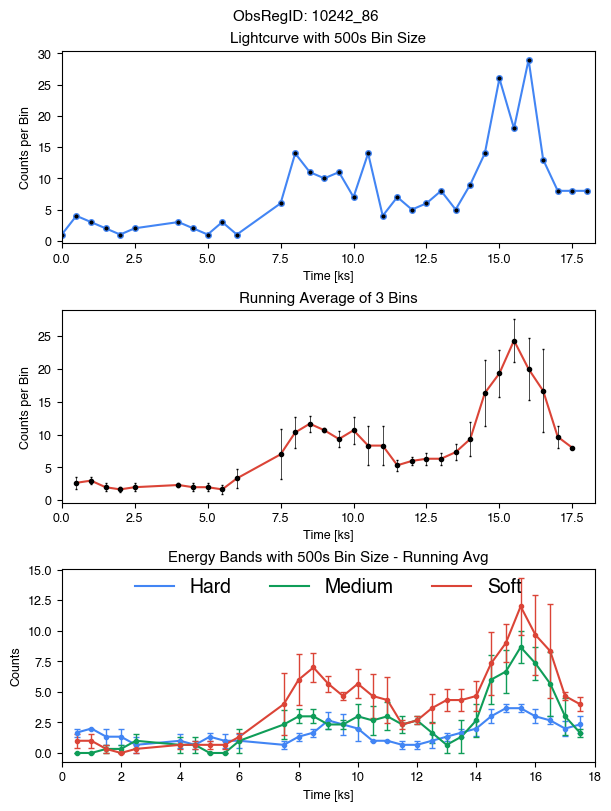

Name: 2CXO J155119.8+200136, ID: 10244-6, Date: 2009-12-15T09:58:37, Counts: 192
RA  237.8325289179205 DEC  20.02665401845593 Off-axis theta  6.569646577862538


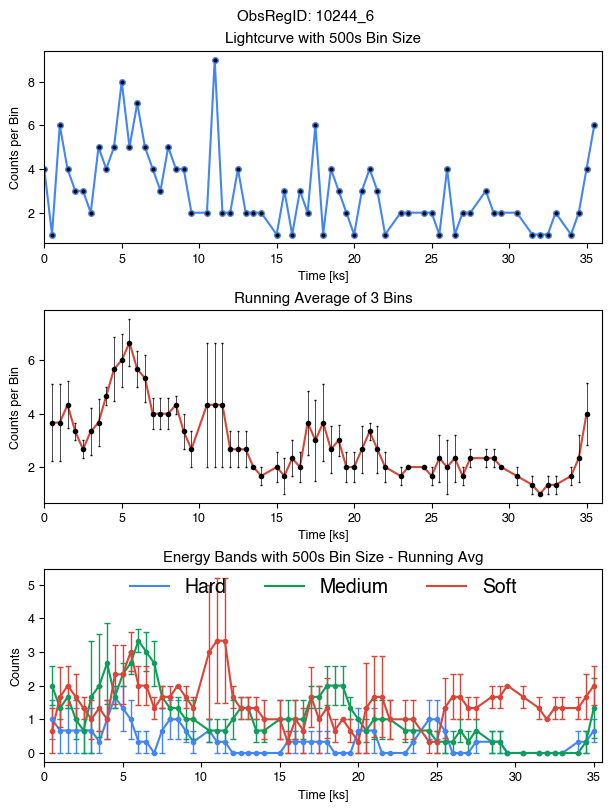

Name: 2CXO J091409.1+405549, ID: 10445-138, Date: 2009-01-06T06:27:03, Counts: 50
RA  138.53819538441877 DEC  40.93031162726344 Off-axis theta  6.012031233137365


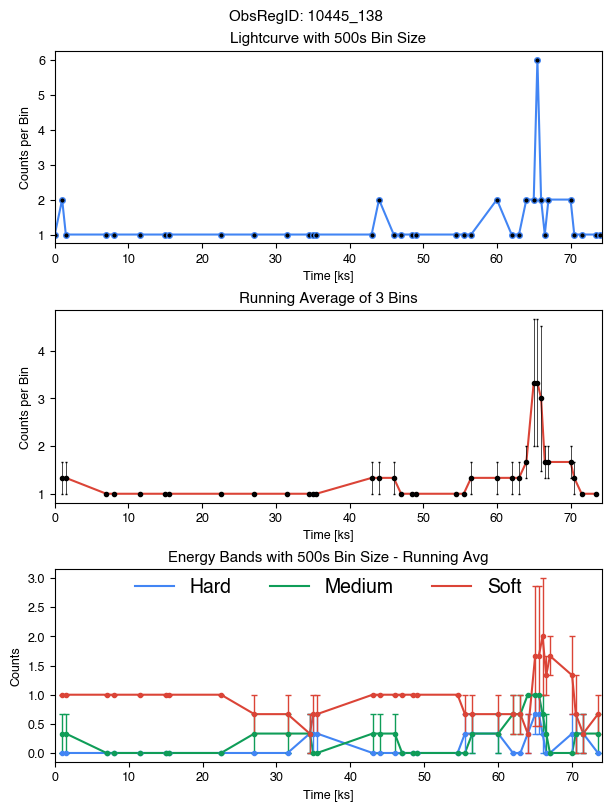

Name: 2CXO J142836.2+335819, ID: 10450-15, Date: 2009-09-27T17:24:06, Counts: 84
RA  217.15092959350125 DEC  33.97197451495916 Off-axis theta  8.396341586572


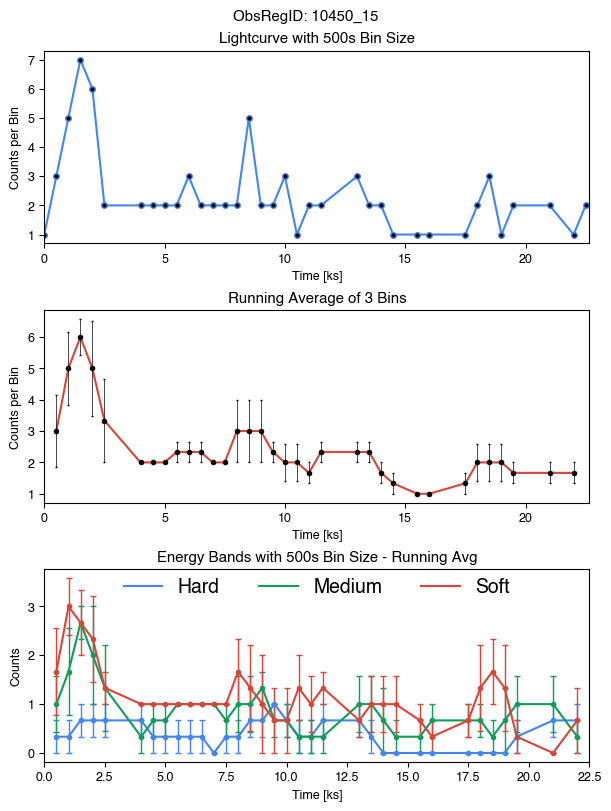

Name: 2CXO J142557.6+334626, ID: 10453-39, Date: 2009-11-03T05:43:11, Counts: 779
RA  216.4901066764137 DEC  33.773932661359034 Off-axis theta  9.901864204282584


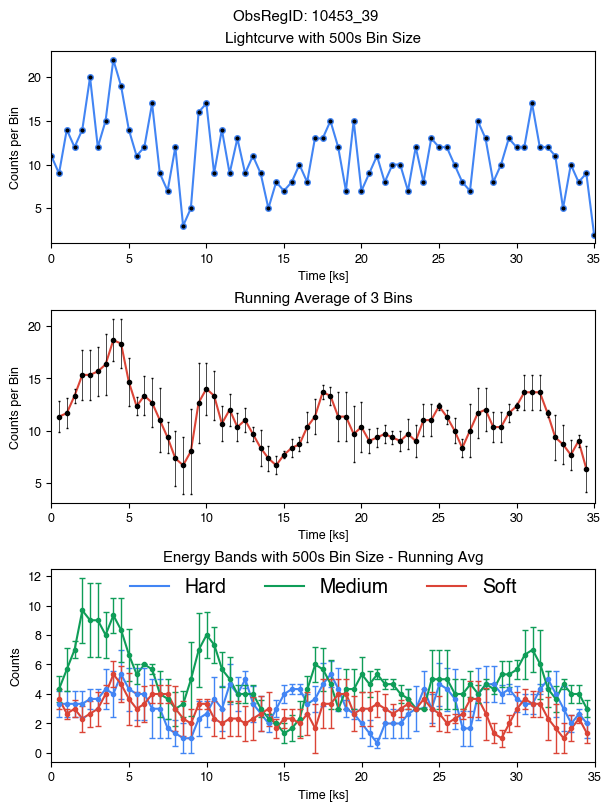

Name: 2CXO J143737.0+341030, ID: 10461-159, Date: 2009-10-04T21:19:36, Counts: 834
RA  219.404111466196 DEC  34.175041973455045 Off-axis theta  8.347943989226403


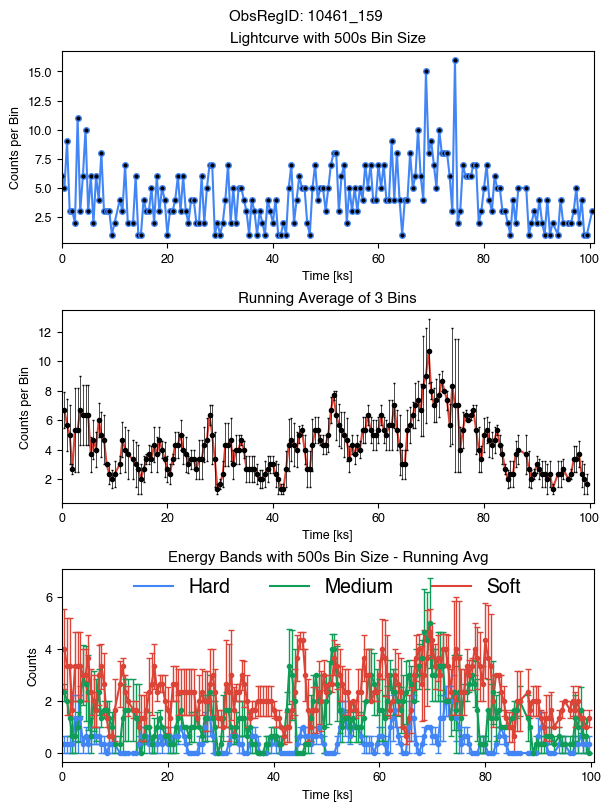

Name: 2CXO J143839.3+341339, ID: 10461-42, Date: 2009-10-04T21:19:36, Counts: 50
RA  219.66382846408544 DEC  34.22772561047769 Off-axis theta  5.142916144113902


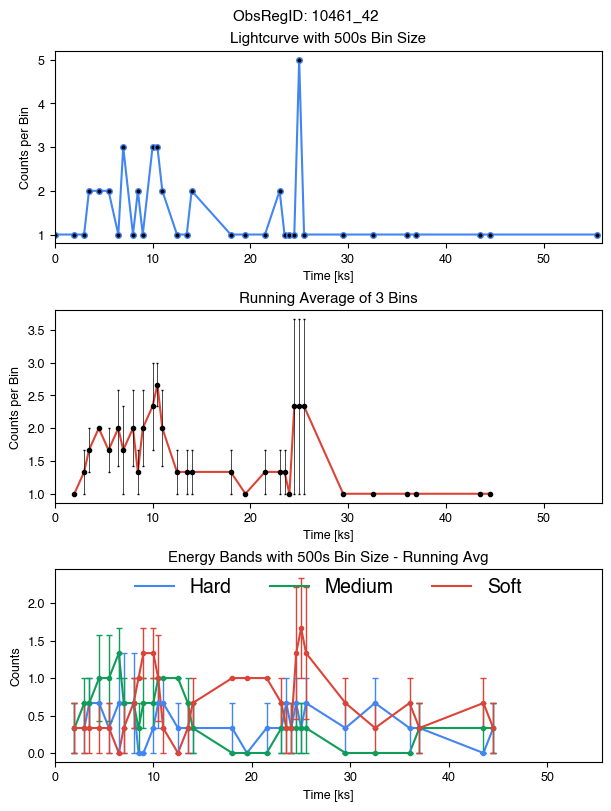

Name: 2CXO J151631.7+065852, ID: 10478-16, Date: 2009-05-25T20:45:33, Counts: 710
RA  229.13222046797387 DEC  6.981412412016369 Off-axis theta  2.770527891933586


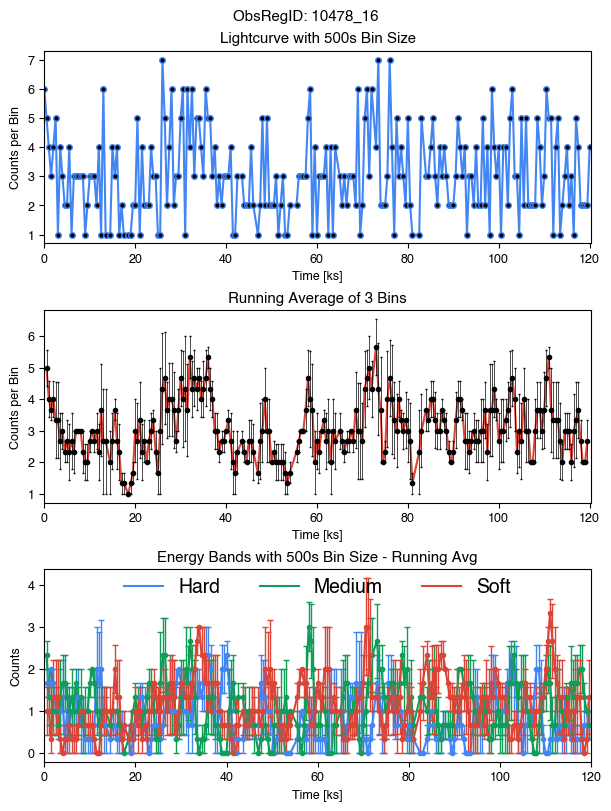

Name: 2CXO J093125.4+213352, ID: 11260-82, Date: 2010-03-07T05:09:03, Counts: 445
RA  142.85618596263987 DEC  21.56466154195931 Off-axis theta  11.05672102874255


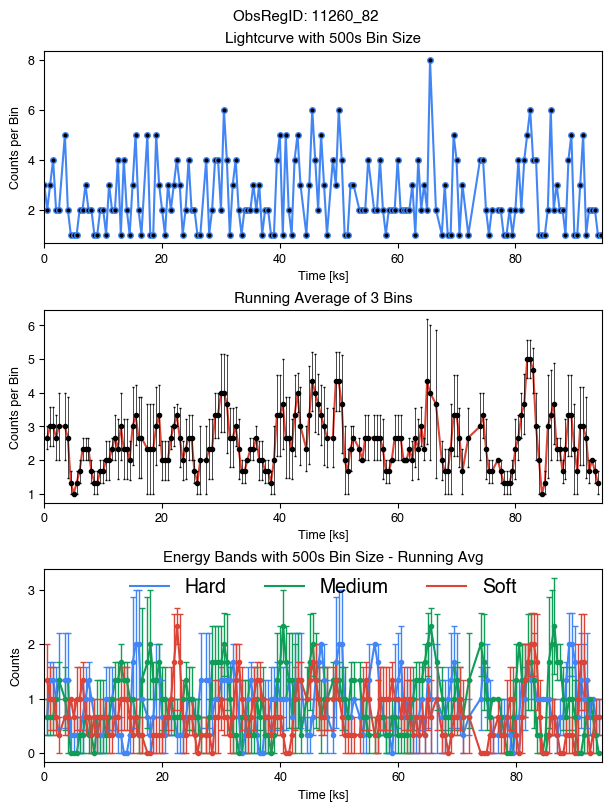

Name: 2CXO J152255.7+533956, ID: 11510-43, Date: 2010-08-24T14:00:32, Counts: 103
RA  230.73226239429084 DEC  53.66589601468006 Off-axis theta  13.91209912039514


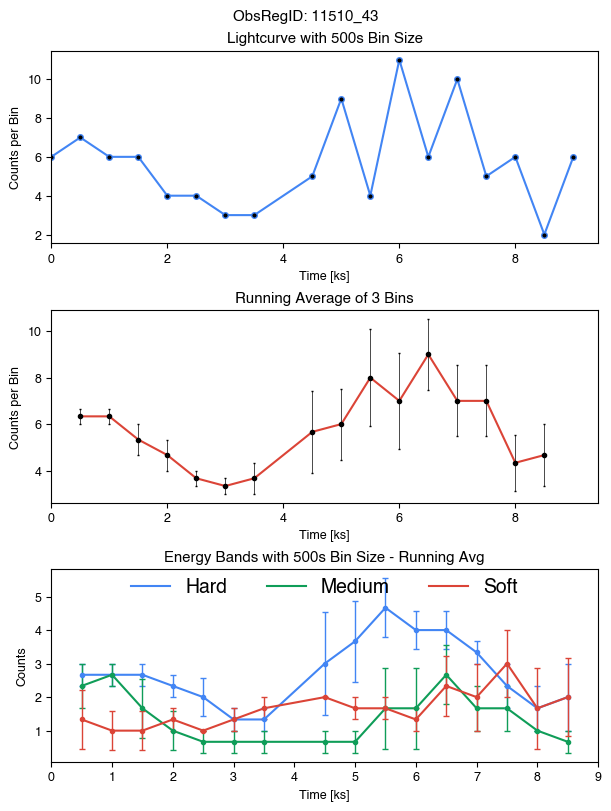

Name: 2CXO J083925.4+295319, ID: 11688-207, Date: 2010-02-19T15:18:44, Counts: 405
RA  129.85585154246394 DEC  29.888803916793893 Off-axis theta  8.891078053304813


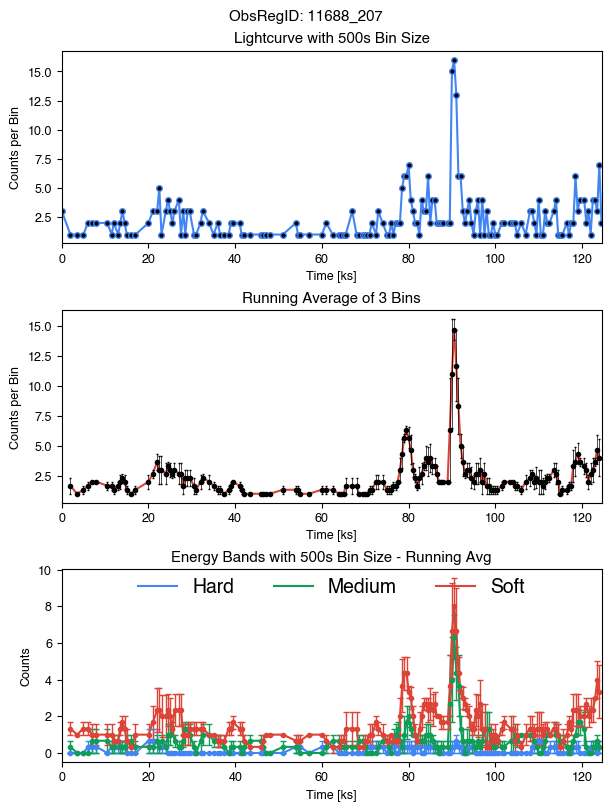

Name: 2CXO J142040.4+414404, ID: 12019-15, Date: 2009-11-08T11:37:30, Counts: 699
RA  215.16833063534364 DEC  41.734498052505685 Off-axis theta  5.010114067681744


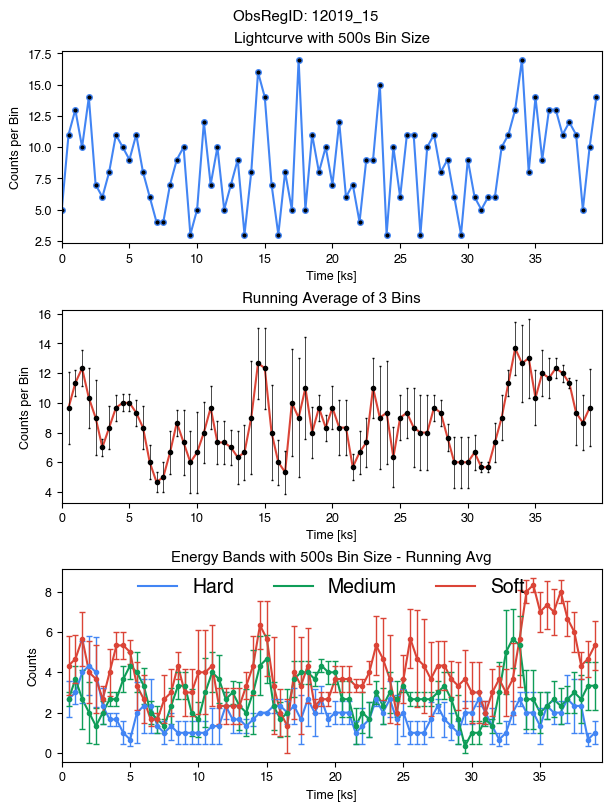

Name: 2CXO J134843.8+263718, ID: 12028-27, Date: 2010-05-10T13:42:51, Counts: 78
RA  207.1824826768948 DEC  26.62173426188144 Off-axis theta  2.45636914549


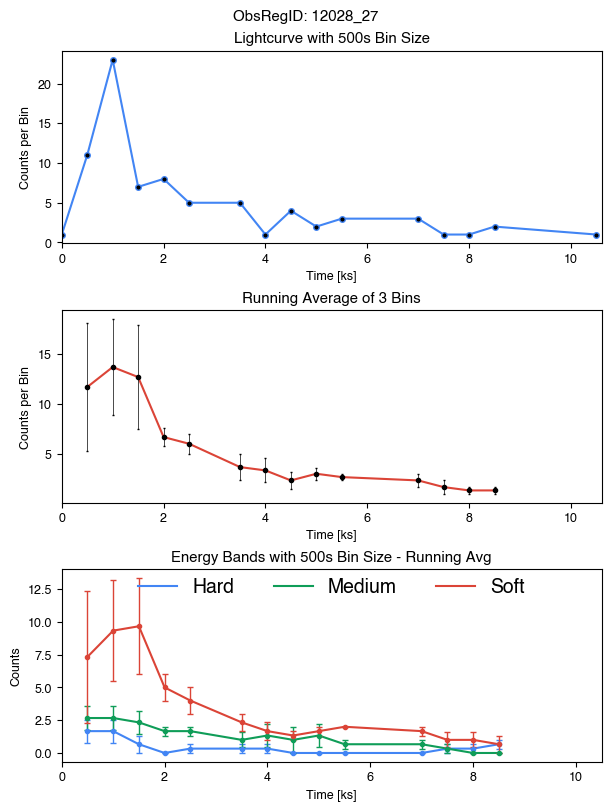

Name: 2CXO J092057.7+295415, ID: 12188-31, Date: 2011-01-02T00:55:47, Counts: 102
RA  140.2405542660146 DEC  29.90418080086146 Off-axis theta  13.15099493168594


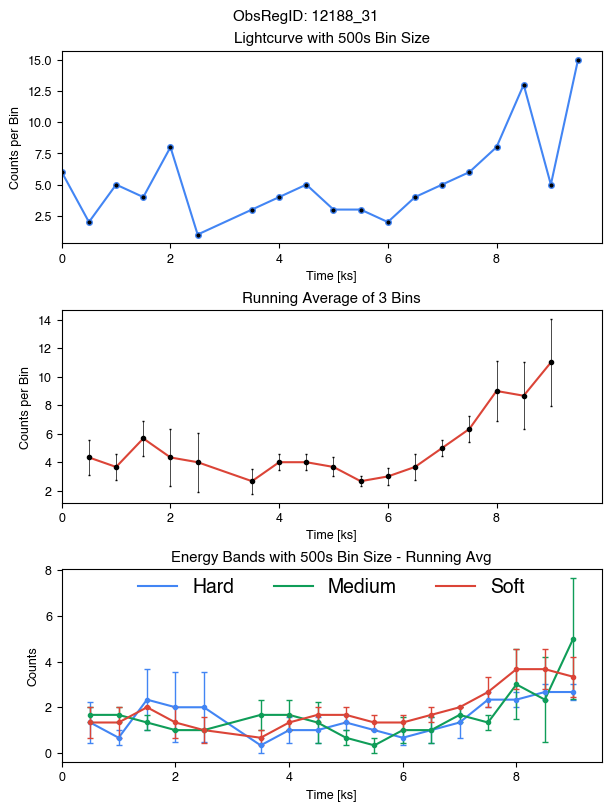

Name: 2CXO J124546.5+033223, ID: 12288-87, Date: 2010-12-05T00:53:42, Counts: 72
RA  191.4440529814649 DEC  3.539909701142425 Off-axis theta  8.435385589904042


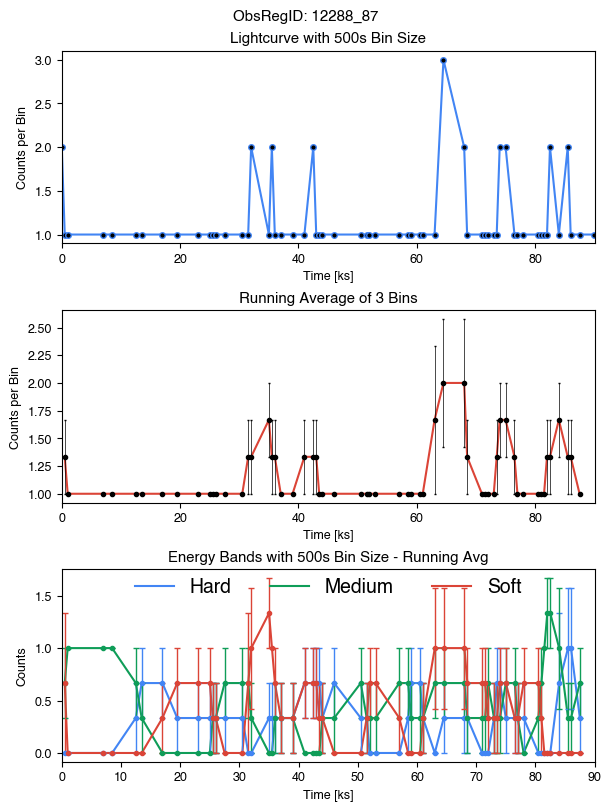

Name: 2CXO J135246.2+313300, ID: 12712-152, Date: 2010-11-16T15:37:18, Counts: 120
RA  208.19252101907284 DEC  31.55000267478377 Off-axis theta  8.403234177494113


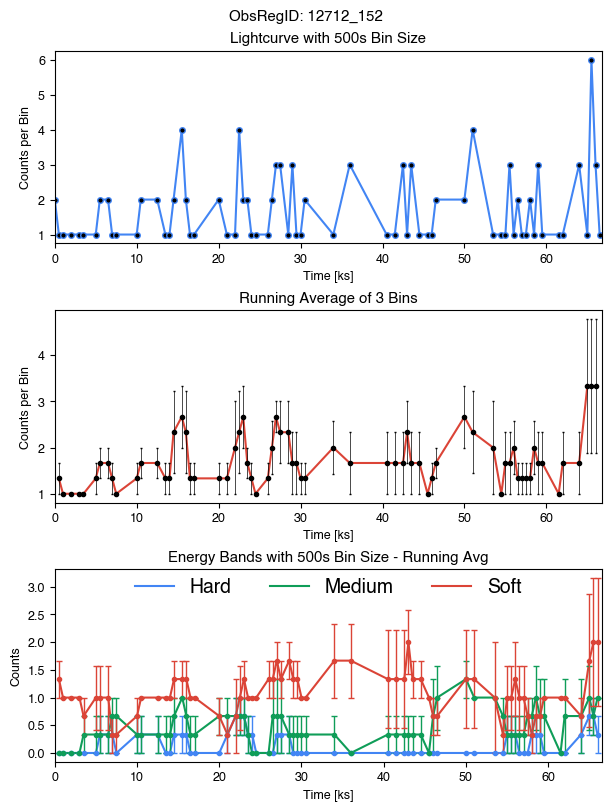

Name: 2CXO J093457.9+170614, ID: 12753-32, Date: 2011-01-13T12:41:29, Counts: 146
RA  143.7415859116078 DEC  17.10408616981724 Off-axis theta  3.786667429524477


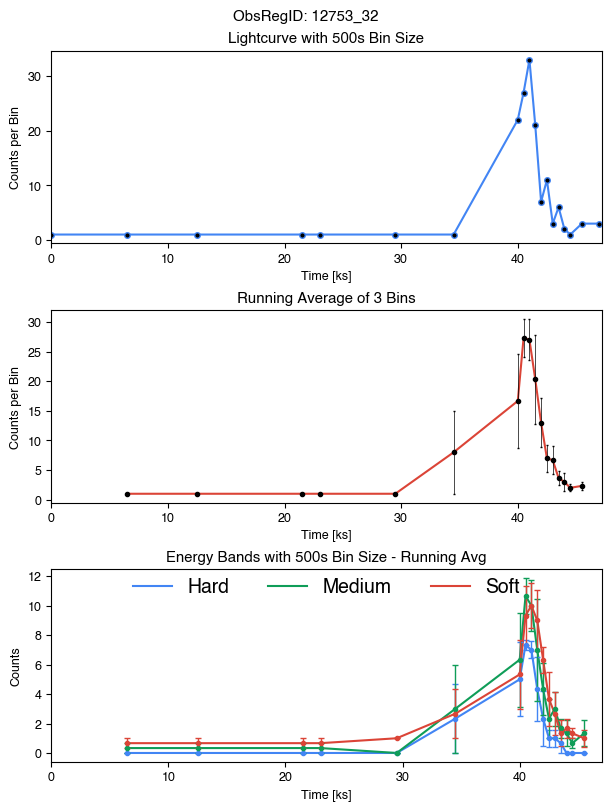

Name: 2CXO J130317.6+191328, ID: 12877-41, Date: 2011-04-03T23:30:42, Counts: 58
RA  195.8233533835637 DEC  19.224659970731548 Off-axis theta  7.280381844691803


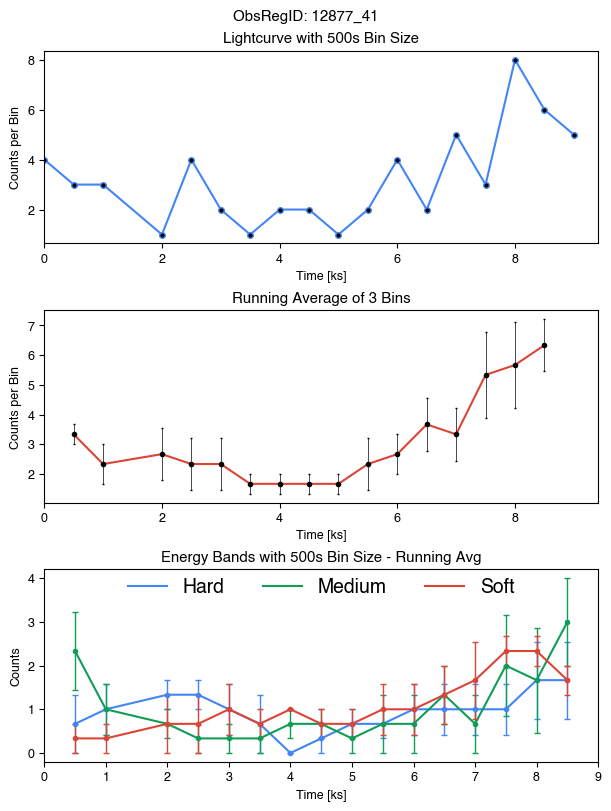

Name: 2CXO J122631.2+215706, ID: 12878-177, Date: 2011-04-11T01:00:42, Counts: 66
RA  186.63043607259203 DEC  21.951918104550987 Off-axis theta  7.385379867773233


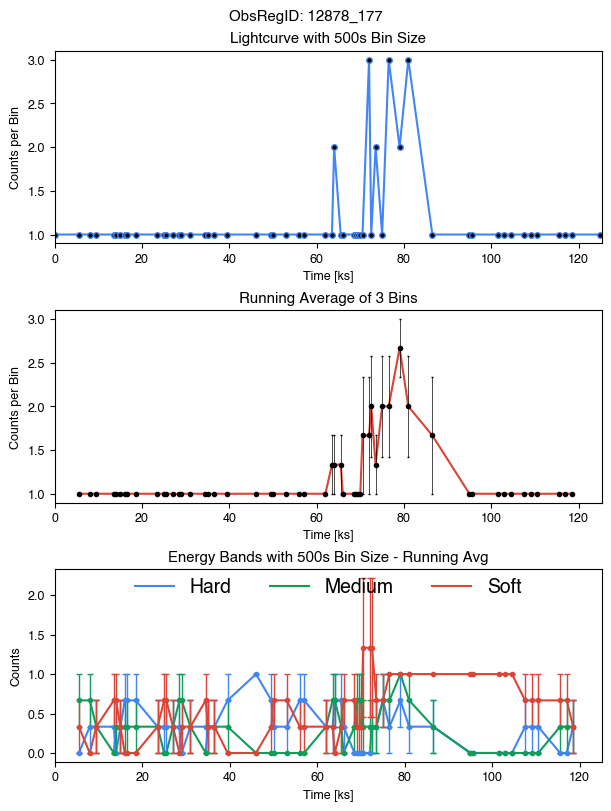

Name: 2CXO J122607.4+214957, ID: 12878-29, Date: 2011-04-11T01:00:42, Counts: 89
RA  186.5313275735912 DEC  21.832628161284067 Off-axis theta  8.196982332432029


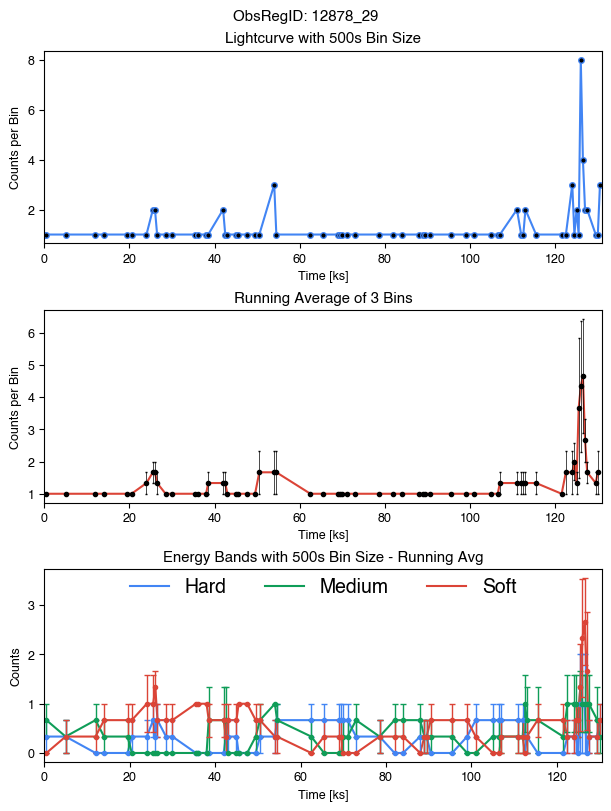

Name: 2CXO J125740.2+273118, ID: 12887-22, Date: 2010-11-11T01:39:35, Counts: 271
RA  194.4174851932036 DEC  27.52160573376581 Off-axis theta  2.646912187389


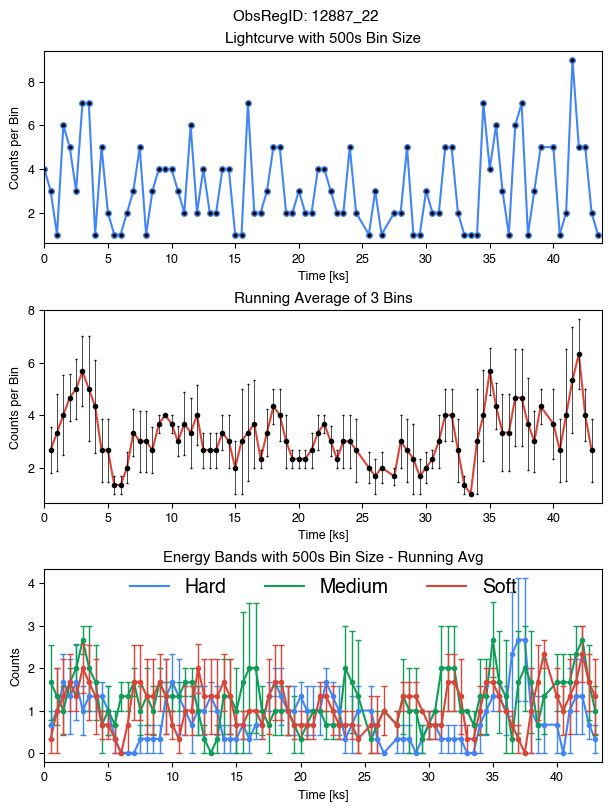

Name: 2CXO J150115.8+015004, ID: 12951-189, Date: 2011-03-28T13:29:05, Counts: 85
RA  225.3161298472188 DEC  1.834646849797726 Off-axis theta  5.709487507441613


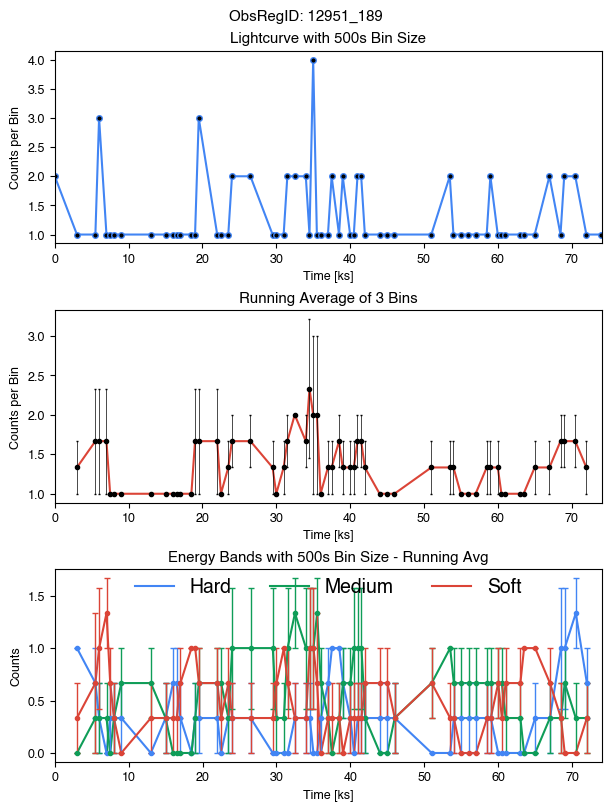

Name: 2CXO J150121.2+014616, ID: 12953-640, Date: 2011-04-07T20:04:57, Counts: 68
RA  225.33858033327272 DEC  1.771311881141171 Off-axis theta  3.678185995418


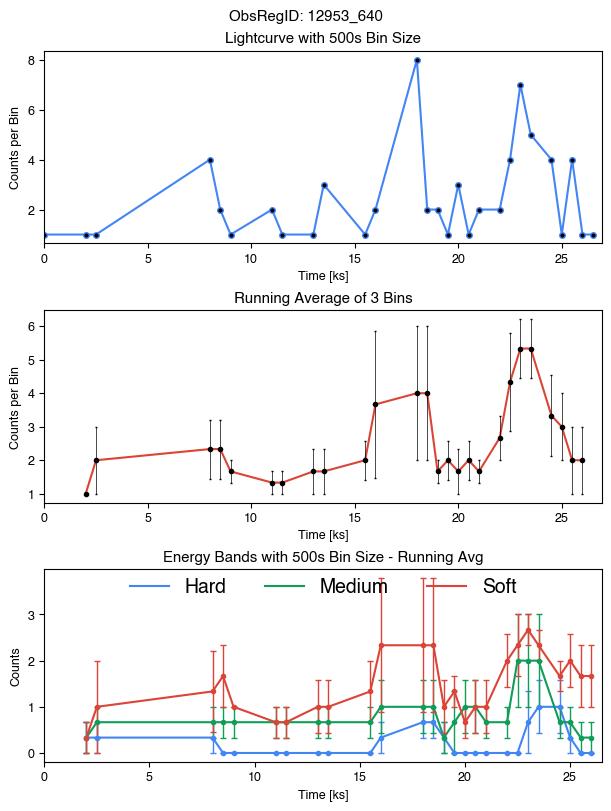

Name: 2CXO J142918.1+343024, ID: 13133-89, Date: 2011-01-22T15:16:37, Counts: 207
RA  217.32526134873297 DEC  34.50698508005829 Off-axis theta  7.857863502371


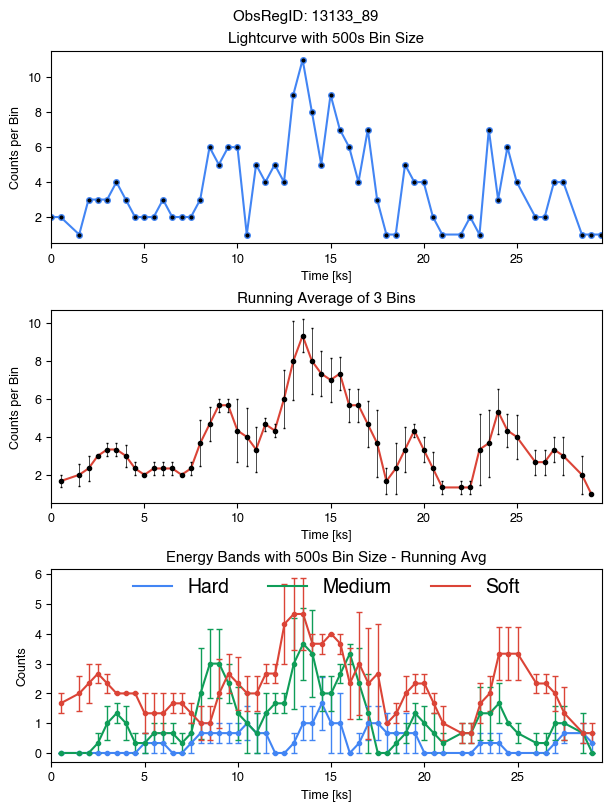

Name: 2CXO J095456.7+174329, ID: 13215-42, Date: 2011-01-16T12:28:52, Counts: 1193
RA  148.73659835482545 DEC  17.72501498610897 Off-axis theta  10.02122803799911


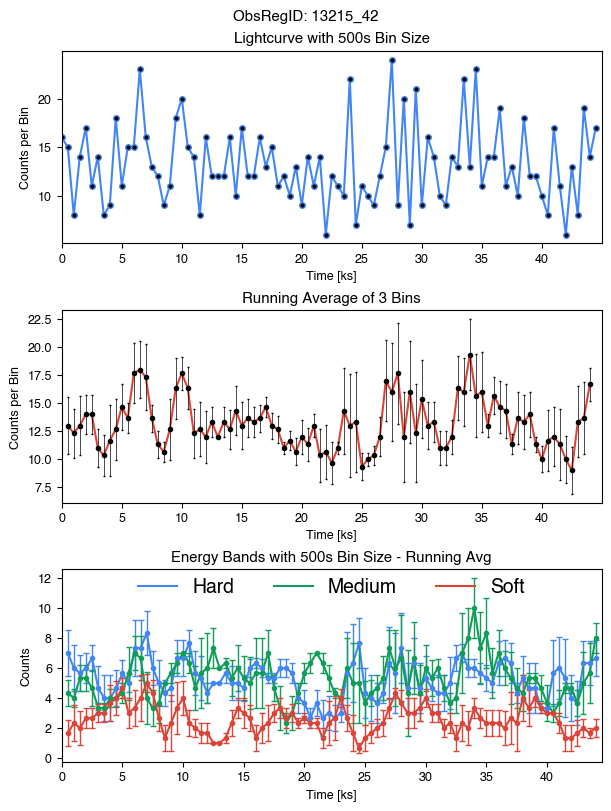

Name: 2CXO J150121.2+014616, ID: 13253-640, Date: 2011-04-08T14:59:00, Counts: 86
RA  225.33858033327272 DEC  1.771311881141171 Off-axis theta  3.678366015266


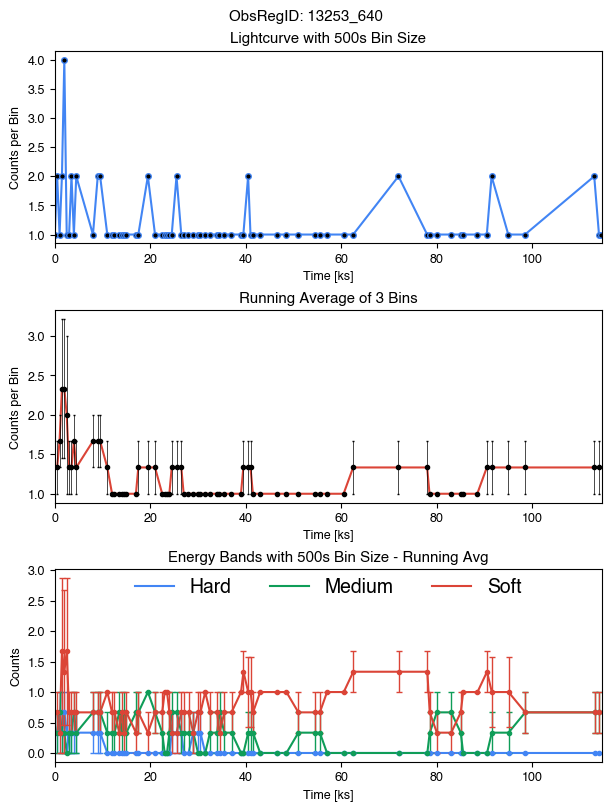

Name: 2CXO J150148.8+014403, ID: 13255-105, Date: 2011-04-10T12:11:19, Counts: 250
RA  225.45354943499285 DEC  1.734426652015749 Off-axis theta  10.25236007341531


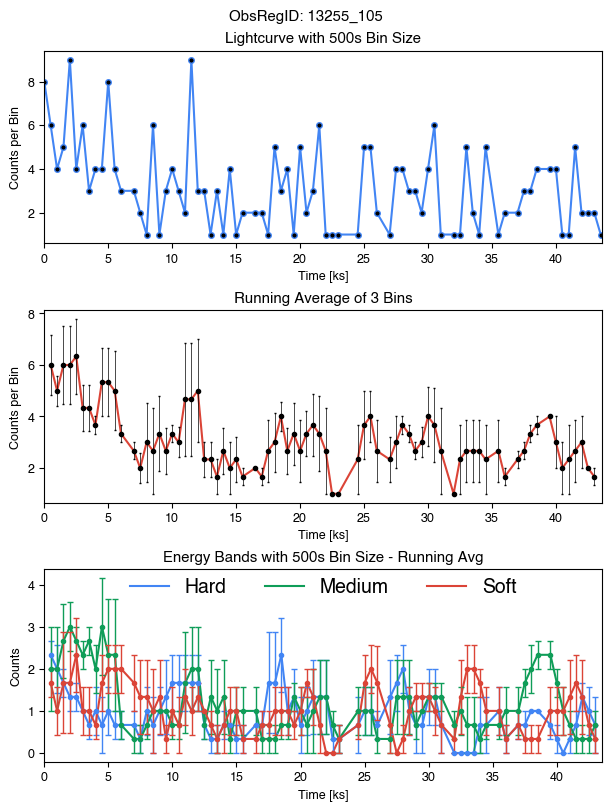

Name: 2CXO J125611.5+565326, ID: 13947-59, Date: 2012-08-24T21:23:30, Counts: 289
RA  194.04807218084116 DEC  56.89084316215503 Off-axis theta  1.147952856483804


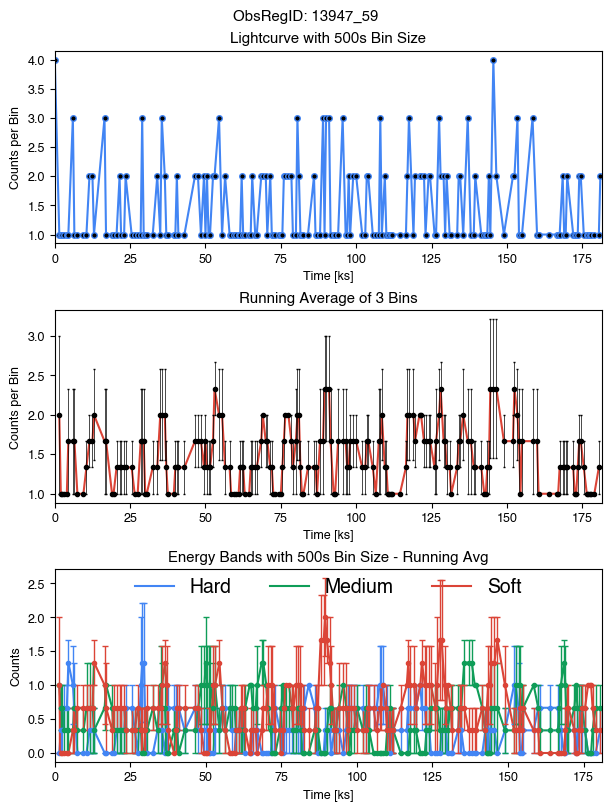

Name: 2CXO J125857.0+275329, ID: 13994-24, Date: 2012-03-19T09:05:34, Counts: 456
RA  194.7377720874704 DEC  27.89153792528061 Off-axis theta  9.255109136182


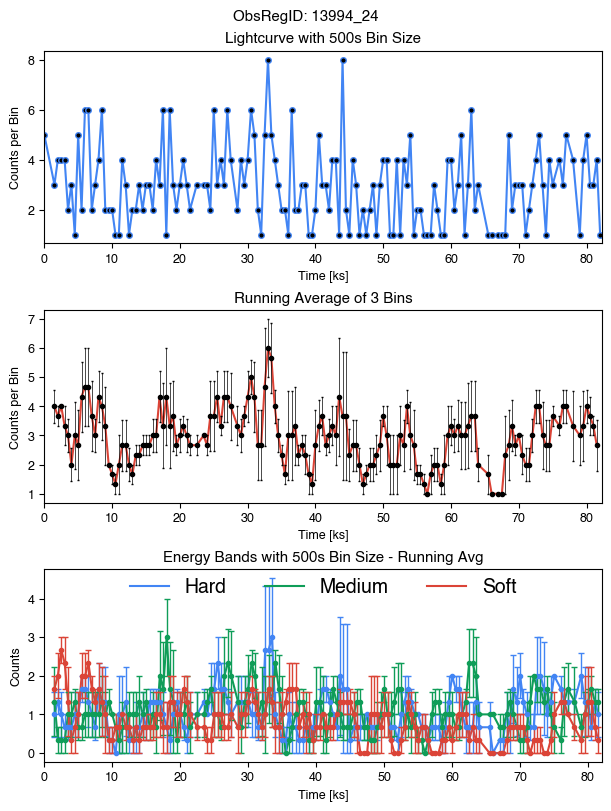

Name: 2CXO J135001.1+093409, ID: 14021-53, Date: 2011-12-02T18:44:12, Counts: 95
RA  207.5050075503982 DEC  9.569271900569026 Off-axis theta  9.181922121763147


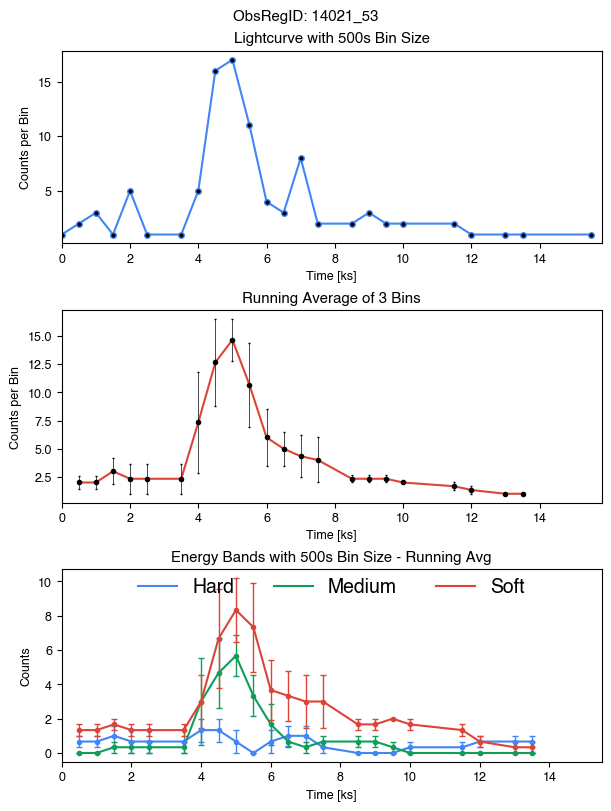

Name: 2CXO J232657.3-020712, ID: 14361-18, Date: 2011-10-23T22:24:23, Counts: 102
RA  351.73896018468054 DEC  -2.1200115501979138 Off-axis theta  8.125944701930175


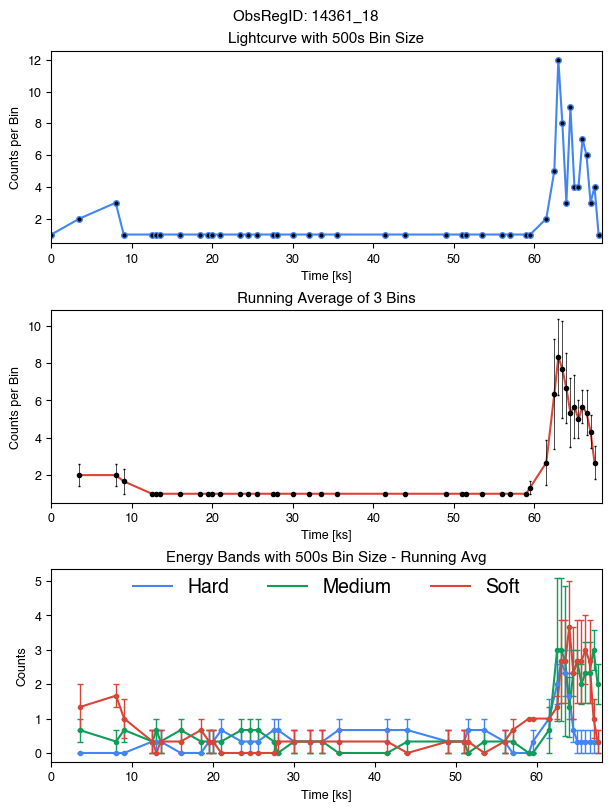

Name: 2CXO J131514.7+132418, ID: 14530-67, Date: 2013-04-28T00:35:04, Counts: 161
RA  198.81161466873252 DEC  13.405071110426272 Off-axis theta  13.9599412412091


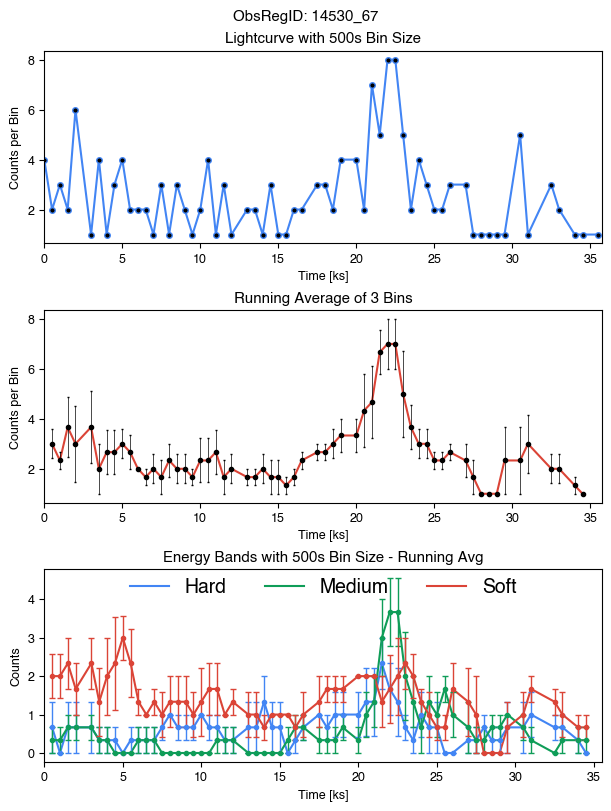

Name: 2CXO J111527.6+503151, ID: 15021-13, Date: 2013-07-07T10:36:19, Counts: 79
RA  168.8653247435583 DEC  50.5308803597919 Off-axis theta  8.512689875649382


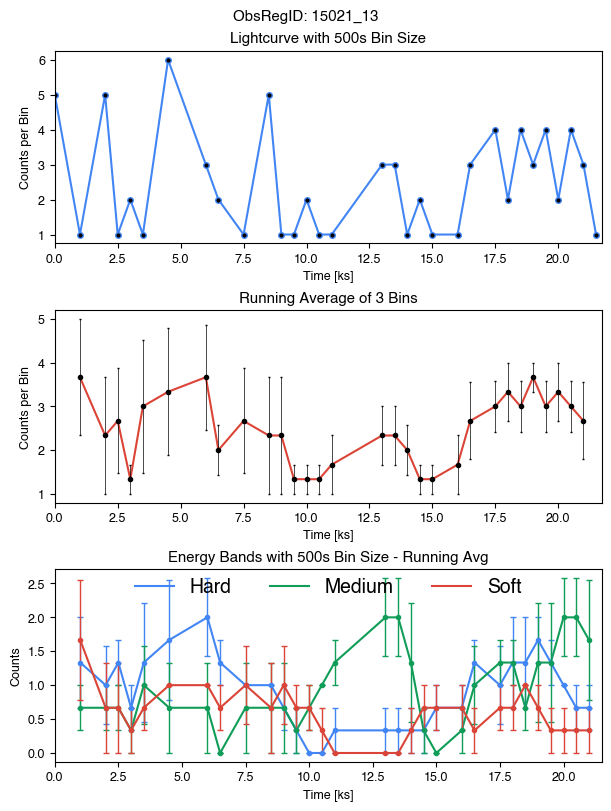

Name: 2CXO J114234.8+583313, ID: 15136-16, Date: 2013-06-29T00:07:05, Counts: 35
RA  175.6452874809779 DEC  58.55375394625638 Off-axis theta  4.289137571245776


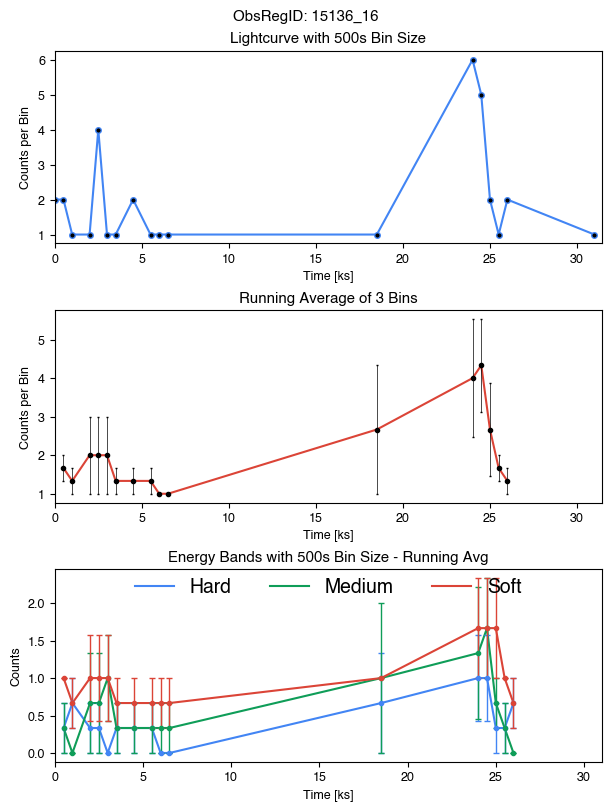

Name: 2CXO J095959.4+024646, ID: 15211-38, Date: 2012-12-13T22:40:02, Counts: 35
RA  149.9979014505003 DEC  2.7795764145816984 Off-axis theta  6.467411781462


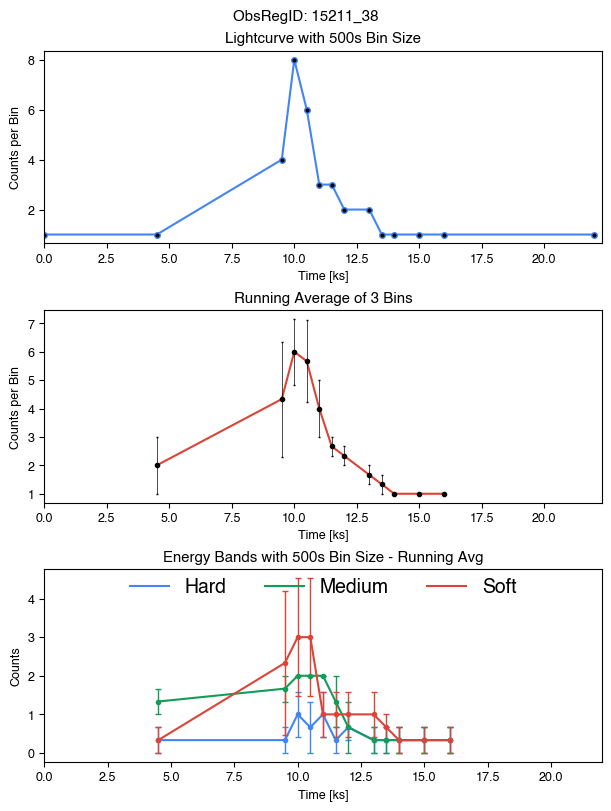

Name: 2CXO J100040.3+023656, ID: 15211-44, Date: 2012-12-13T22:40:02, Counts: 52
RA  150.16809263902644 DEC  2.6156968249741257 Off-axis theta  8.378080578807


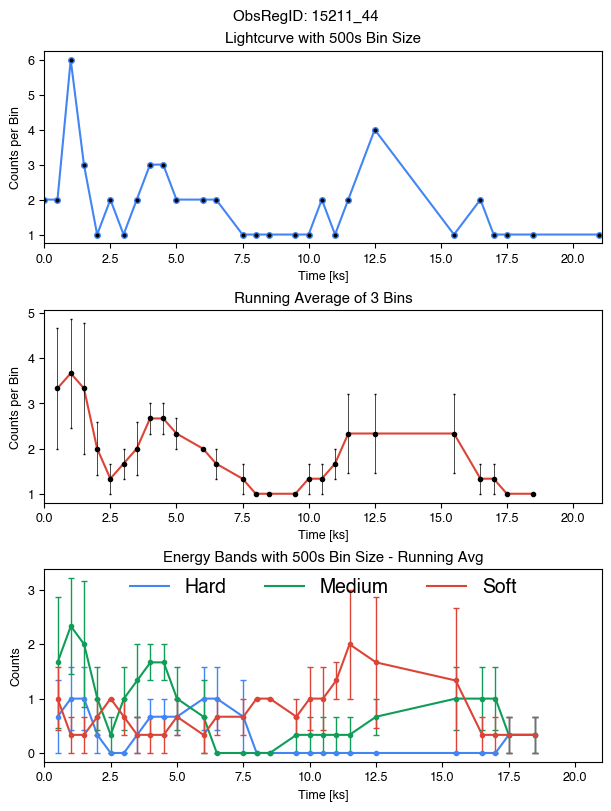

Name: 2CXO J095816.0+014844, ID: 15220-8, Date: 2013-04-04T02:35:43, Counts: 64
RA  149.56671978912016 DEC  1.8124571021661144 Off-axis theta  3.520635063545813


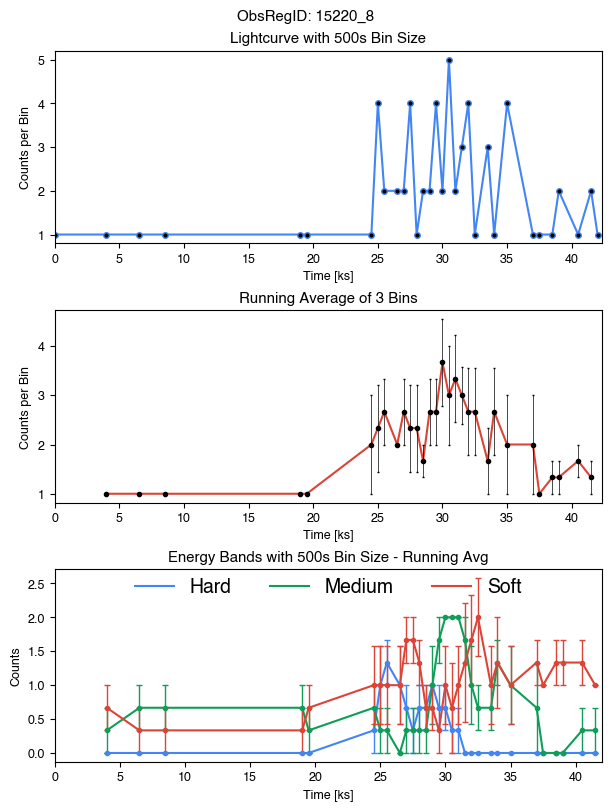

Name: 2CXO J095946.9+013451, ID: 15247-89, Date: 2014-03-18T02:29:55, Counts: 52
RA  149.94553094606874 DEC  1.5807782372483123 Off-axis theta  0.47102333313107


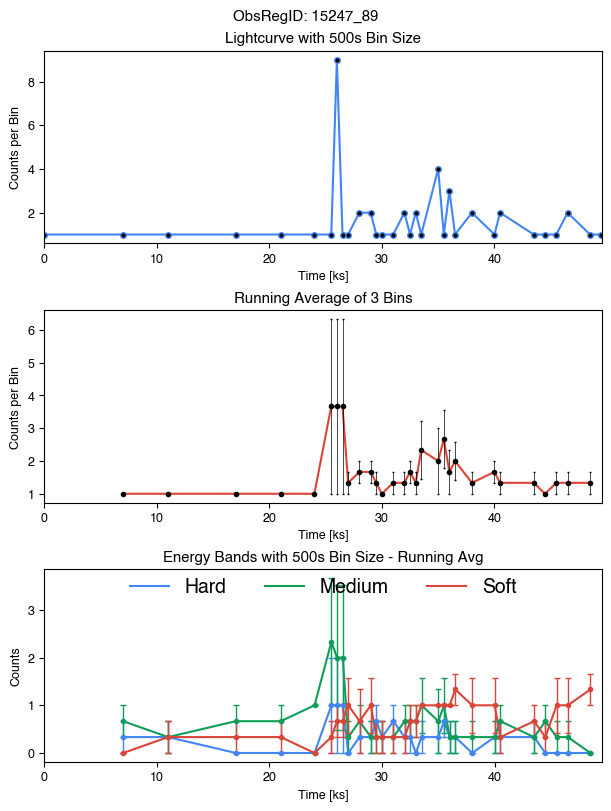

Name: 2CXO J100238.7+013936, ID: 15249-37, Date: 2013-11-29T18:03:46, Counts: 65
RA  150.66127471628647 DEC  1.660113465189795 Off-axis theta  8.688419564405331


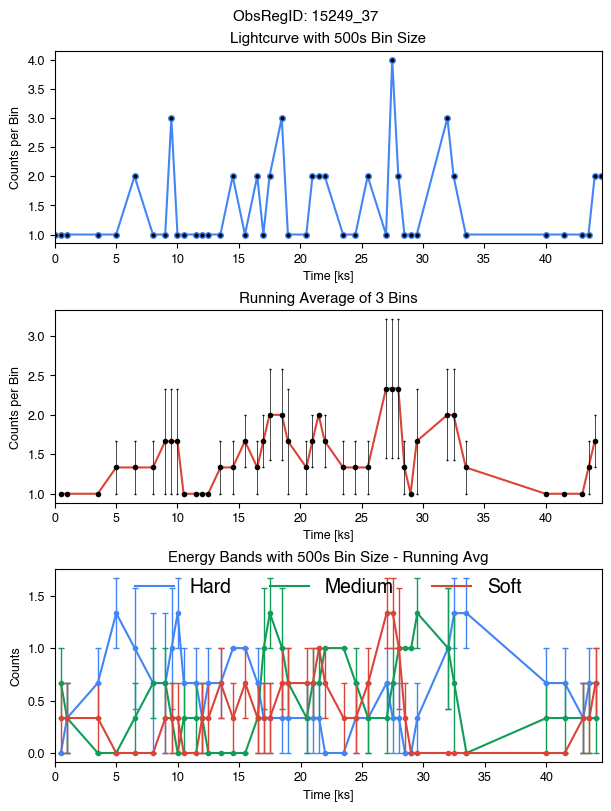

Name: 2CXO J100230.0+014810, ID: 15250-19, Date: 2013-12-12T11:55:43, Counts: 314
RA  150.6251358198292 DEC  1.8028659150783573 Off-axis theta  3.729222865311


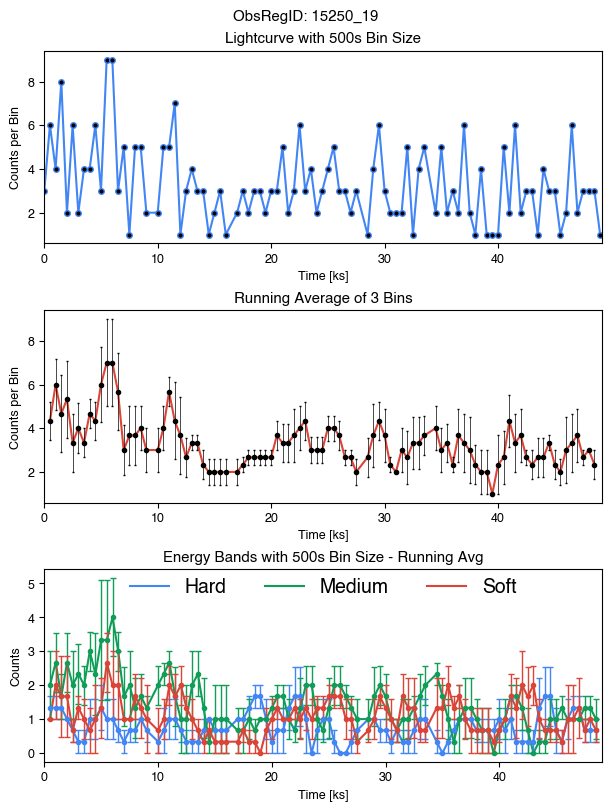

Name: 2CXO J134815.6+264442, ID: 15488-38, Date: 2013-04-10T03:07:53, Counts: 74
RA  207.06531620555108 DEC  26.745137763799057 Off-axis theta  8.58361226371


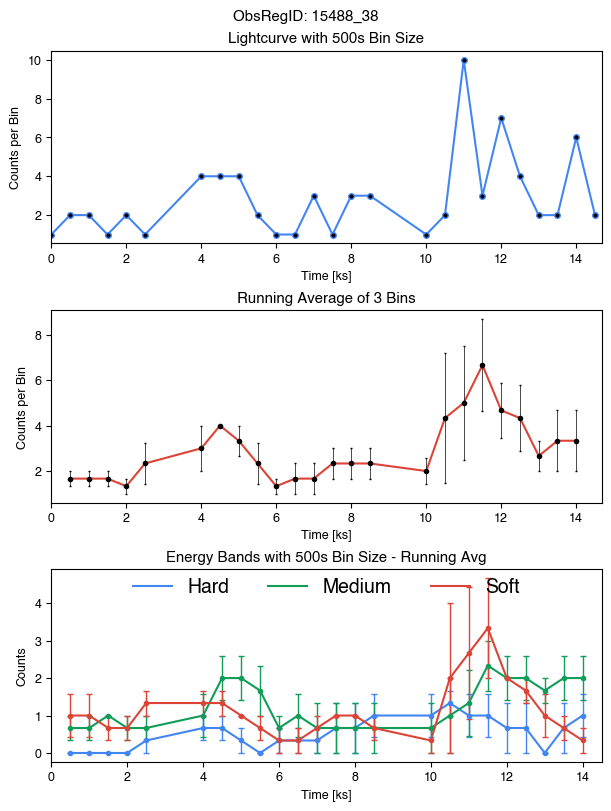

Name: 2CXO J114931.7+223029, ID: 16306-83, Date: 2014-02-05T11:40:15, Counts: 1252
RA  177.3823177855802 DEC  22.50791835218361 Off-axis theta  2.987772660919


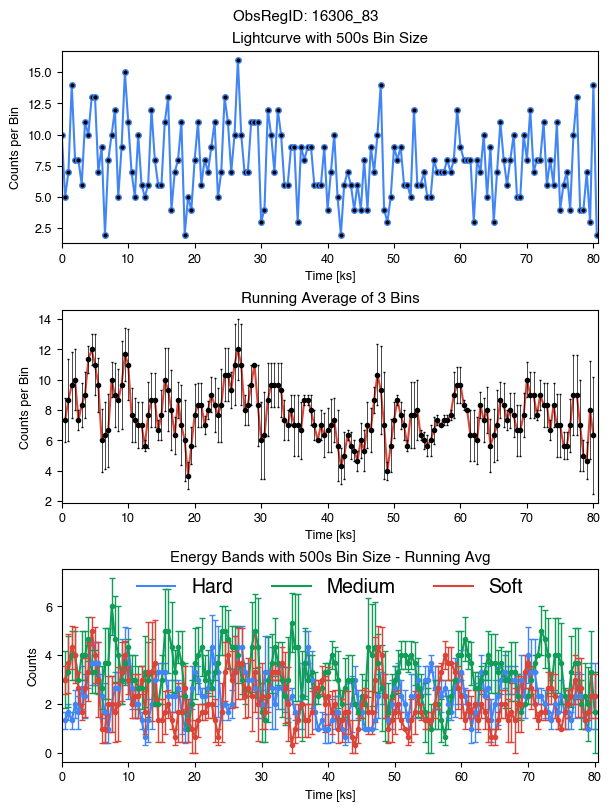

Name: 2CXO J112819.5+583741, ID: 1641-201, Date: 2001-07-13T11:22:09, Counts: 149
RA  172.08164610734752 DEC  58.6282735846924 Off-axis theta  3.41762194443257


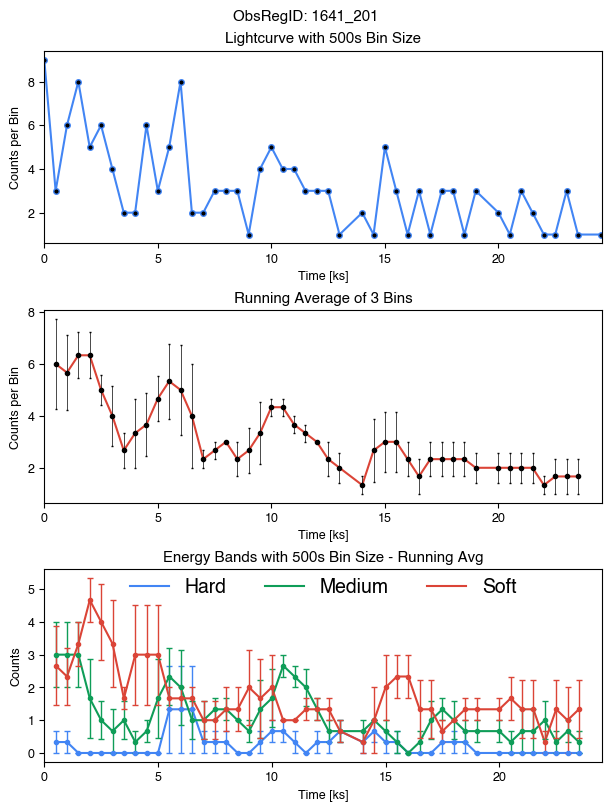

Name: 2CXO J082152.0+075103, ID: 1647-52, Date: 2000-10-06T14:25:05, Counts: 41
RA  125.46719518867718 DEC  7.8505850554132515 Off-axis theta  1.647102422151963


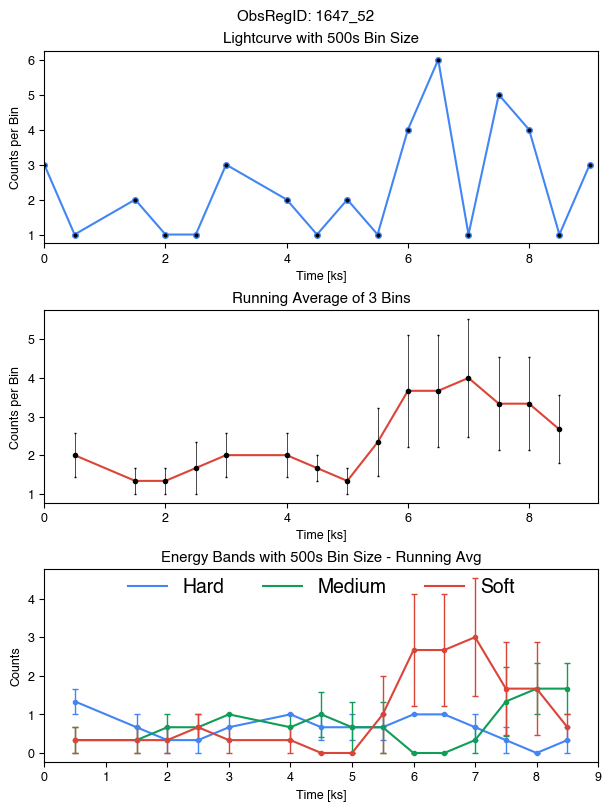

Name: 2CXO J112116.1+232622, ID: 1660-39, Date: 2001-04-23T23:19:37, Counts: 70
RA  170.31751993964826 DEC  23.439528479776765 Off-axis theta  6.662245342213782


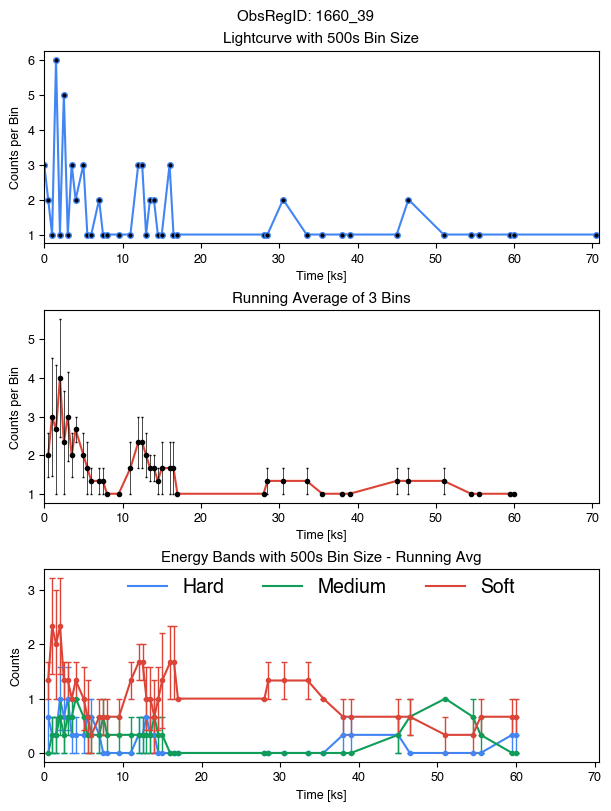

Name: 2CXO J103641.1+573533, ID: 1697-100, Date: 2001-05-16T13:05:39, Counts: 435
RA  159.1715758012324 DEC  57.59260285820756 Off-axis theta  16.81677451400993


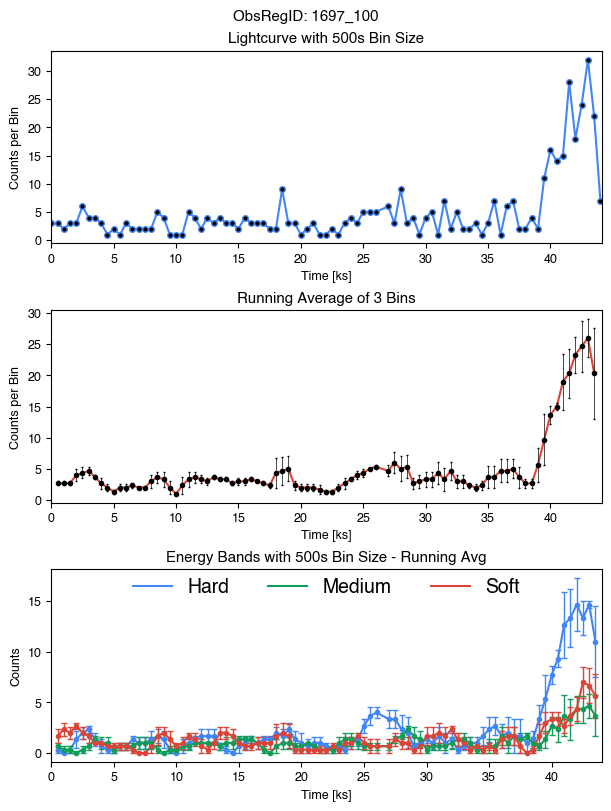

Name: 2CXO J122837.2+015720, ID: 1712-170, Date: 2000-06-14T14:20:33, Counts: 774
RA  187.15517470056943 DEC  1.9556496823806375 Off-axis theta  9.388237288113835


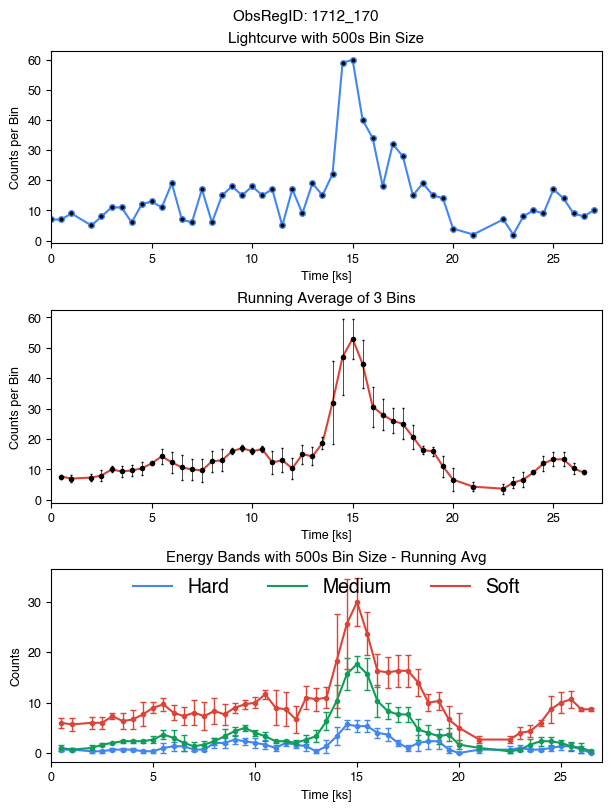

Name: 2CXO J015637.5+053300, ID: 17198-141, Date: 2015-12-04T08:53:02, Counts: 122
RA  29.15655888446031 DEC  5.549940549341406 Off-axis theta  4.302308283766


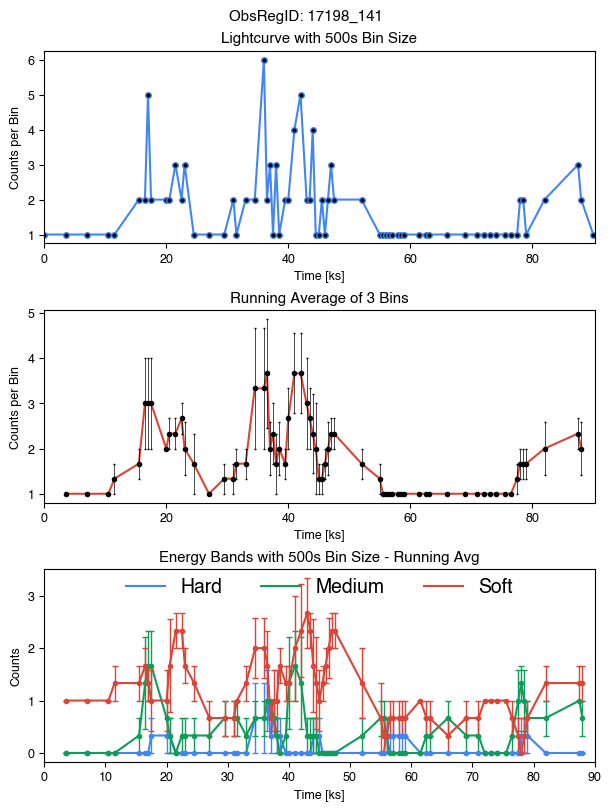

Name: 2CXO J103027.7+052643, ID: 18185-56, Date: 2017-01-17T19:26:14, Counts: 66
RA  157.61580034060728 DEC  5.445441033028289 Off-axis theta  1.058595563032


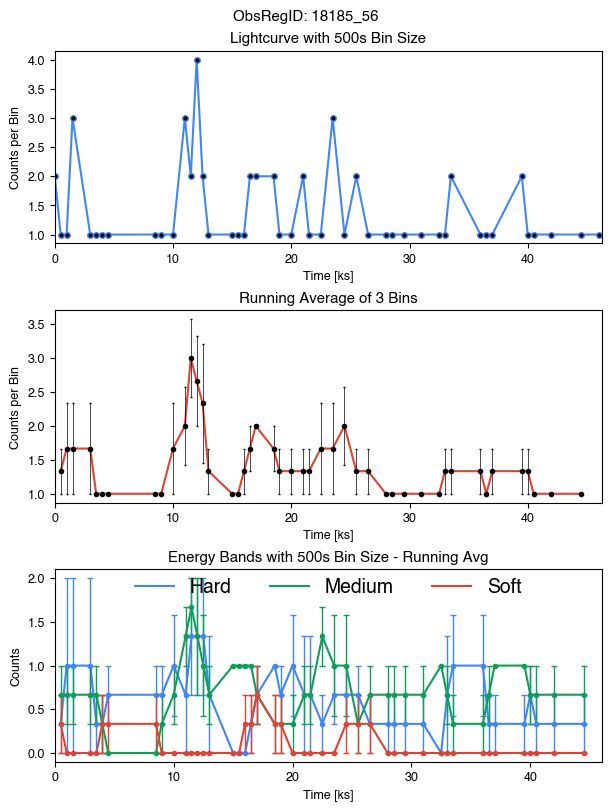

Name: 2CXO J143306.0+342801, ID: 18474-17, Date: 2016-10-29T15:49:14, Counts: 45
RA  218.2747062411057 DEC  34.46714777366724 Off-axis theta  5.703120833124


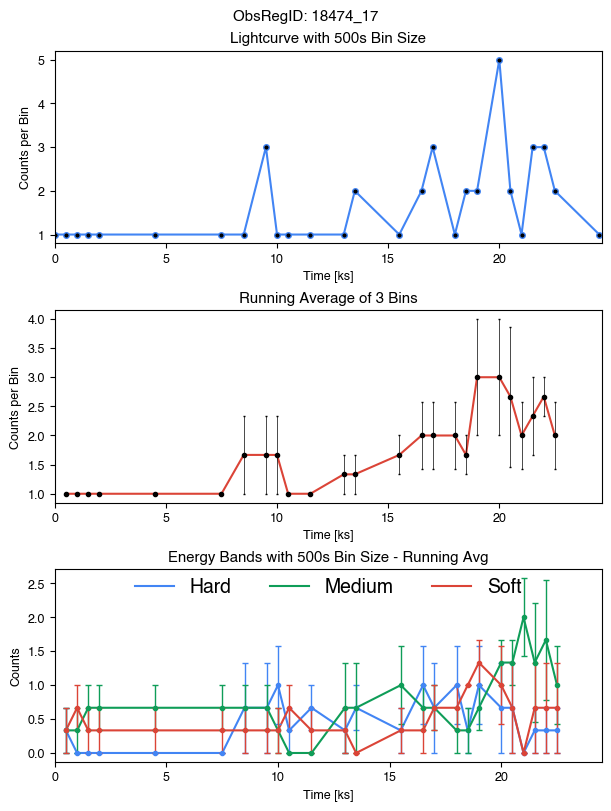

Name: 2CXO J143217.0+344017, ID: 18474-69, Date: 2016-10-29T15:49:14, Counts: 206
RA  218.07120815858863 DEC  34.6714084549959 Off-axis theta  15.75286740963


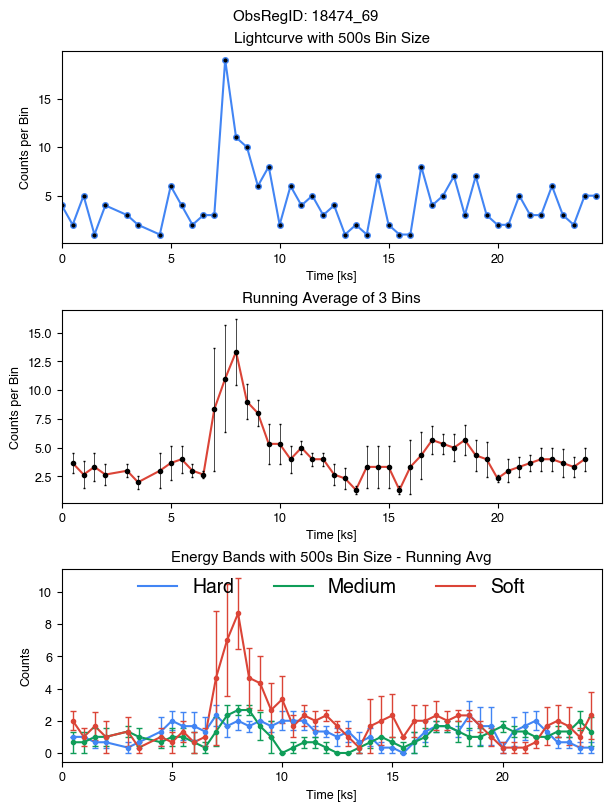

Name: 2CXO J143219.5+341728, ID: 18475-26, Date: 2016-10-30T10:37:06, Counts: 259
RA  218.08132652716392 DEC  34.291412878733766 Off-axis theta  8.173284015487


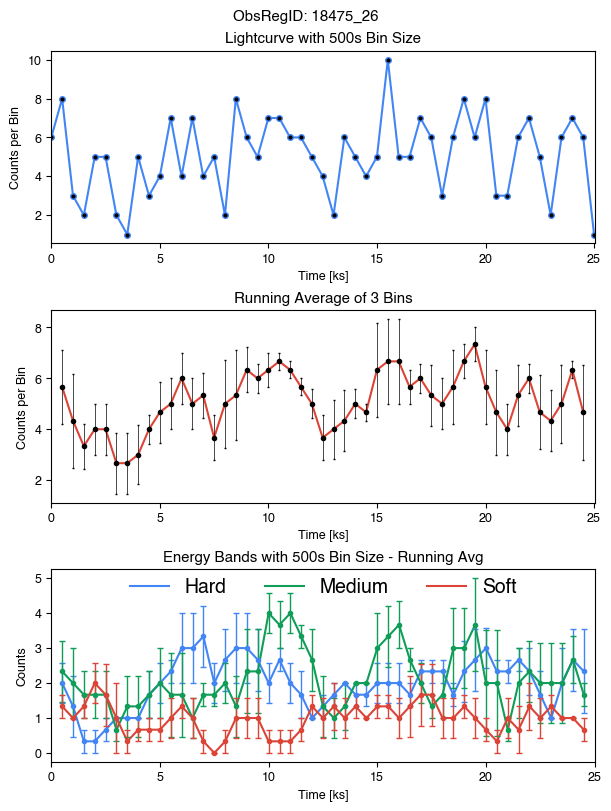

Name: 2CXO J095628.2+285123, ID: 19333-32, Date: 2018-01-16T18:50:54, Counts: 124
RA  149.11716271891078 DEC  28.856645158741067 Off-axis theta  3.838320345821


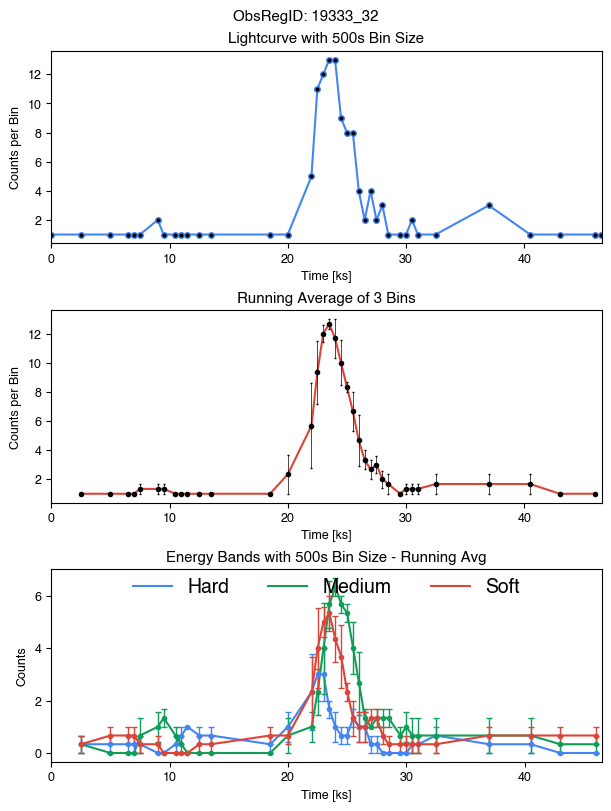

Name: 2CXO J100436.1+411552, ID: 19634-73, Date: 2017-06-27T06:45:26, Counts: 70
RA  151.15036608183266 DEC  41.26469447708931 Off-axis theta  3.370284987961


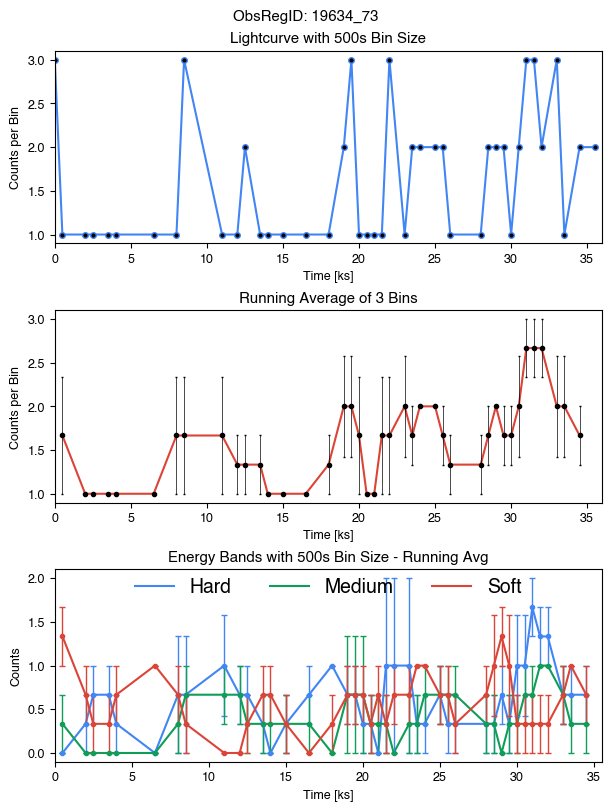

Name: 2CXO J122108.6+294952, ID: 2062-103, Date: 2001-04-02T19:54:52, Counts: 274
RA  185.28604720668 DEC  29.83121363628945 Off-axis theta  17.89887986280817


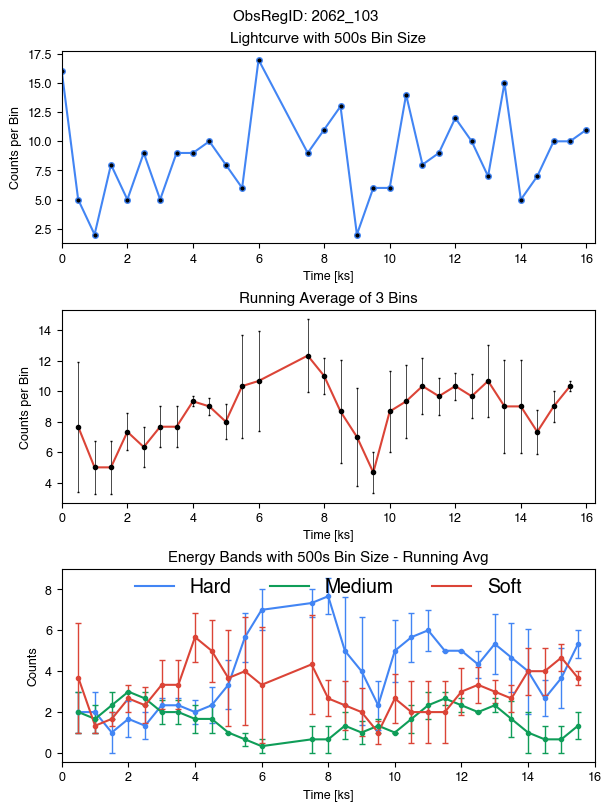

Name: 2CXO J013622.9+210017, ID: 2129-31, Date: 2001-01-16T07:20:56, Counts: 2092
RA  24.095620552745288 DEC  21.004969958091877 Off-axis theta  3.44401797852801


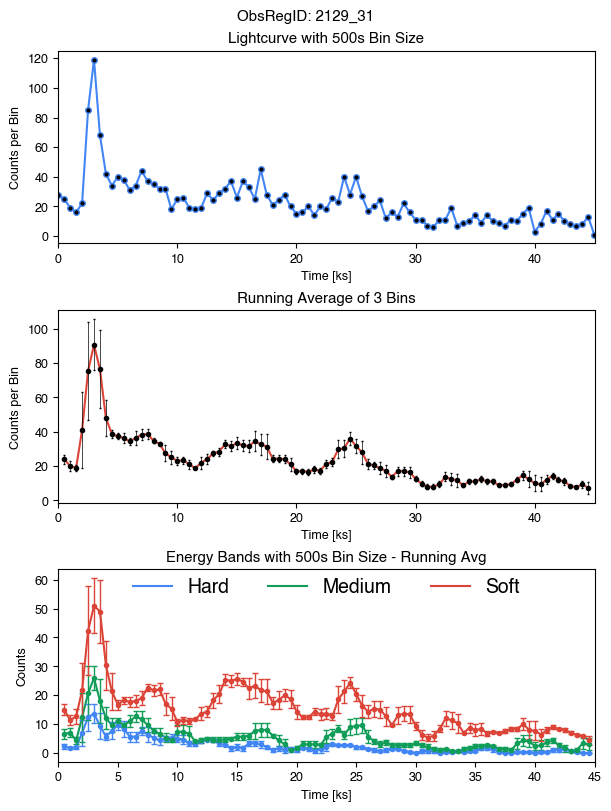

Name: 2CXO J091017.4+541758, ID: 2227-217, Date: 2001-04-29T05:07:37, Counts: 151
RA  137.57284517626408 DEC  54.29965223628288 Off-axis theta  3.843829655737668


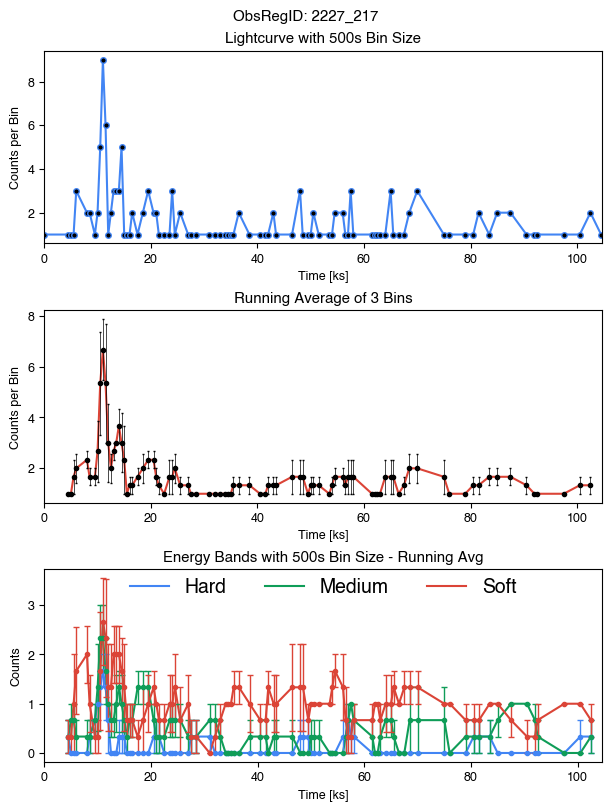

Name: 2CXO J091045.7+542021, ID: 2227-279, Date: 2001-04-29T05:07:37, Counts: 55
RA  137.6905445178087 DEC  54.339311260602926 Off-axis theta  0.9163619001866252


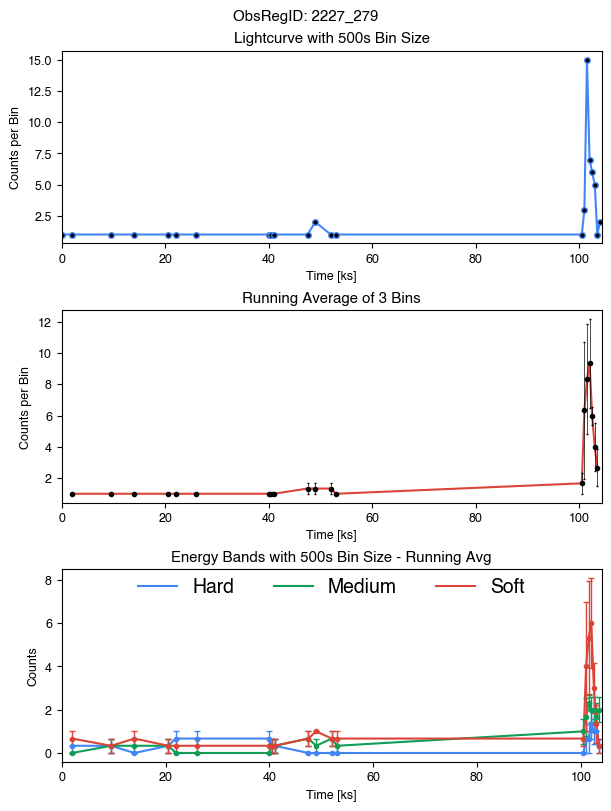

Name: 2CXO J141123.4+521331, ID: 2254-45, Date: 2001-05-18T15:45:39, Counts: 916
RA  212.84757410650184 DEC  52.22547548876667 Off-axis theta  1.546559868961449


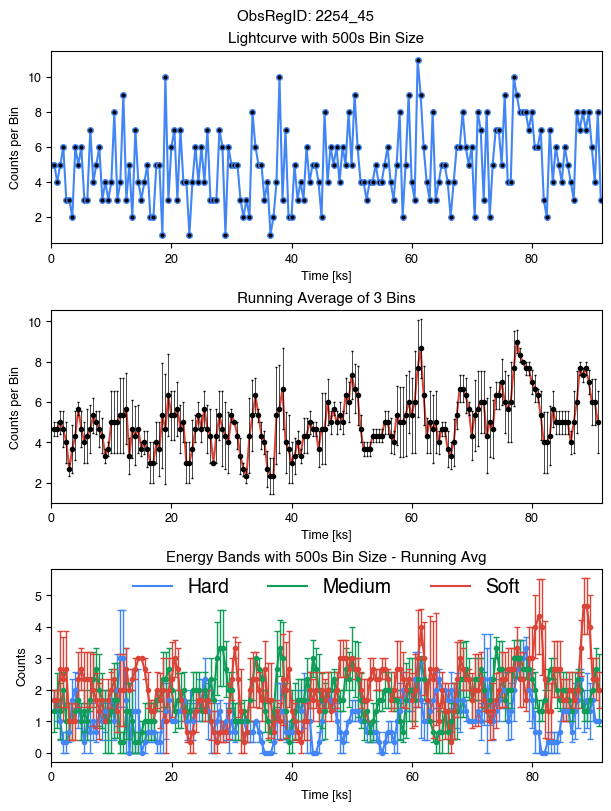

Name: 2CXO J221748.2+022010, ID: 2981-4, Date: 2002-08-29T16:31:57, Counts: 529
RA  334.45098853344246 DEC  2.336296710225205 Off-axis theta  0.5893077247778524


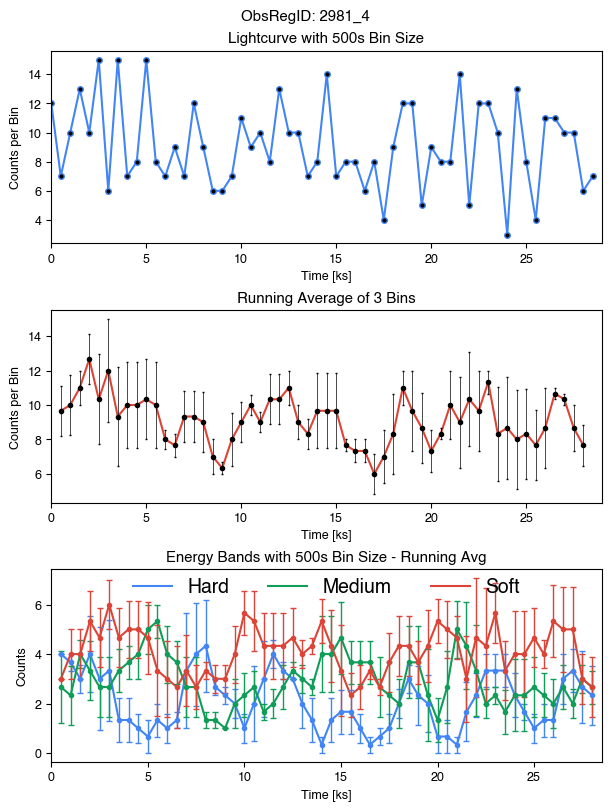

Name: 2CXO J122711.4+090648, ID: 2982-58, Date: 2002-04-04T04:07:17, Counts: 390
RA  186.79772582911824 DEC  9.113435187668506 Off-axis theta  12.6281604325


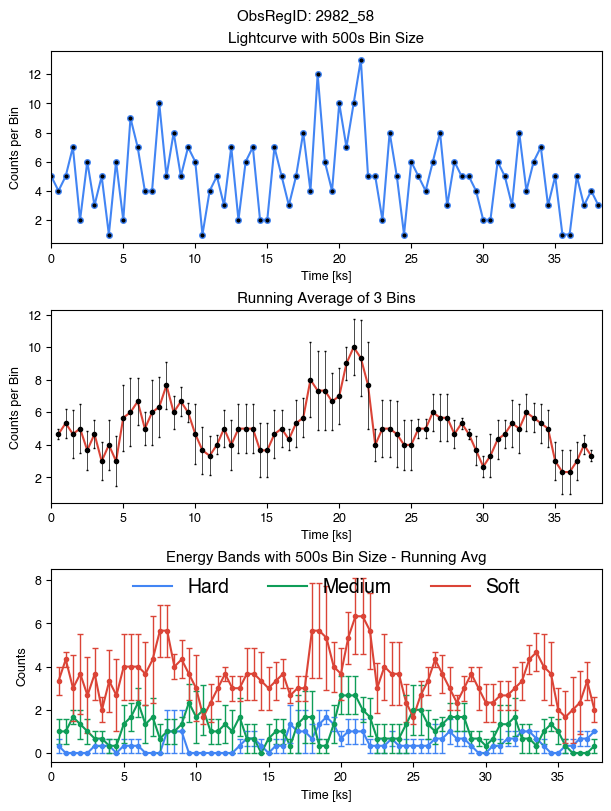

Name: 2CXO J114450.6+312249, ID: 2984-101, Date: 2002-04-25T05:02:42, Counts: 277
RA  176.21121708088594 DEC  31.380383751458403 Off-axis theta  13.15037663600286


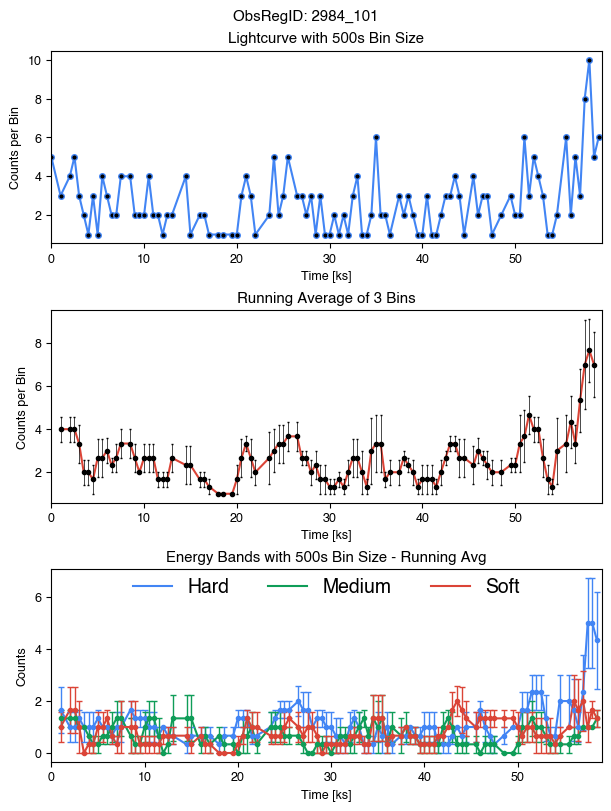

Name: 2CXO J112308.3+013843, ID: 3013-45, Date: 2001-12-13T07:40:52, Counts: 37
RA  170.7848728728418 DEC  1.645416754202452 Off-axis theta  3.451680032006974


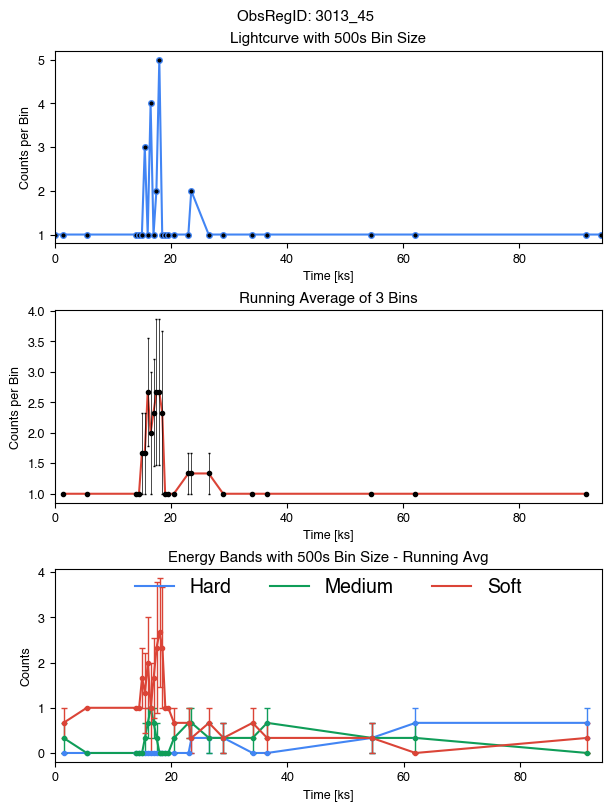

Name: 2CXO J142547.1+353954, ID: 3130-102, Date: 2002-04-16T03:11:04, Counts: 222
RA  216.44627306613245 DEC  35.6652093923498 Off-axis theta  4.346185316588349


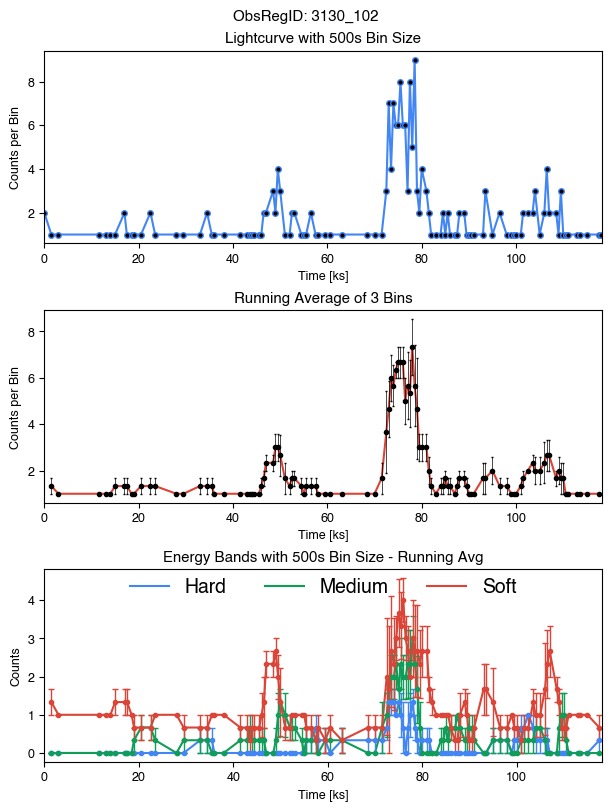

Name: 2CXO J142537.8+351735, ID: 3130-181, Date: 2002-04-16T03:11:04, Counts: 1054
RA  216.4074283578558 DEC  35.29321083034003 Off-axis theta  18.37104003983


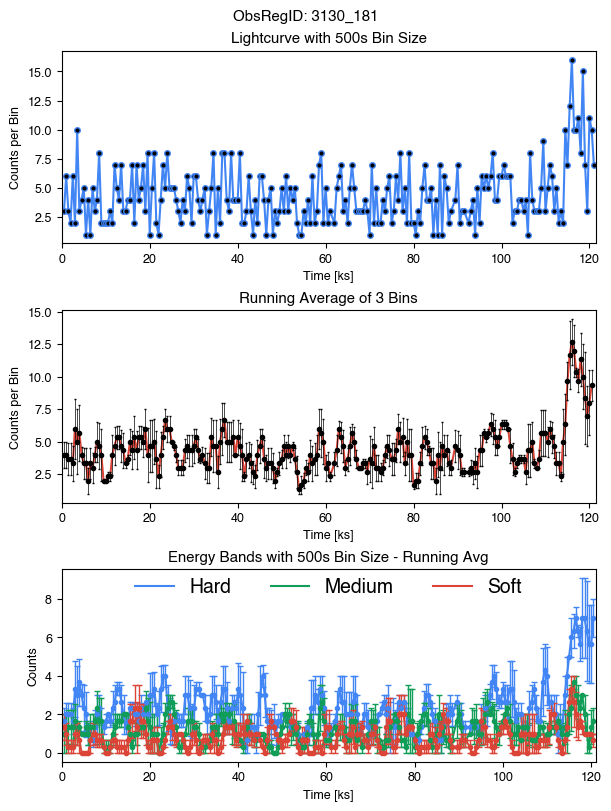

Name: 2CXO J095747.3+332231, ID: 3157-61, Date: 2001-12-24T01:16:52, Counts: 67
RA  149.4474423867223 DEC  33.374721513604754 Off-axis theta  13.53775172968


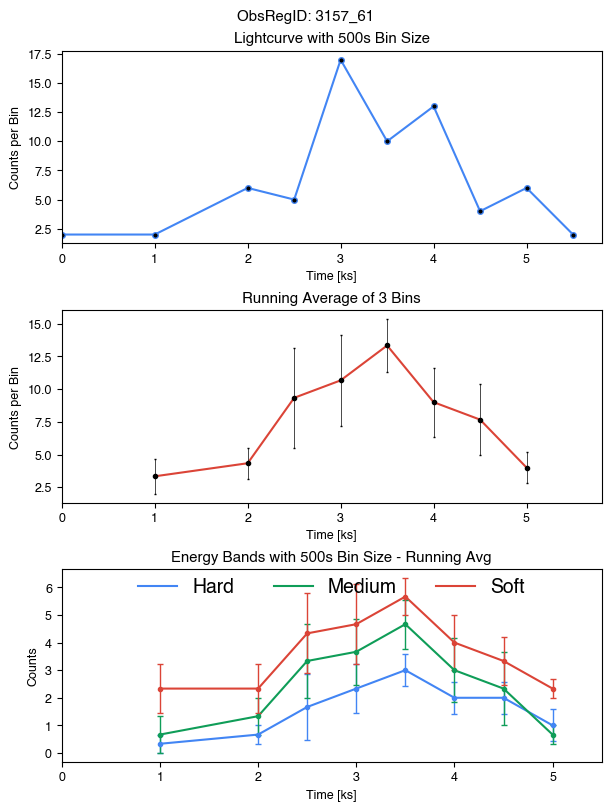

Name: 2CXO J103148.0+574339, ID: 3344-60, Date: 2002-05-01T20:19:00, Counts: 43
RA  157.9502794374249 DEC  57.727696605596286 Off-axis theta  7.93510420648884


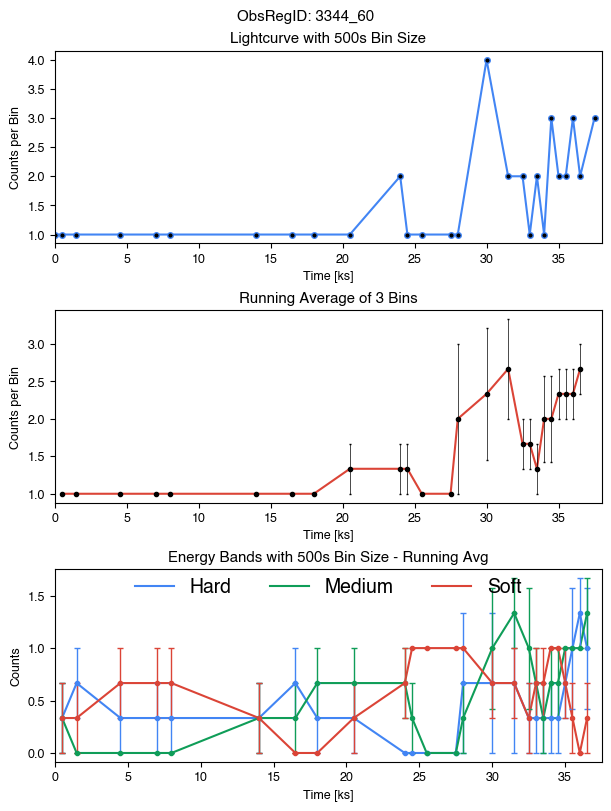

Name: 2CXO J103500.3+573032, ID: 3346-99, Date: 2002-04-30T02:25:48, Counts: 150
RA  158.75131952185552 DEC  57.509061784080544 Off-axis theta  8.36957911011171


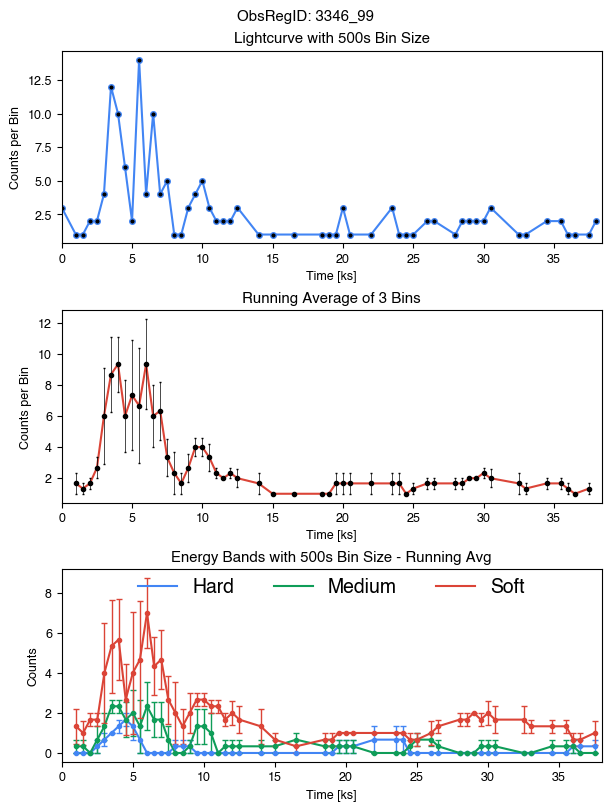

Name: 2CXO J103611.3+574128, ID: 3347-100, Date: 2002-05-02T14:37:23, Counts: 273
RA  159.0474327977413 DEC  57.69112477249197 Off-axis theta  18.71841275030214


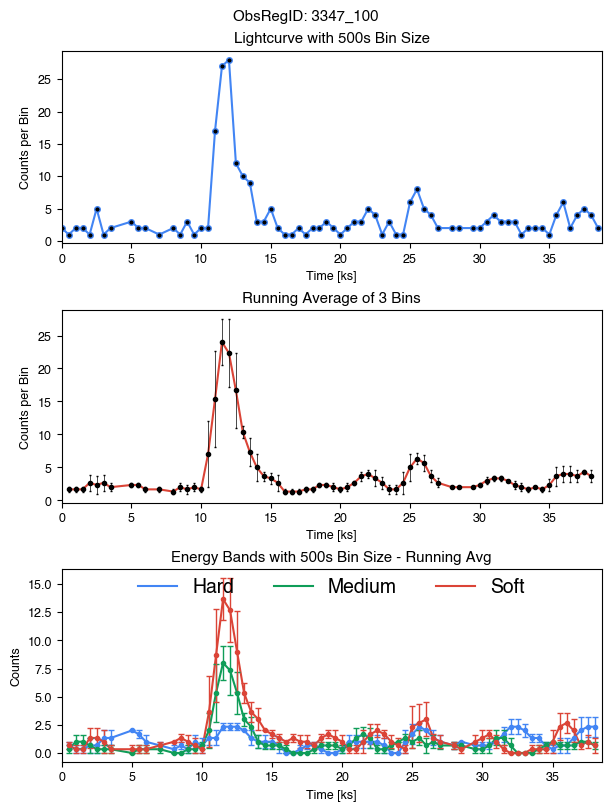

Name: 2CXO J142547.1+353954, ID: 3482-102, Date: 2002-06-09T04:10:02, Counts: 392
RA  216.44627306613245 DEC  35.6652093923498 Off-axis theta  4.605043636700879


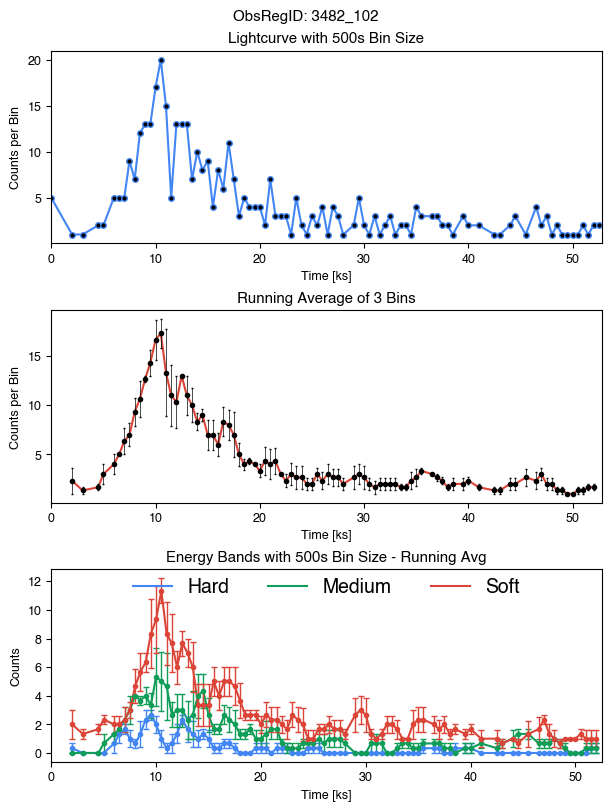

Name: 2CXO J142637.7+352706, ID: 3482-365, Date: 2002-06-09T04:10:02, Counts: 586
RA  216.6572327484696 DEC  35.45191090848678 Off-axis theta  14.97310233924


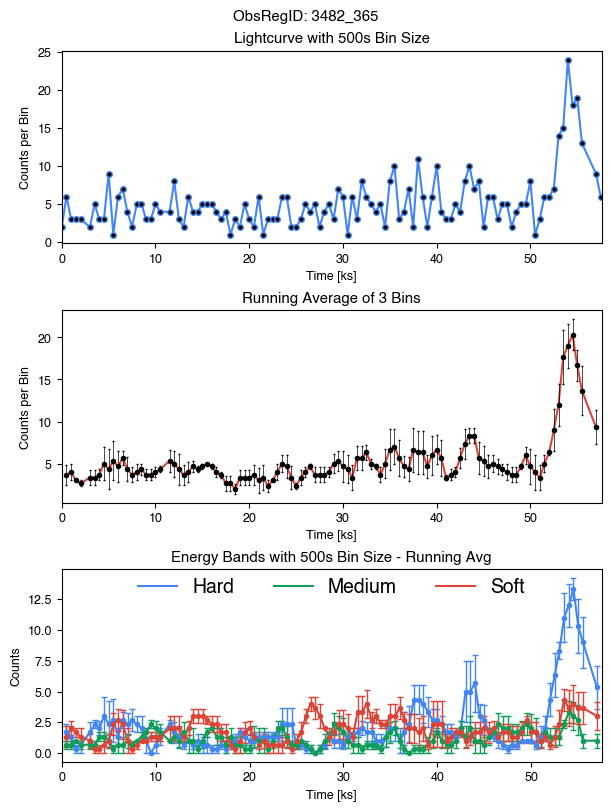

Name: 2CXO J080801.3+212028, ID: 3785-34, Date: 2003-01-03T15:01:00, Counts: 37
RA  122.00550029668152 DEC  21.341350310654907 Off-axis theta  6.847844570808571


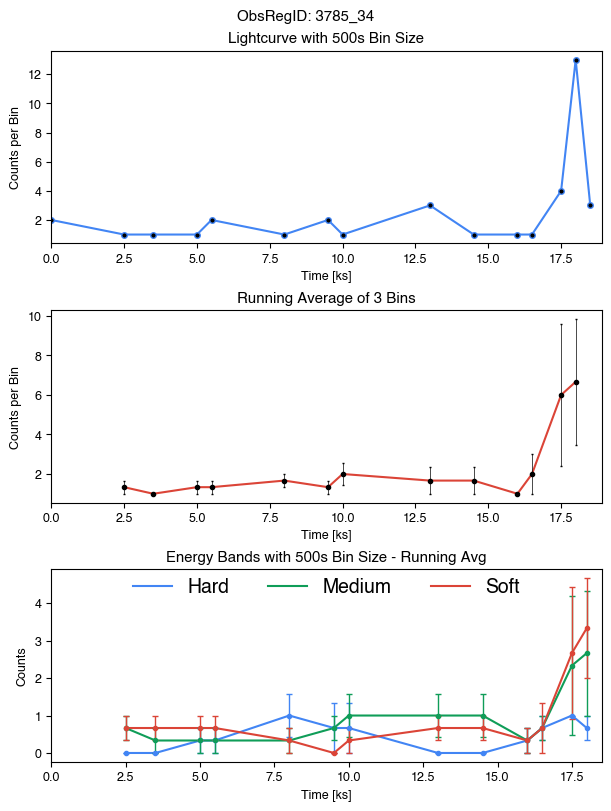

Name: 2CXO J123658.7+260914, ID: 3950-87, Date: 2003-02-08T19:27:36, Counts: 673
RA  189.24480375986127 DEC  26.153992418598637 Off-axis theta  11.68804180242547


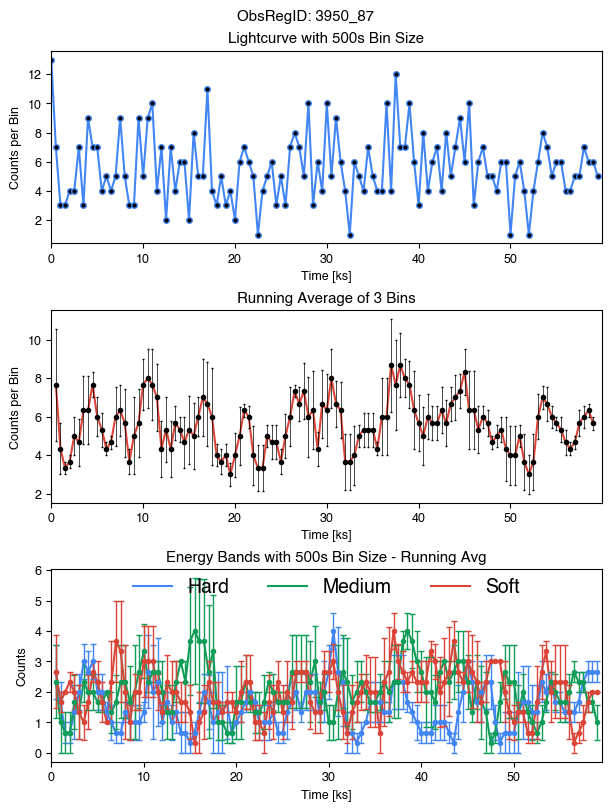

Name: 2CXO J112116.2+525318, ID: 3951-132, Date: 2003-07-05T01:13:55, Counts: 476
RA  170.3178803856797 DEC  52.88845956615242 Off-axis theta  14.63596236807776


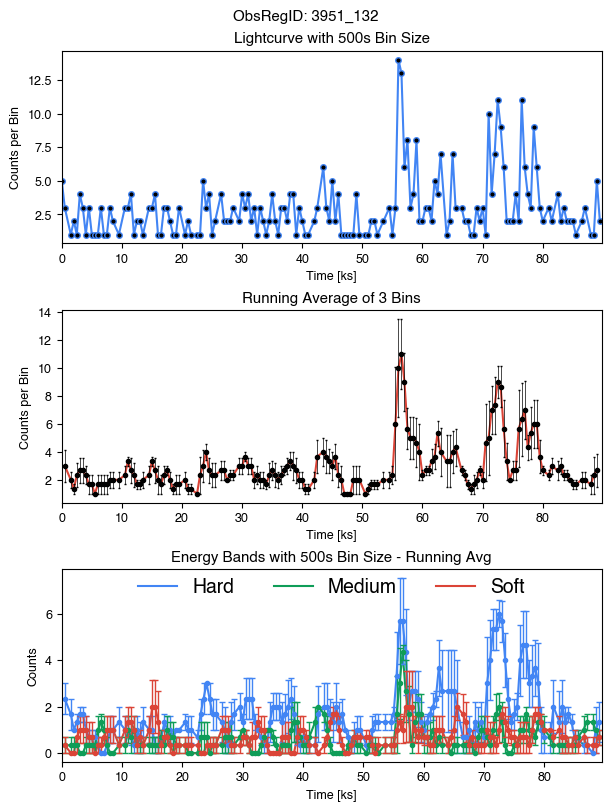

Name: 2CXO J231928.7+081707, ID: 3955-38, Date: 2003-09-24T05:41:52, Counts: 896
RA  349.8698120643584 DEC  8.285514669904025 Off-axis theta  11.91288576939816


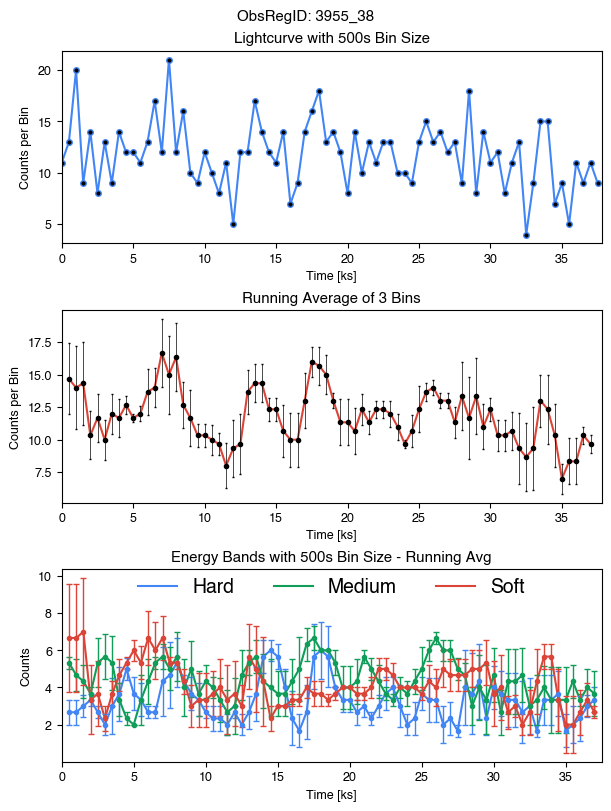

Name: 2CXO J130549.6+035340, ID: 3966-144, Date: 2003-11-29T07:44:48, Counts: 364
RA  196.4568292234202 DEC  3.894654046204016 Off-axis theta  6.326675352102941


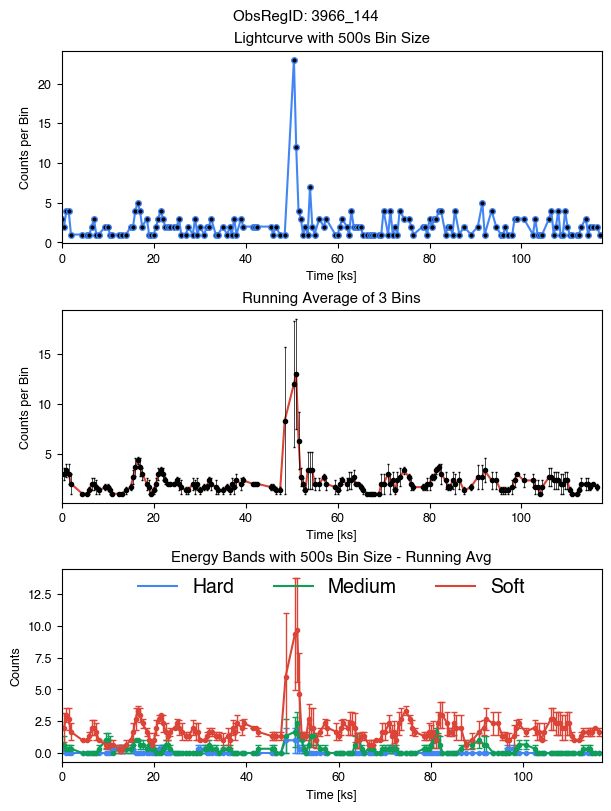

Name: 2CXO J151457.6+364817, ID: 3988-11, Date: 2003-10-05T00:20:30, Counts: 125
RA  228.7401234500603 DEC  36.80492793019381 Off-axis theta  2.651436865424099


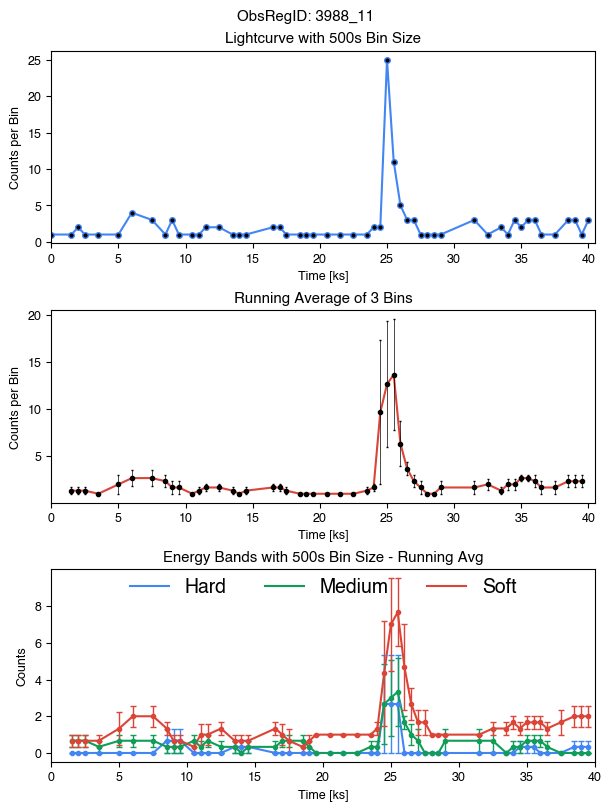

Name: 2CXO J145712.3+221446, ID: 4192-21, Date: 2003-09-05T18:21:09, Counts: 659
RA  224.30152669970312 DEC  22.24626129635355 Off-axis theta  2.754210370292518


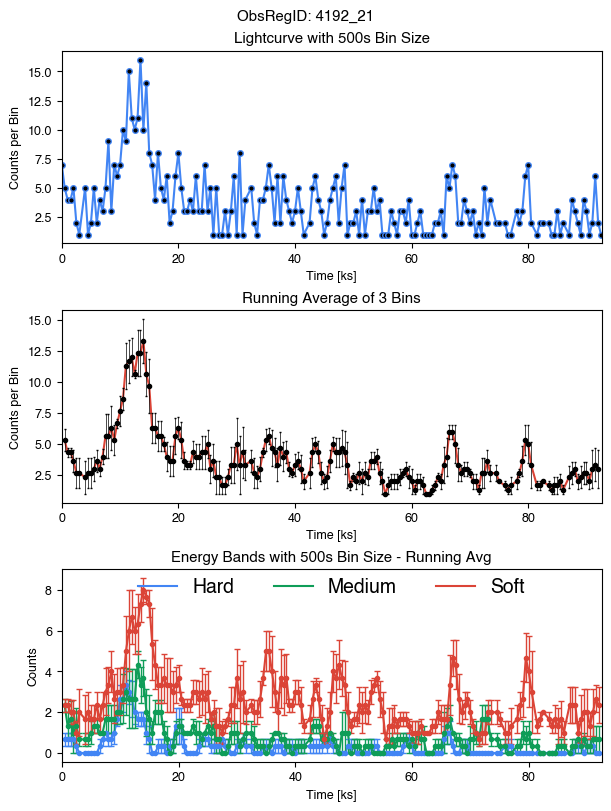

Name: 2CXO J145032.7+233838, ID: 4471-40, Date: 2004-11-24T08:07:52, Counts: 532
RA  222.63657466465335 DEC  23.643838903127406 Off-axis theta  16.43105660890592


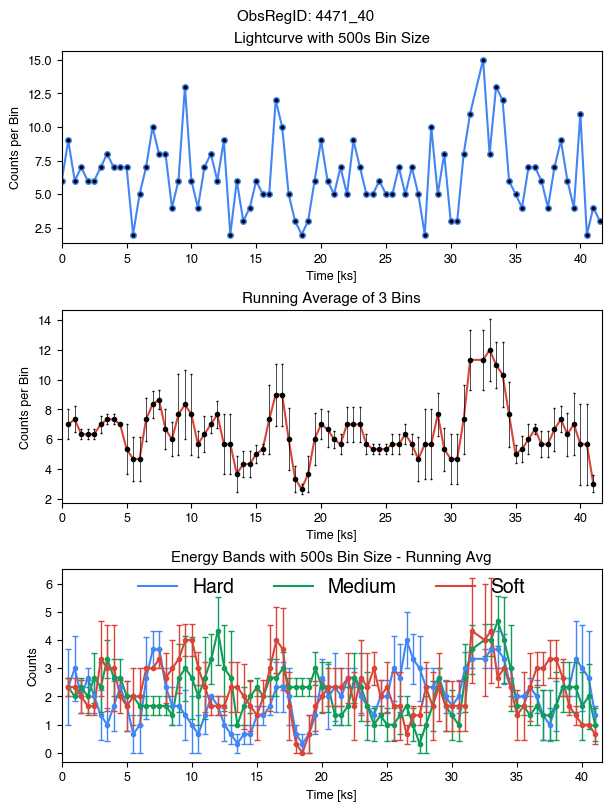

Name: 2CXO J121537.4+471353, ID: 4738-51, Date: 2004-02-19T06:42:03, Counts: 164
RA  183.90583781810267 DEC  47.23142083794305 Off-axis theta  6.807934185674217


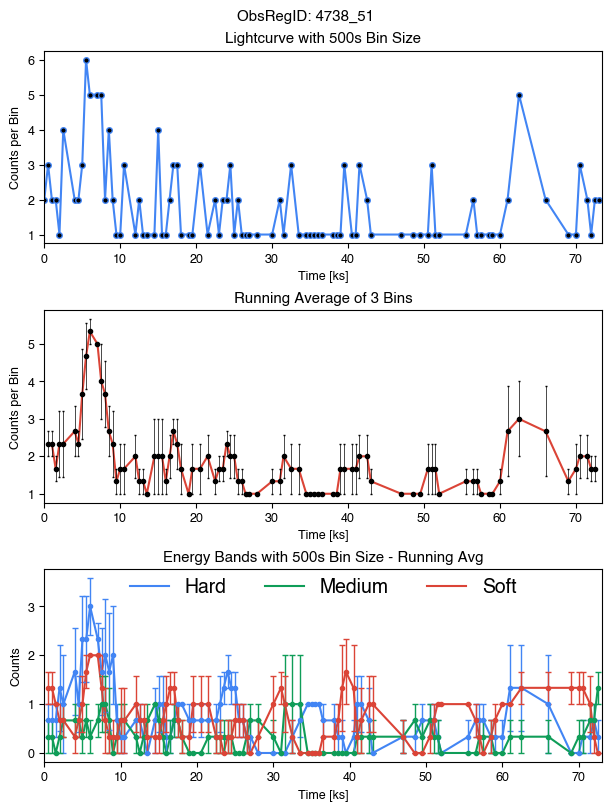

Name: 2CXO J121651.3+465820, ID: 4738-97, Date: 2004-02-19T06:42:03, Counts: 183
RA  184.21387700654373 DEC  46.9722275752922 Off-axis theta  14.56878422979556


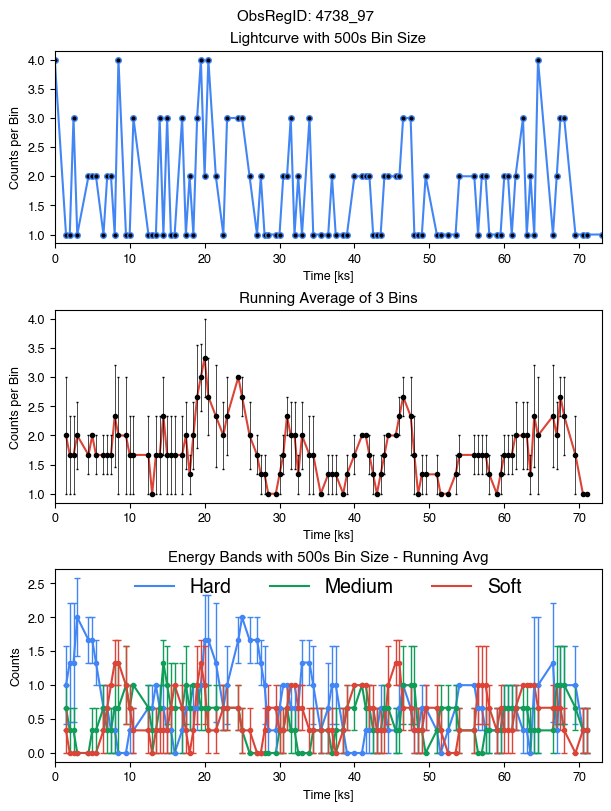

Name: 2CXO J083513.3+554625, ID: 4940-136, Date: 2004-01-03T11:02:34, Counts: 178
RA  128.80568098045603 DEC  55.77378485512138 Off-axis theta  11.72148450608581


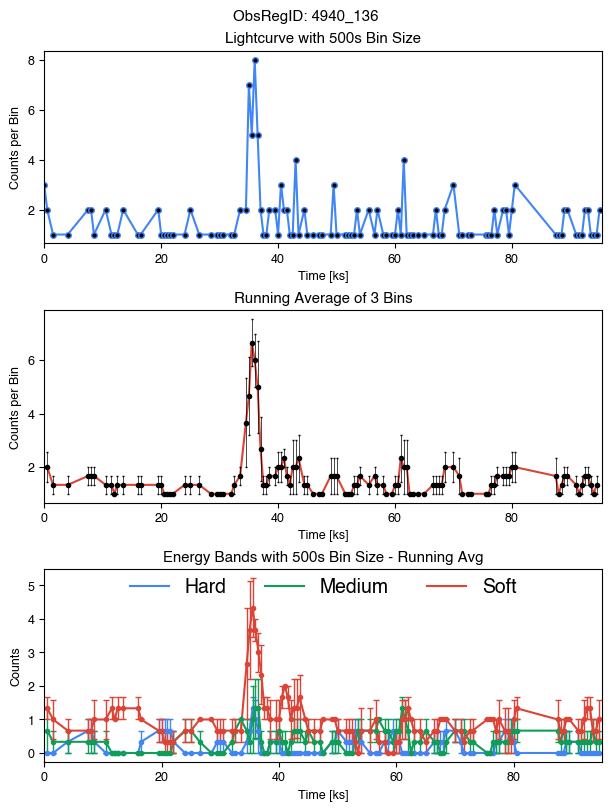

Name: 2CXO J083441.3+553518, ID: 4940-20, Date: 2004-01-03T11:02:34, Counts: 29
RA  128.67232304095188 DEC  55.58844013312208 Off-axis theta  1.043150994766214


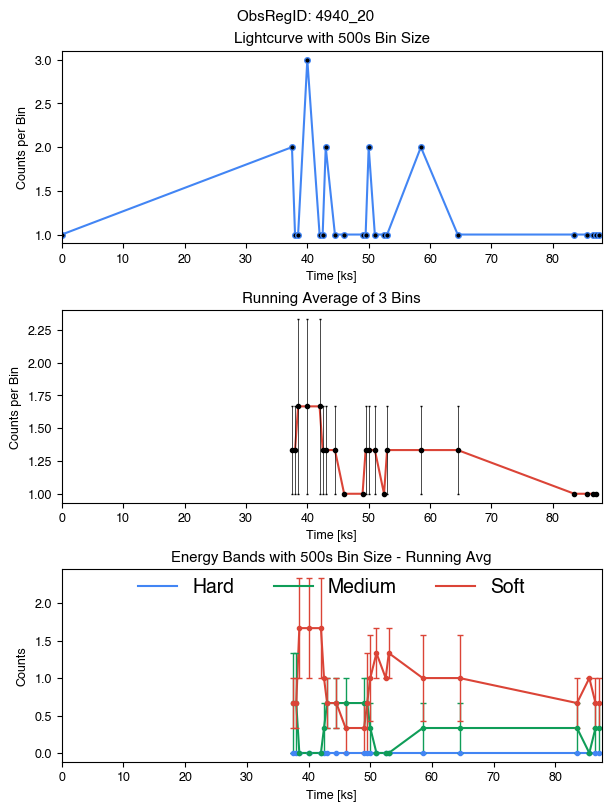

Name: 2CXO J085325.7+232919, ID: 4979-41, Date: 2004-01-05T07:47:14, Counts: 137
RA  133.35731371383457 DEC  23.488605965282822 Off-axis theta  4.387795122594774


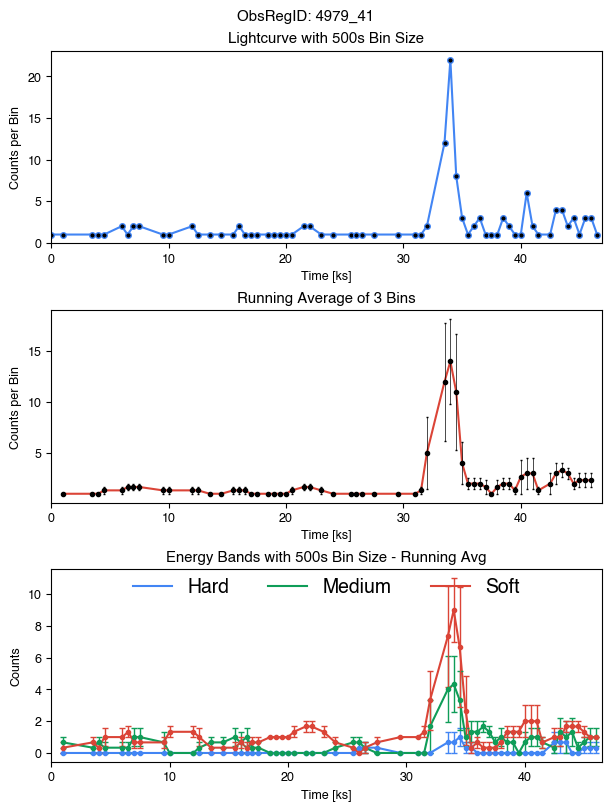

Name: 2CXO J104858.7+585843, ID: 5026-44, Date: 2004-09-18T16:28:14, Counts: 121
RA  162.24479206070828 DEC  58.97874512986362 Off-axis theta  7.614686868934013


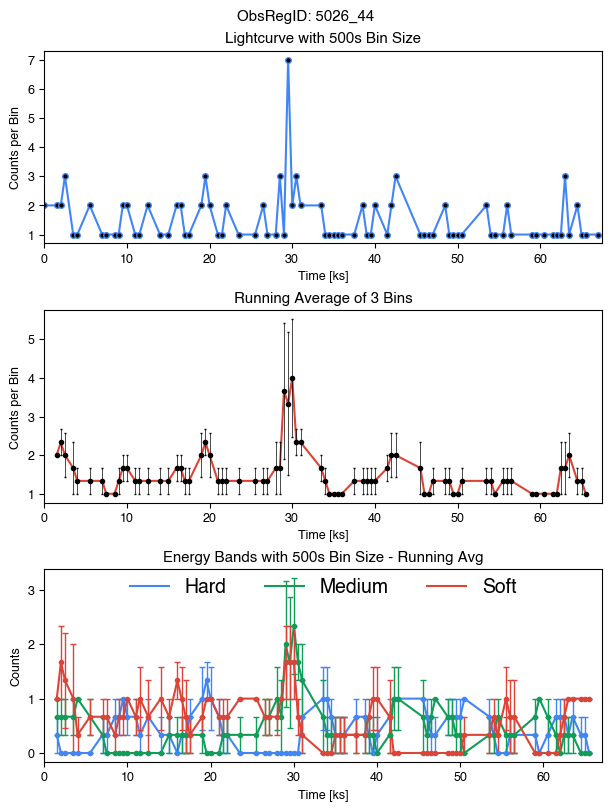

Name: 2CXO J084222.2+130949, ID: 5627-40, Date: 2005-01-15T14:34:42, Counts: 89
RA  130.59285778919127 DEC  13.16383177008634 Off-axis theta  12.92221080282693


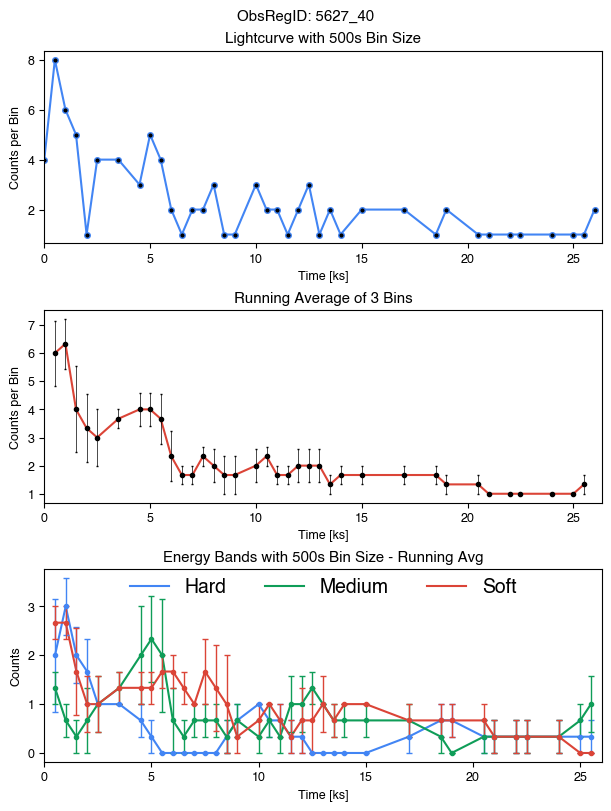

Name: 2CXO J143902.2+441613, ID: 5721-5, Date: 2006-03-26T04:08:49, Counts: 86
RA  219.7592766607065 DEC  44.27053866076472 Off-axis theta  6.008188961965302


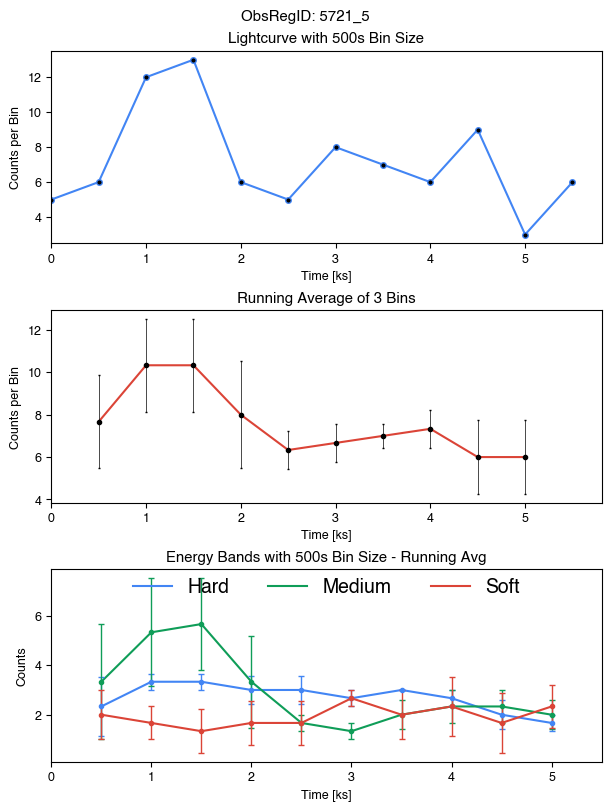

Name: 2CXO J101951.0+253431, ID: 5792-44, Date: 2005-02-17T04:36:32, Counts: 93
RA  154.96284343759885 DEC  25.57526608040156 Off-axis theta  10.92154362179639


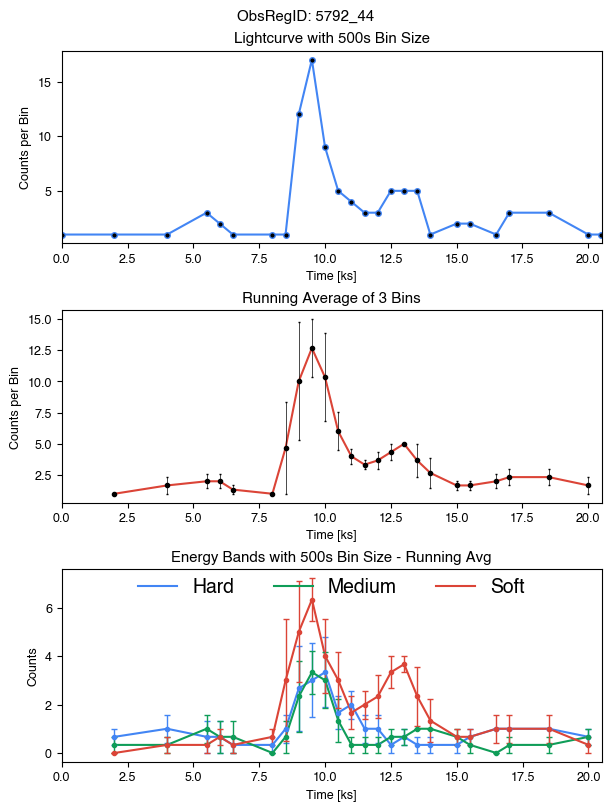

Name: 2CXO J141920.5+530028, ID: 5845-139, Date: 2005-03-24T14:48:11, Counts: 55
RA  214.83566383264588 DEC  53.00795036572026 Off-axis theta  10.14981479878689


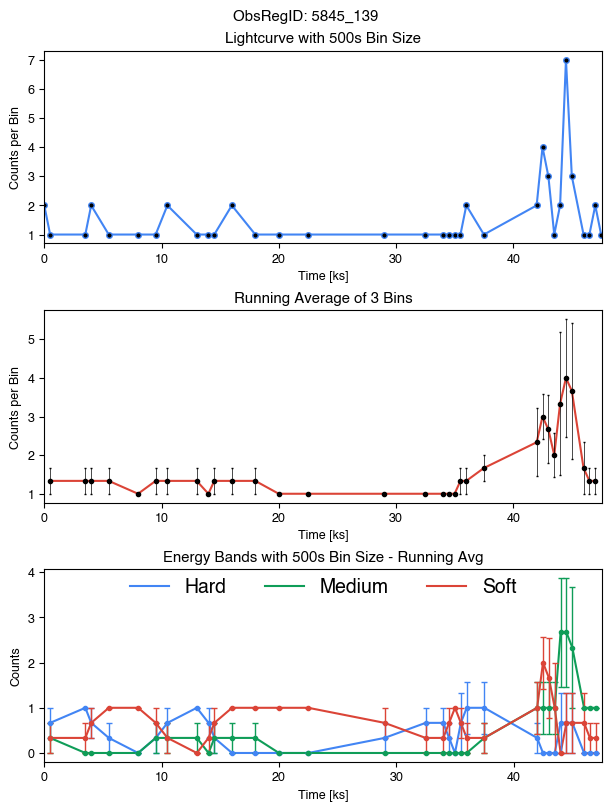

Name: 2CXO J142133.8+530246, ID: 5845-67, Date: 2005-03-24T14:48:11, Counts: 88
RA  215.39116457683545 DEC  53.046183114346015 Off-axis theta  10.05390894527185


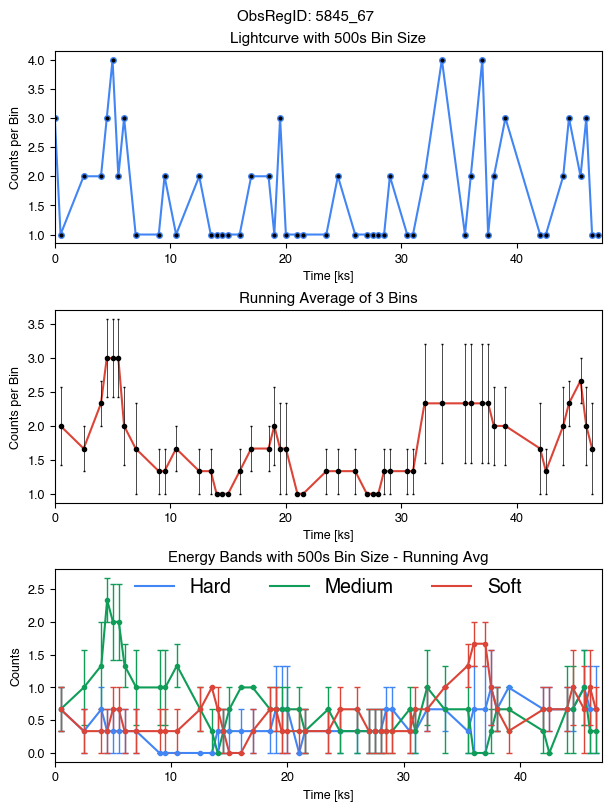

Name: 2CXO J141946.3+525942, ID: 5846-252, Date: 2005-03-27T05:06:25, Counts: 1377
RA  214.943226203854 DEC  52.99517581554613 Off-axis theta  6.621239329541236


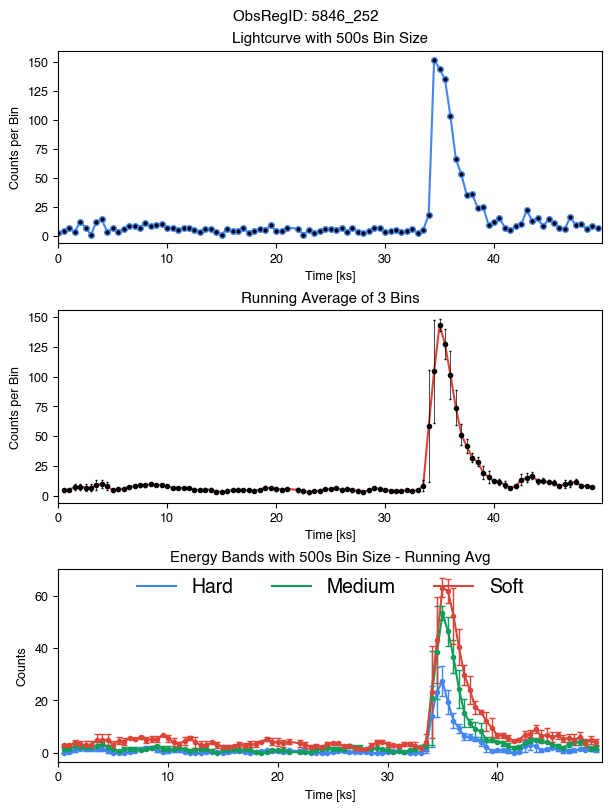

Name: 2CXO J141840.2+523959, ID: 5849-62, Date: 2005-10-11T13:05:29, Counts: 43
RA  214.66781184806572 DEC  52.666554585162274 Off-axis theta  3.040794856287551


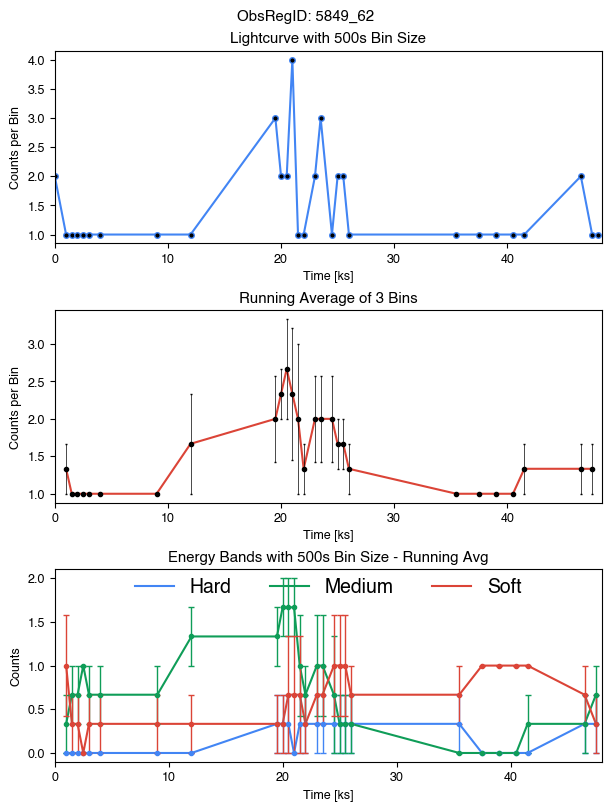

Name: 2CXO J141818.4+524356, ID: 5850-99, Date: 2005-10-14T05:32:42, Counts: 91
RA  214.57696172164765 DEC  52.73228220779486 Off-axis theta  5.110460543830865


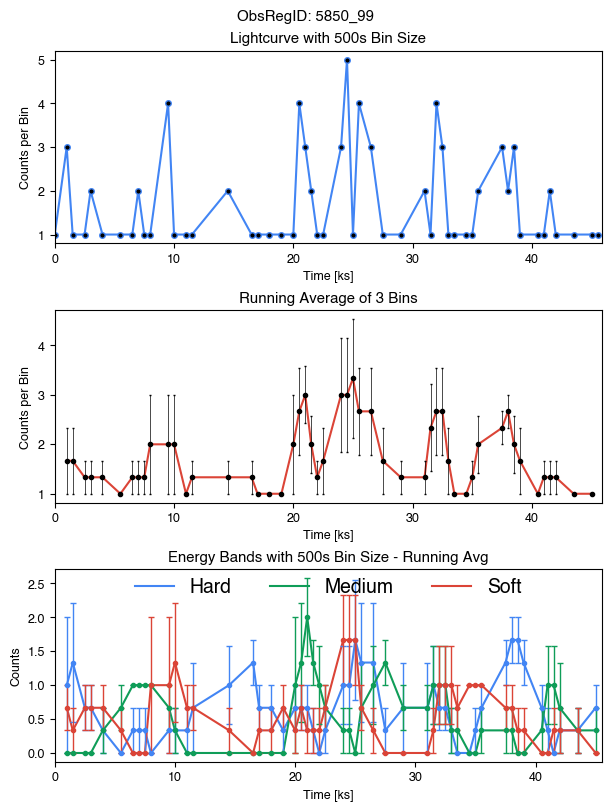

Name: 2CXO J141908.3+532550, ID: 5886-16, Date: 2005-09-17T17:51:33, Counts: 237
RA  214.78452847346728 DEC  53.43063112015662 Off-axis theta  1.955707321479212


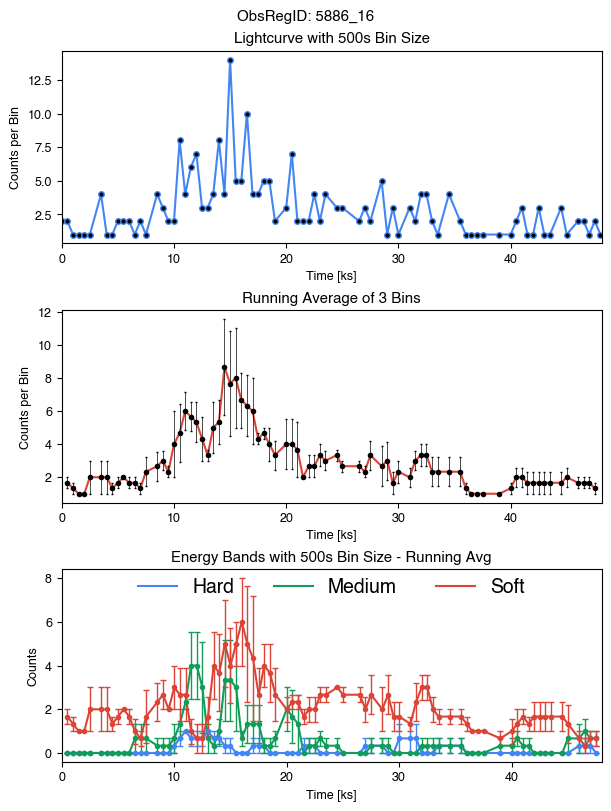

Name: 2CXO J141946.3+525942, ID: 6214-252, Date: 2005-09-28T08:26:27, Counts: 403
RA  214.943226203854 DEC  52.99517581554613 Off-axis theta  6.736542562540239


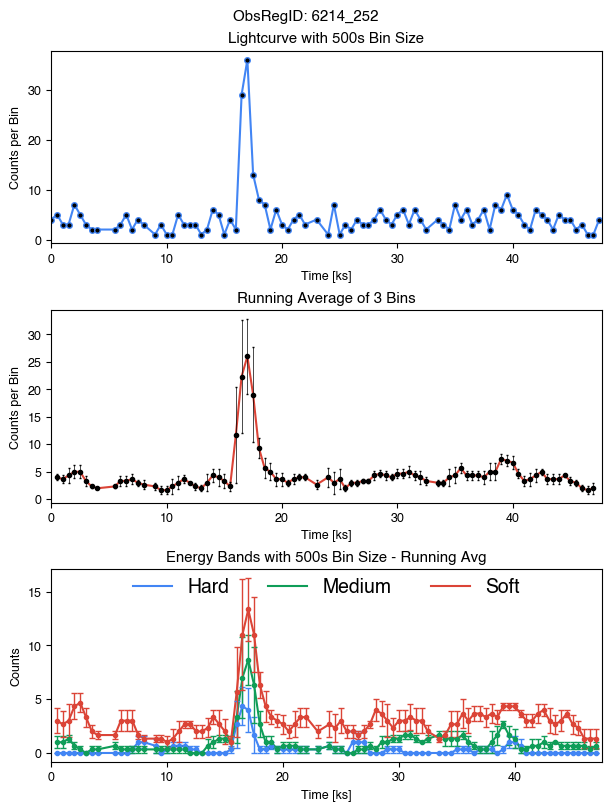

Name: 2CXO J141946.3+525942, ID: 6215-252, Date: 2005-09-29T16:26:20, Counts: 755
RA  214.943226203854 DEC  52.99517581554613 Off-axis theta  6.744305221564653


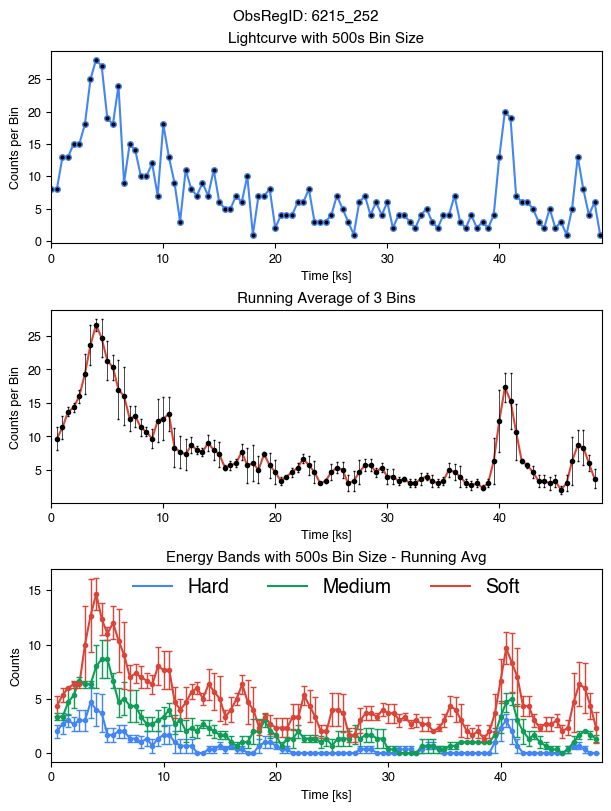

Name: 2CXO J144752.0+091412, ID: 6792-153, Date: 2006-05-29T15:15:41, Counts: 928
RA  221.96673754582685 DEC  9.236898174750966 Off-axis theta  12.44671918707924


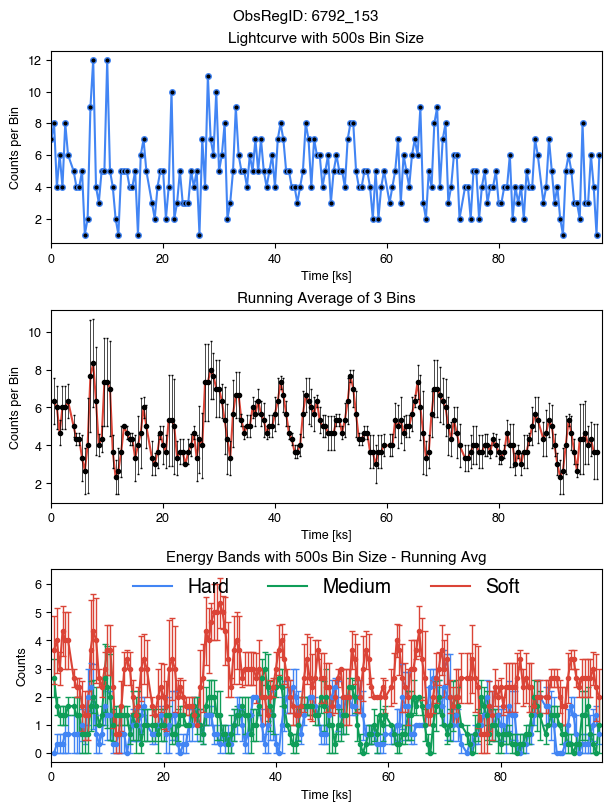

Name: 2CXO J144700.7+092321, ID: 6792-57, Date: 2006-05-29T15:15:41, Counts: 107
RA  221.7531974269175 DEC  9.389429523816585 Off-axis theta  3.177650331398015


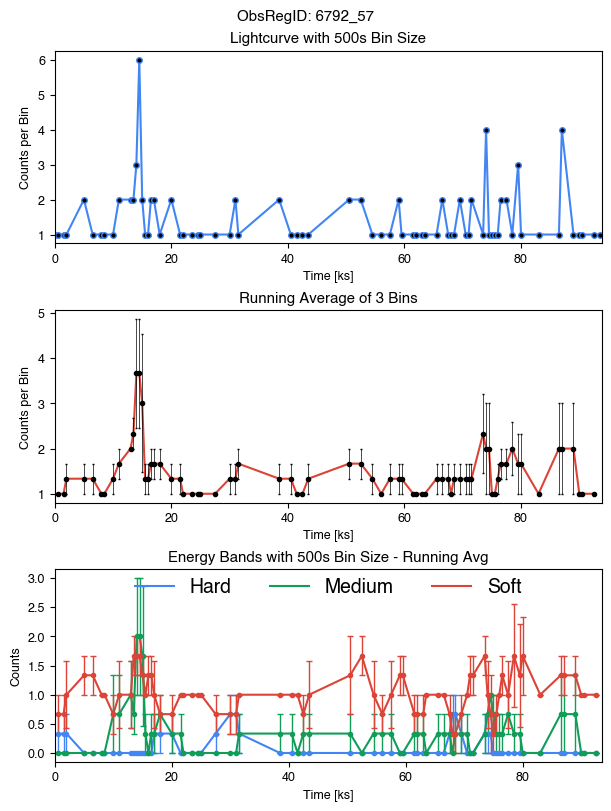

Name: 2CXO J131955.6+330429, ID: 6941-38, Date: 2005-11-01T17:01:05, Counts: 64
RA  199.98171779906545 DEC  33.074934105011025 Off-axis theta  6.889778369218918


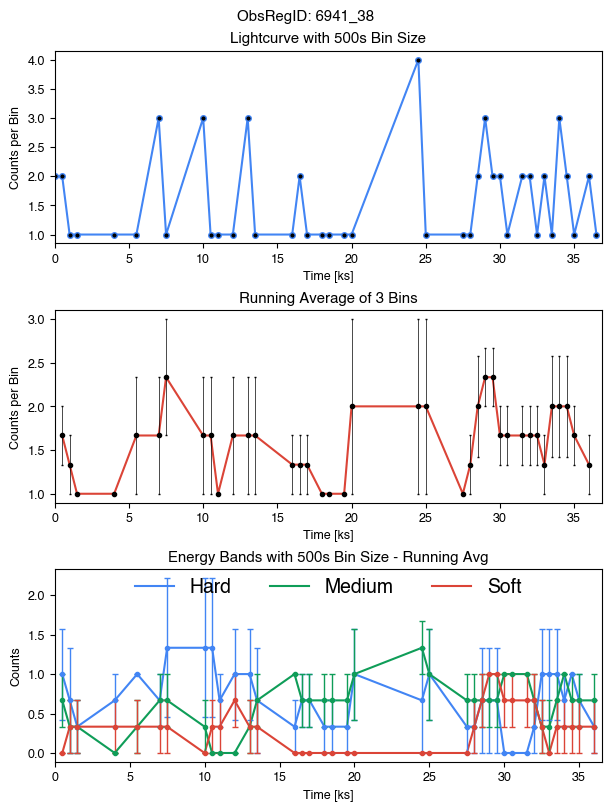

Name: 2CXO J102203.7+383321, ID: 6942-31, Date: 2006-10-14T15:04:25, Counts: 45
RA  155.5157163867334 DEC  38.55592509937114 Off-axis theta  2.023321059190552


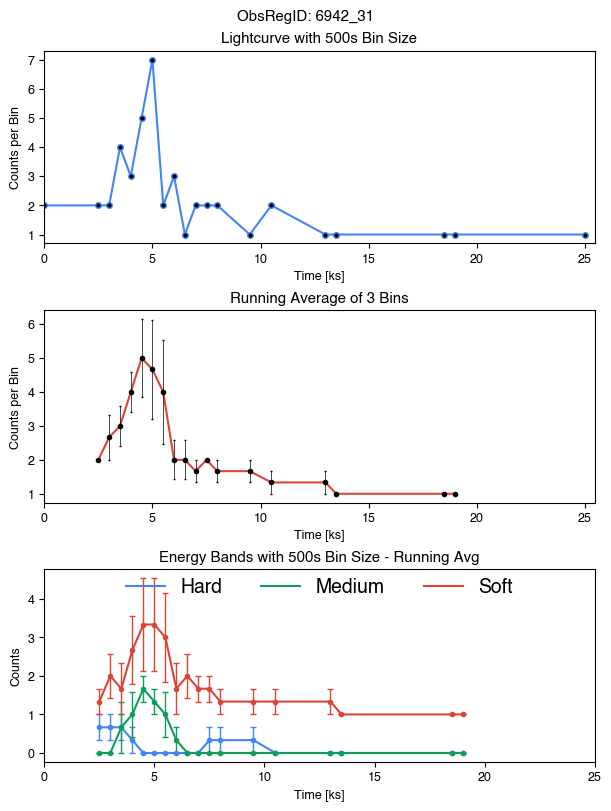

Name: 2CXO J121944.1+292849, ID: 7077-340, Date: 2006-03-16T14:27:20, Counts: 384
RA  184.93381070771727 DEC  29.4803123278782 Off-axis theta  12.21340420866717


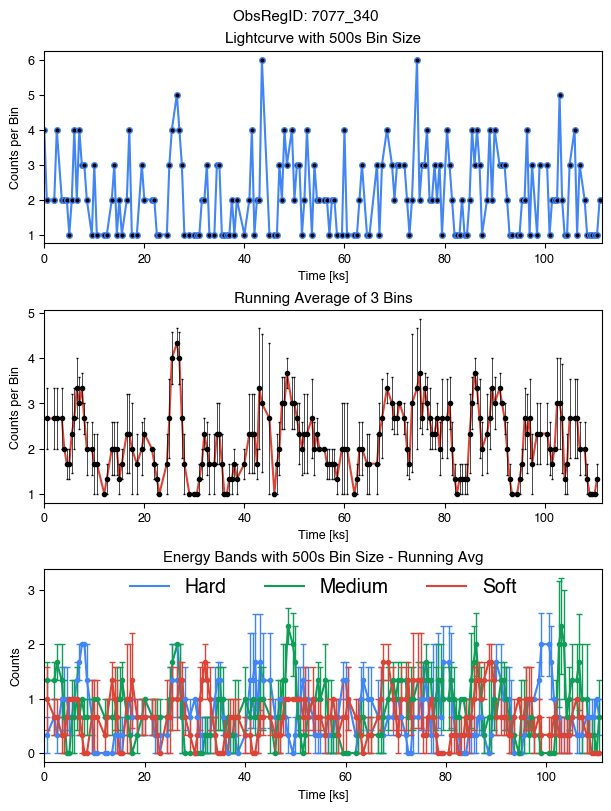

Name: 2CXO J102043.8+081421, ID: 7808-42, Date: 2008-01-18T09:52:23, Counts: 775
RA  155.18290167078294 DEC  8.239376081557754 Off-axis theta  10.86527766452184


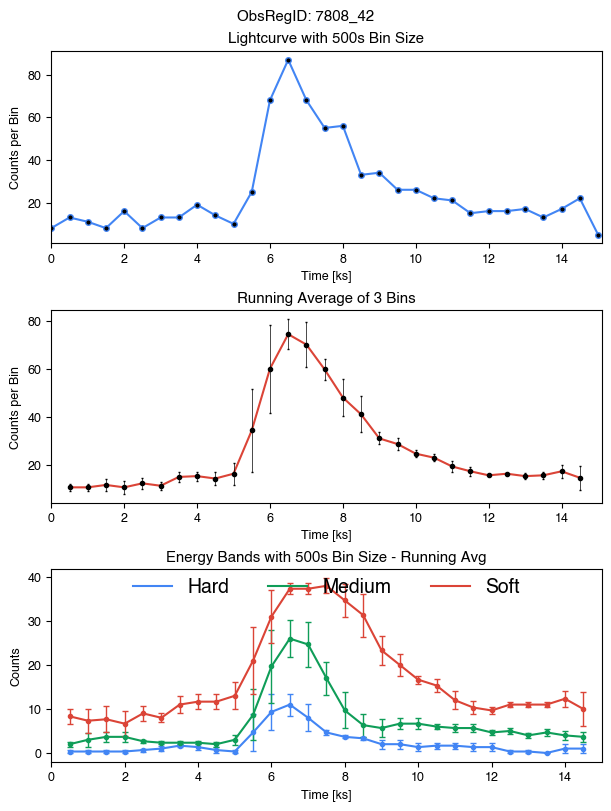

Name: 2CXO J081920.5+203756, ID: 7936-37, Date: 2007-06-01T17:22:03, Counts: 57
RA  124.83541018460552 DEC  20.632314931773365 Off-axis theta  4.90059966577943


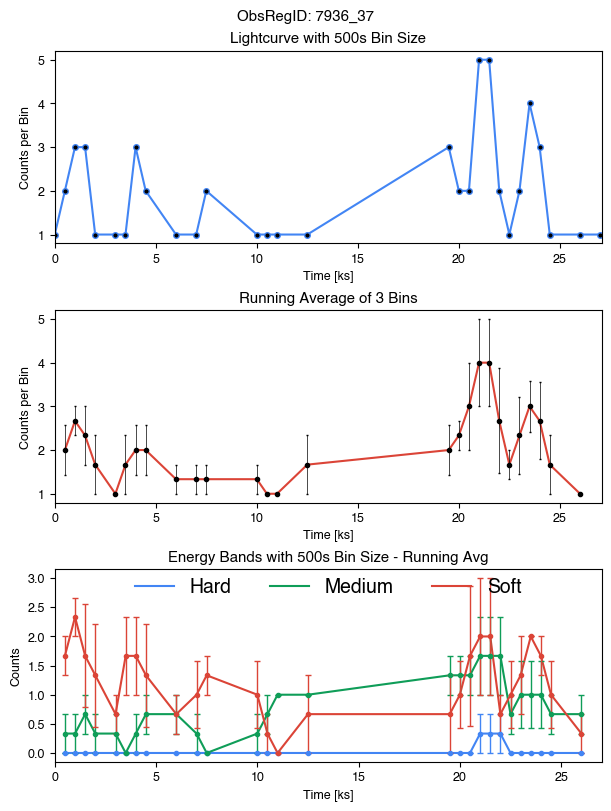

Name: 2CXO J143426.0+330658, ID: 7947-13, Date: 2007-05-05T23:08:24, Counts: 50
RA  218.6085339553348 DEC  33.11624331522121 Off-axis theta  1.883104880986


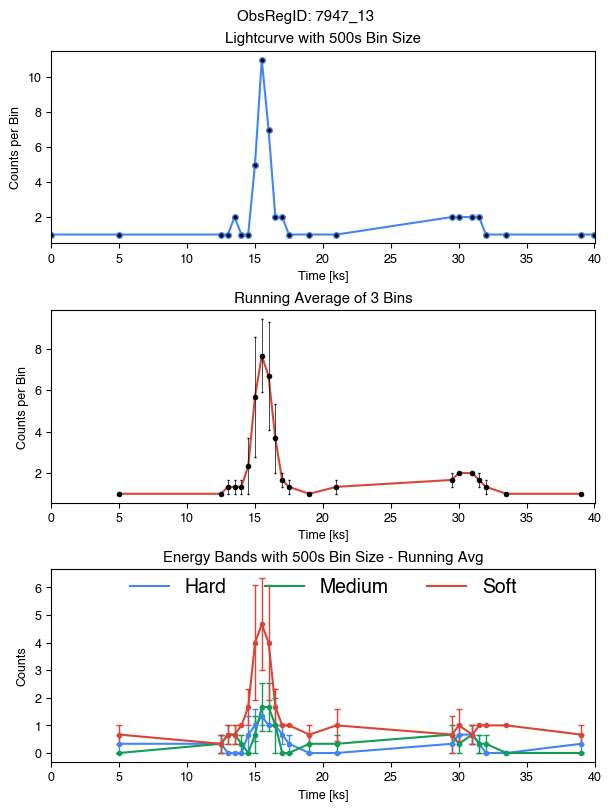

Name: 2CXO J095848.1+022408, ID: 8009-45, Date: 2007-01-02T18:18:20, Counts: 471
RA  149.7008745984058 DEC  2.402537800648612 Off-axis theta  6.24319286491


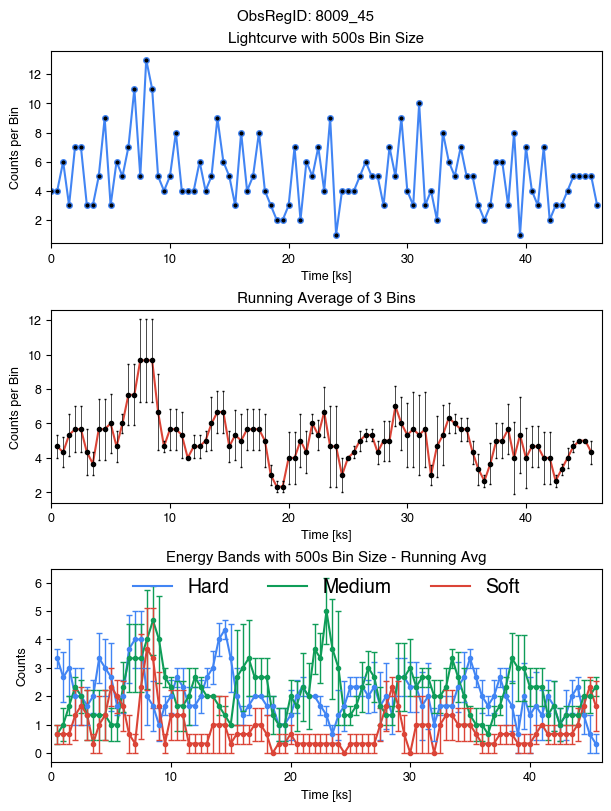

Name: 2CXO J151433.9+363502, ID: 800-11, Date: 2000-06-06T16:19:59, Counts: 237
RA  228.6416582254202 DEC  36.58386389638808 Off-axis theta  3.278358348751035


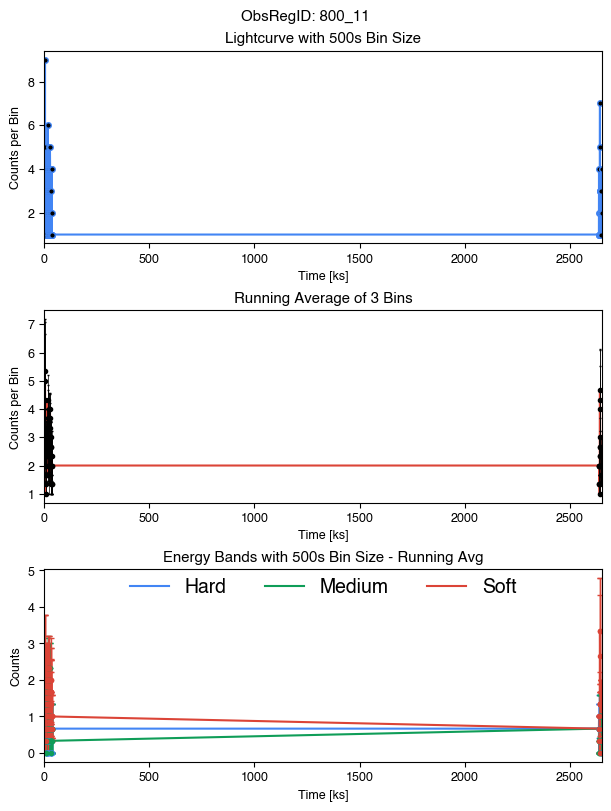

Name: 2CXO J151423.7+363511, ID: 800-13, Date: 2000-06-06T16:19:59, Counts: 303
RA  228.59916499279015 DEC  36.58650132009683 Off-axis theta  1.421378055042936


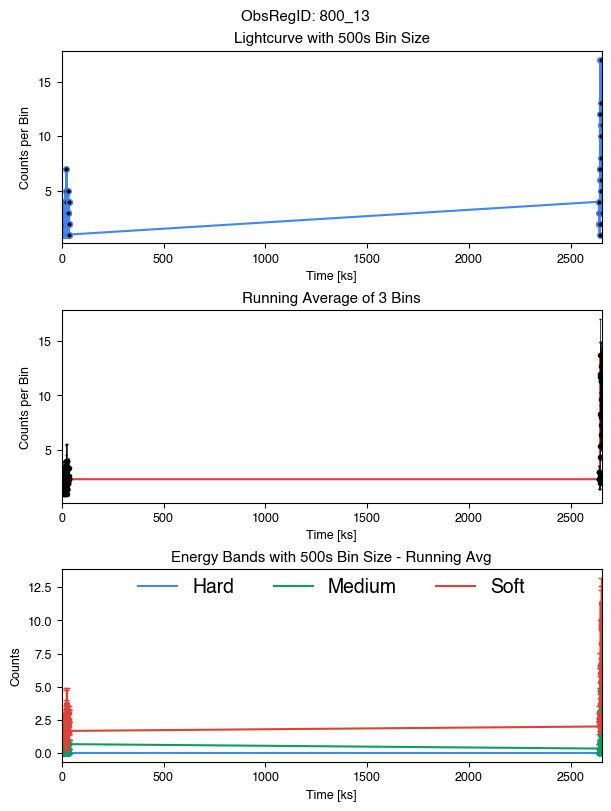

Name: 2CXO J151453.6+364354, ID: 800-148, Date: 2000-06-06T16:19:59, Counts: 81
RA  228.72368166347007 DEC  36.73169247599256 Off-axis theta  10.43494512401749


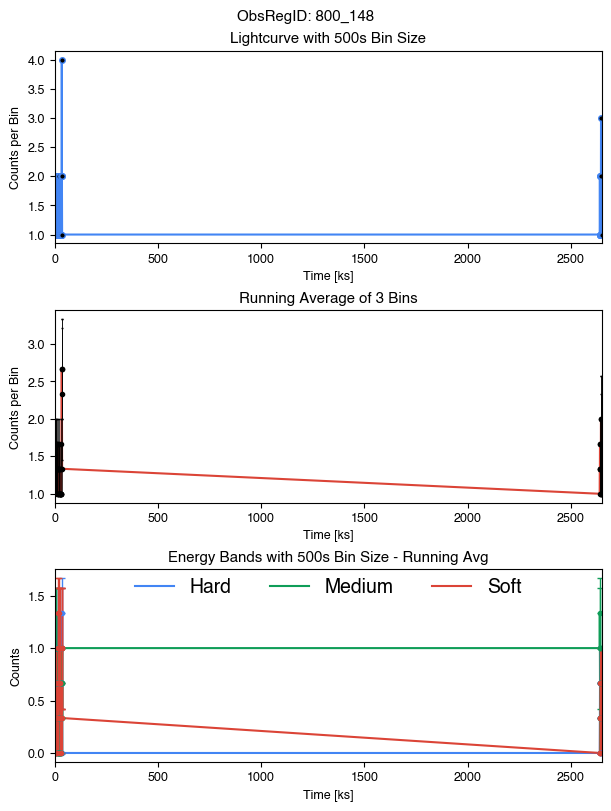

Name: 2CXO J151447.0+364150, ID: 800-37, Date: 2000-06-06T16:19:59, Counts: 299
RA  228.6961115886444 DEC  36.69725427317292 Off-axis theta  8.029027693881796


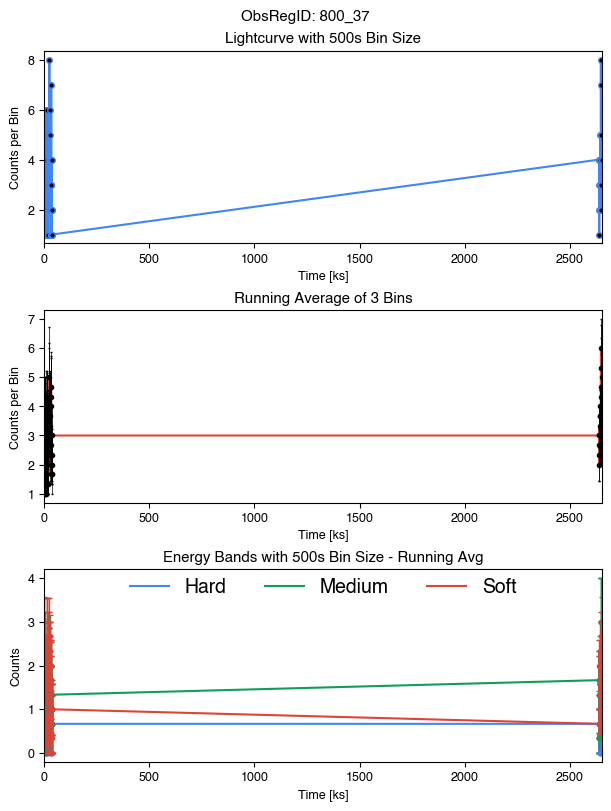

Name: 2CXO J151357.7+364215, ID: 800-38, Date: 2000-06-06T16:19:59, Counts: 88
RA  228.49047430188045 DEC  36.704107492865376 Off-axis theta  7.387393000015781


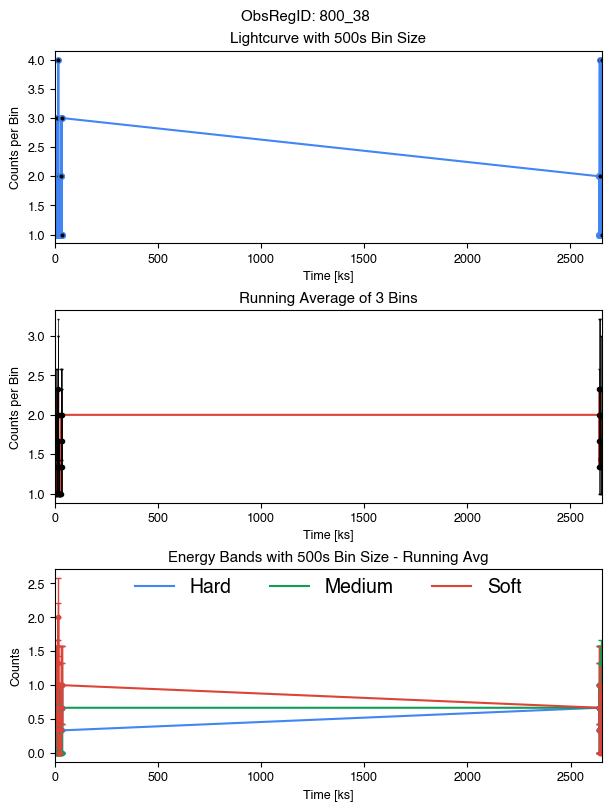

Name: 2CXO J151455.7+364313, ID: 800-63, Date: 2000-06-06T16:19:59, Counts: 87
RA  228.73232296474123 DEC  36.72047119564989 Off-axis theta  10.26139978328064


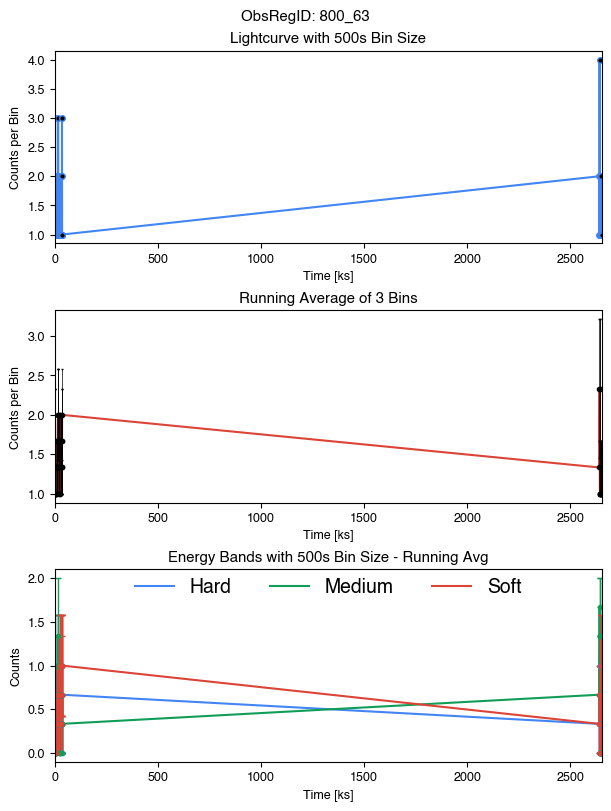

Name: 2CXO J100219.4+015536, ID: 8010-173, Date: 2007-04-27T19:05:04, Counts: 232
RA  150.58120633783108 DEC  1.9269027059051025 Off-axis theta  13.13758059496868


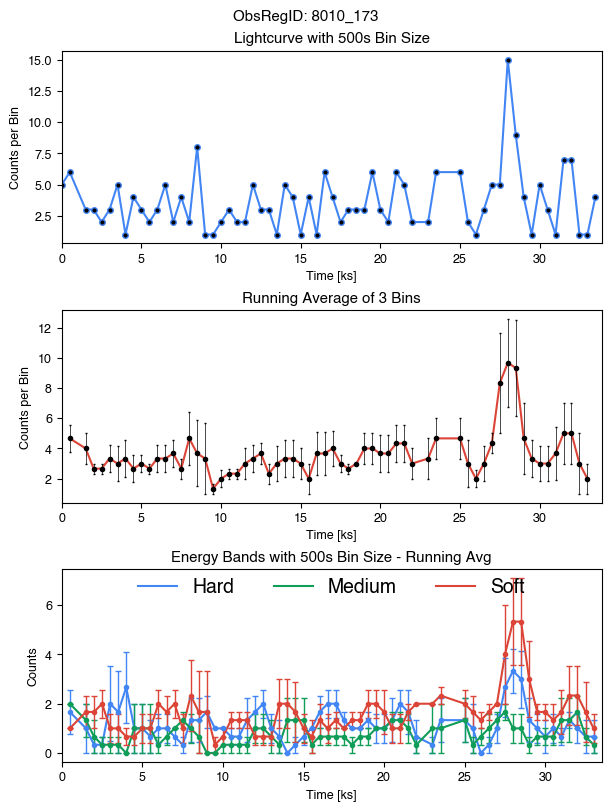

Name: 2CXO J100049.9+020500, ID: 8012-16, Date: 2007-01-04T05:47:50, Counts: 721
RA  150.20795614842973 DEC  2.083327920443309 Off-axis theta  5.04047922254


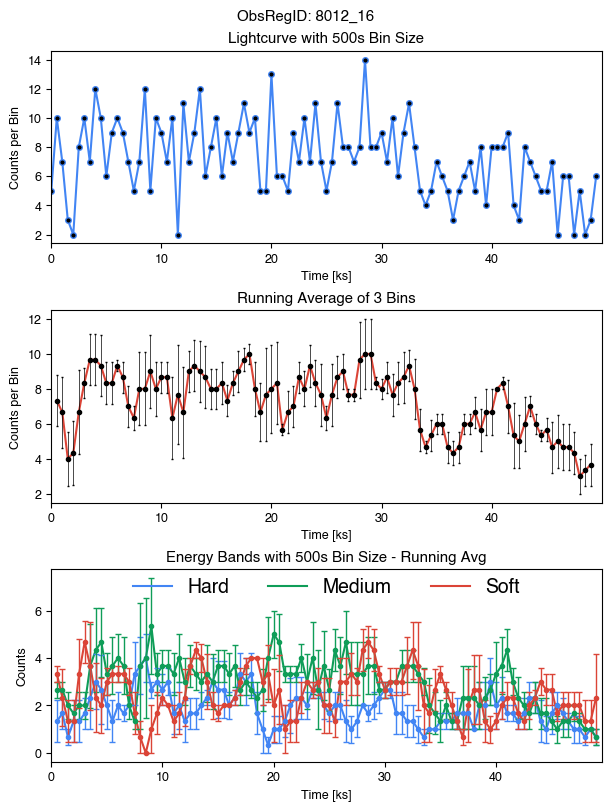

Name: 2CXO J100025.2+015852, ID: 8017-28, Date: 2007-04-04T18:06:54, Counts: 960
RA  150.10523098077238 DEC  1.981112378335817 Off-axis theta  7.050116073149


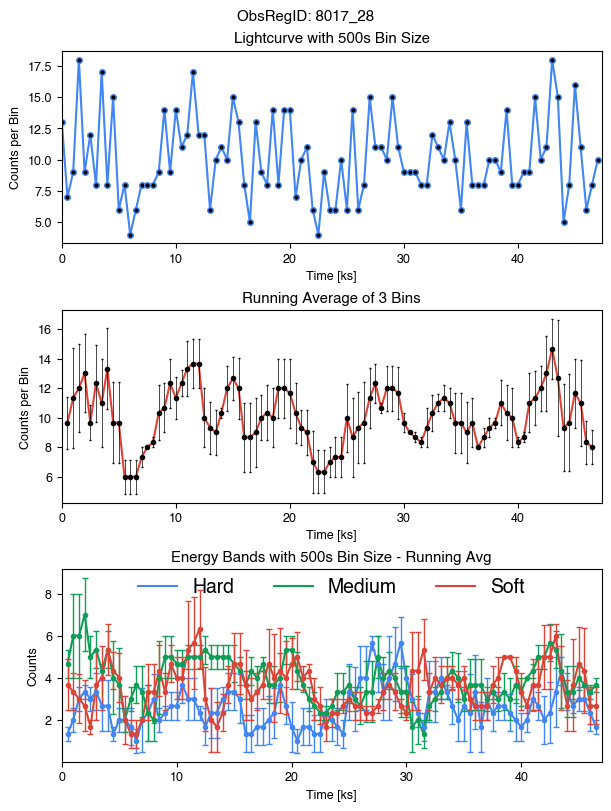

Name: 2CXO J100017.5+020012, ID: 8017-35, Date: 2007-04-04T18:06:54, Counts: 59
RA  150.07301756171336 DEC  2.0034604083612444 Off-axis theta  9.388994249196648


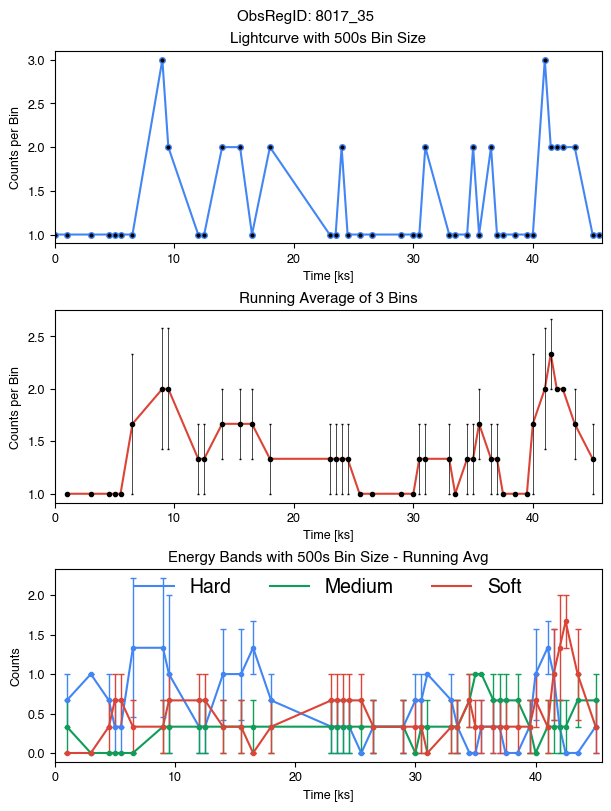

Name: 2CXO J095924.4+015954, ID: 8027-94, Date: 2007-04-14T14:15:52, Counts: 643
RA  149.8519543809149 DEC  1.9984206692901276 Off-axis theta  11.96288488669667


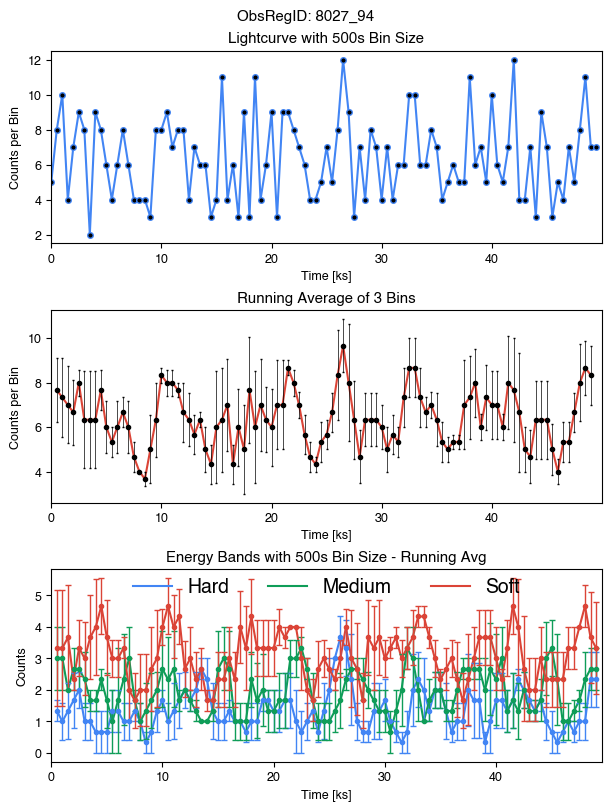

Name: 2CXO J221747.1+001648, ID: 8035-74, Date: 2007-10-04T04:49:27, Counts: 80
RA  334.44658502246443 DEC  0.2800195505904873 Off-axis theta  2.883521184555508


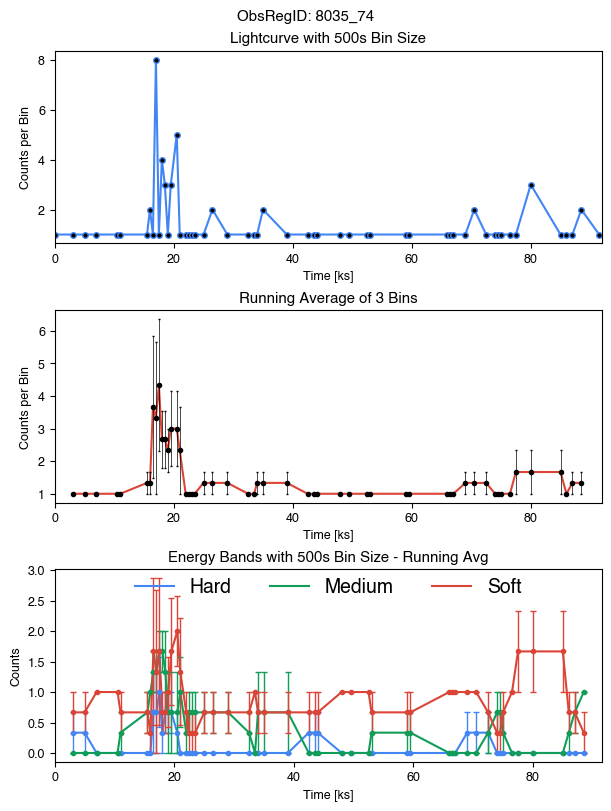

Name: 2CXO J093159.0+551155, ID: 805-70, Date: 2000-02-08T18:24:15, Counts: 594
RA  142.99588728385356 DEC  55.1988795732227 Off-axis theta  16.98874096386546


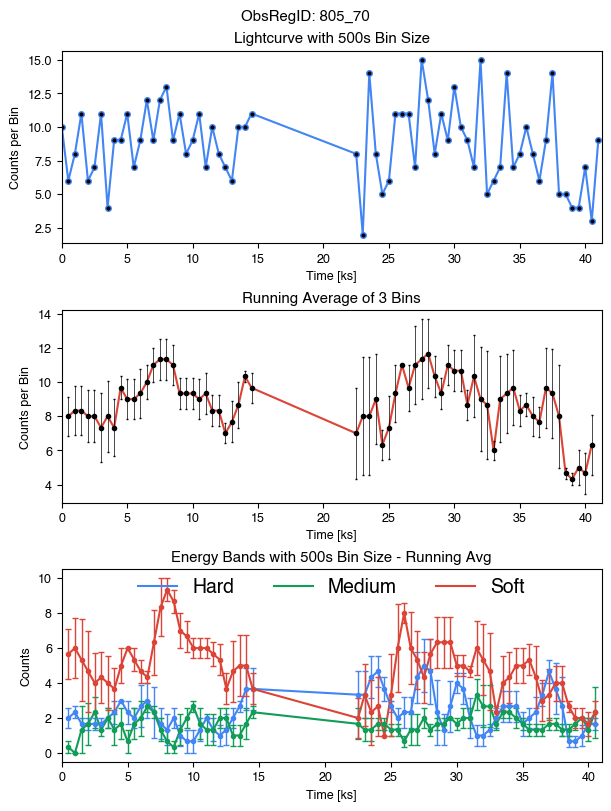

Name: 2CXO J100040.3+023656, ID: 8122-37, Date: 2007-01-20T10:31:47, Counts: 59
RA  150.16809263902644 DEC  2.6156968249741257 Off-axis theta  6.269094944174


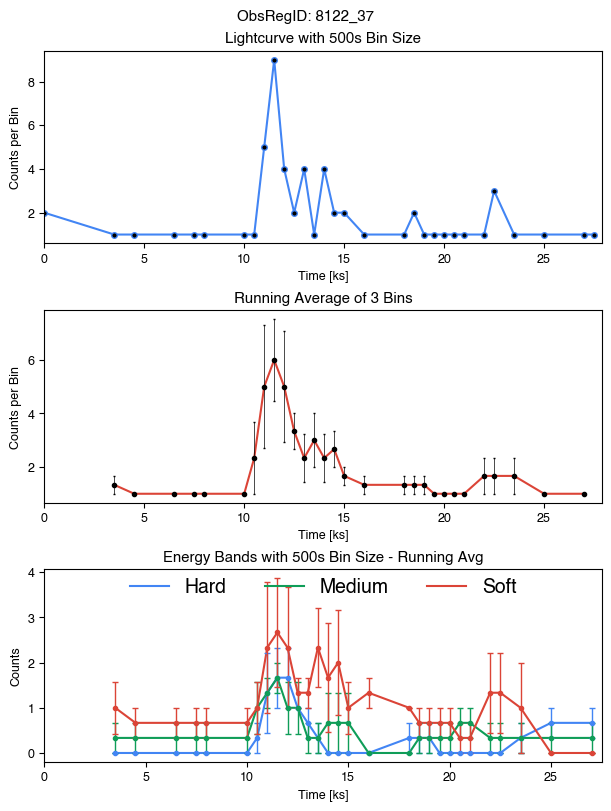

Name: 2CXO J084057.7+323642, ID: 8500-114, Date: 2006-12-30T14:53:39, Counts: 84
RA  130.2406547028503 DEC  32.61188089091004 Off-axis theta  10.93397381399428


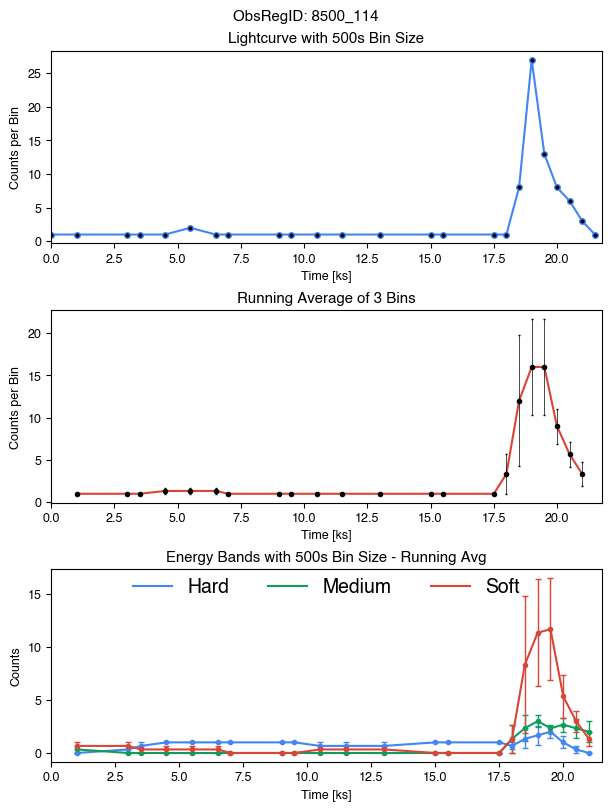

Name: 2CXO J151651.8+070832, ID: 890-54, Date: 2000-09-03T06:16:34, Counts: 140
RA  229.21619576463831 DEC  7.142475036565716 Off-axis theta  8.052094773741532


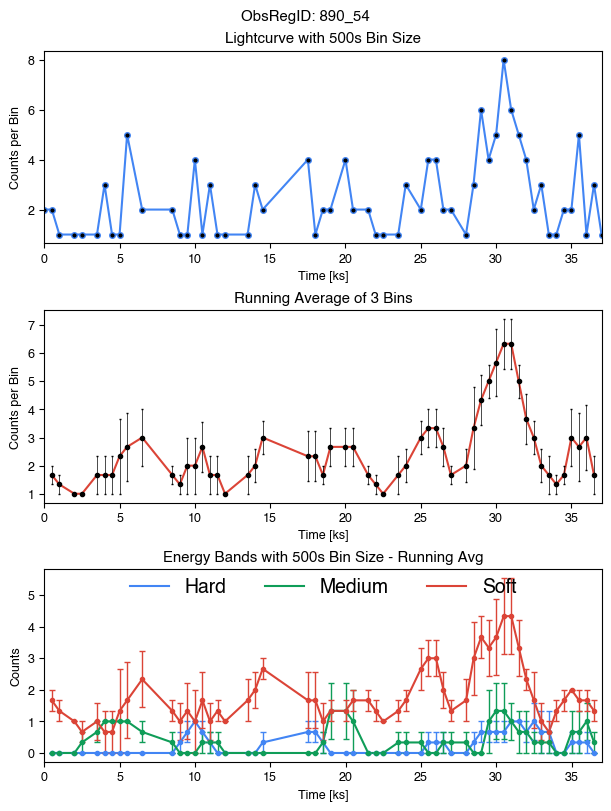

Name: 2CXO J152151.6+074650, ID: 900-27, Date: 2000-04-03T12:43:39, Counts: 76
RA  230.465410605796 DEC  7.780901524687346 Off-axis theta  2.001864258153167


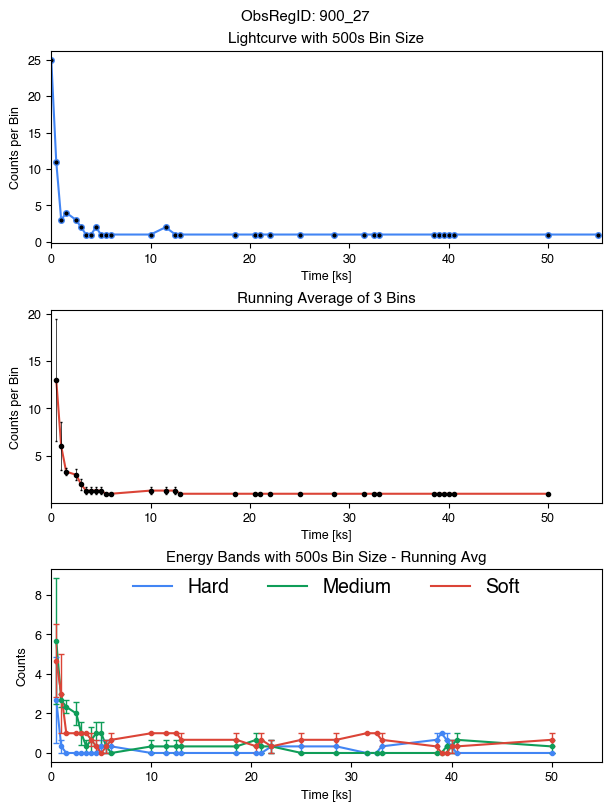

Name: 2CXO J152151.4+074825, ID: 900-35, Date: 2000-04-03T12:43:39, Counts: 110
RA  230.46442198075533 DEC  7.807117687076839 Off-axis theta  3.364483422235961


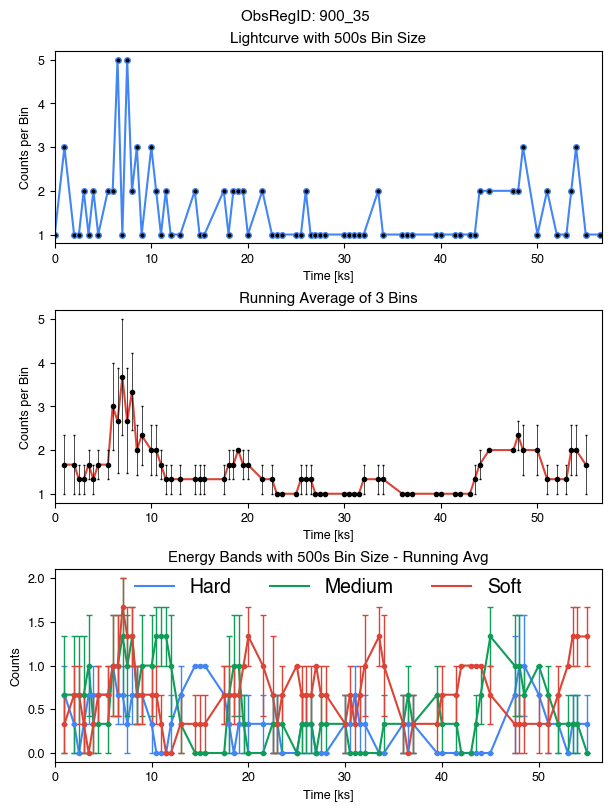

Name: 2CXO J090934.4+110549, ID: 924-33, Date: 2000-10-02T18:18:39, Counts: 137
RA  137.3936304303595 DEC  11.096992216685058 Off-axis theta  5.11834268727988


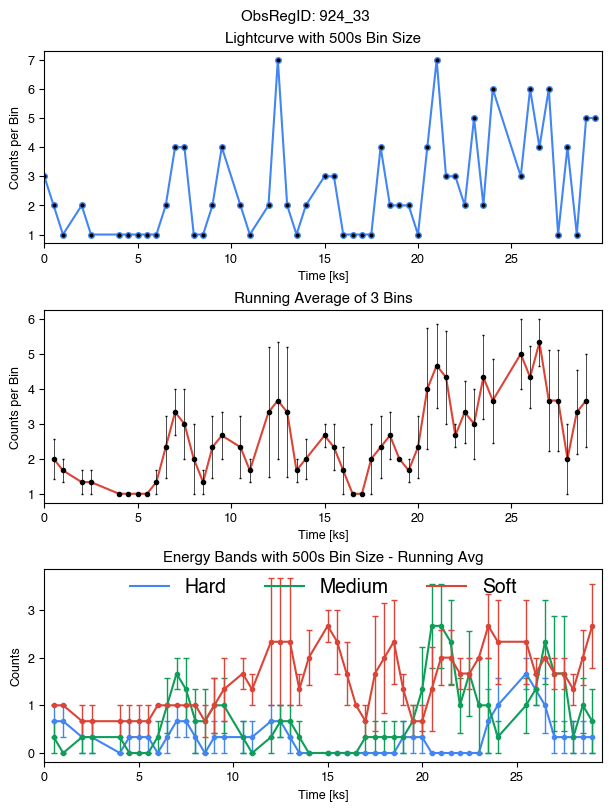

Name: 2CXO J083905.1+194526, ID: 9397-65, Date: 2007-12-22T07:46:47, Counts: 85
RA  129.771495535756 DEC  19.757381201426163 Off-axis theta  9.09673939502387


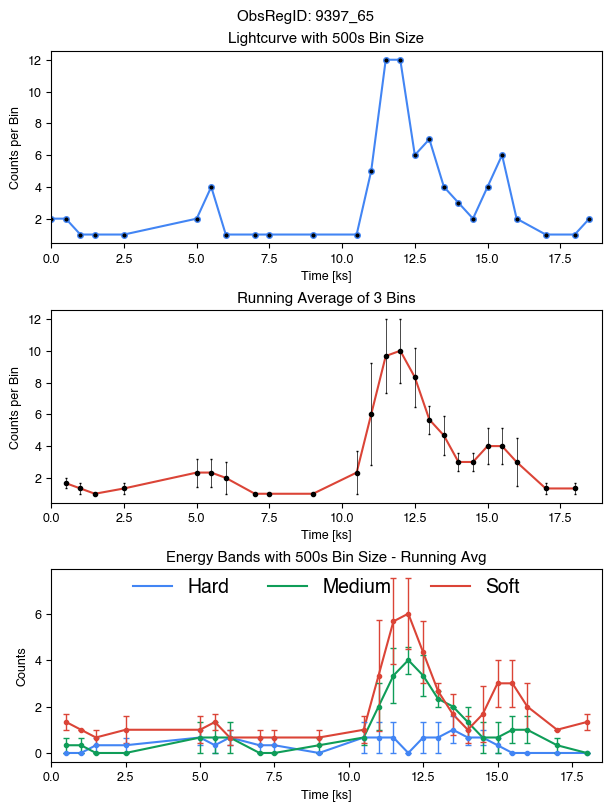

Name: 2CXO J141853.6+525023, ID: 9454-281, Date: 2008-09-11T05:04:52, Counts: 80
RA  214.7234582414383 DEC  52.83985699682584 Off-axis theta  3.766290818558822


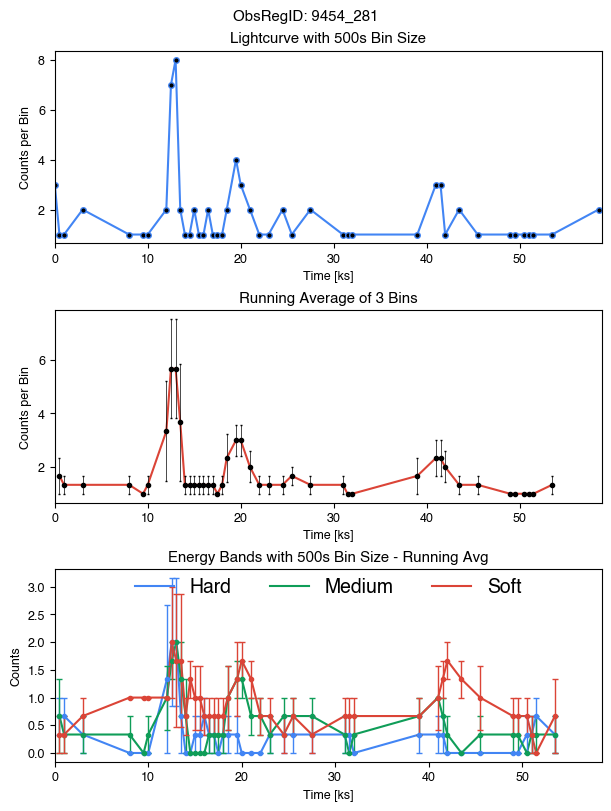

Name: 2CXO J141950.4+524436, ID: 9456-274, Date: 2008-09-24T08:33:21, Counts: 53
RA  214.9599330478925 DEC  52.74338597603421 Off-axis theta  6.607742559238815


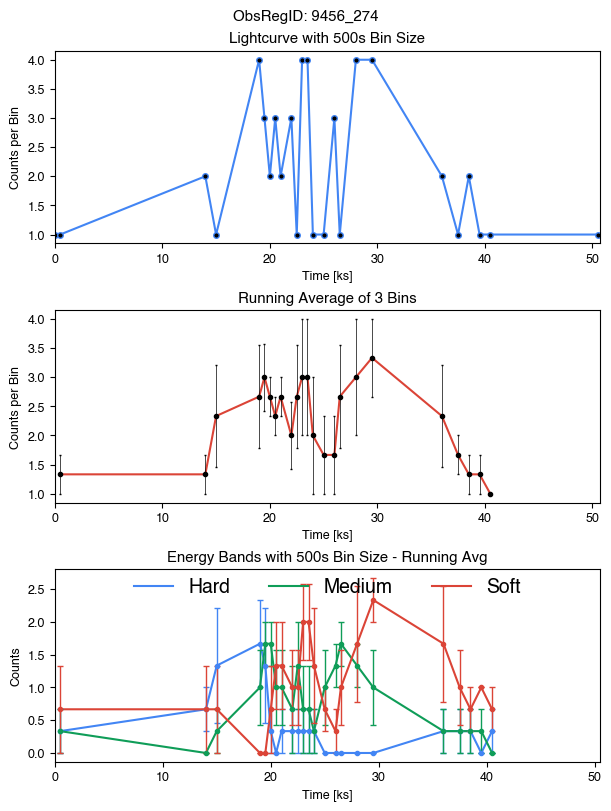

Name: 2CXO J142052.4+525622, ID: 9456-283, Date: 2008-09-24T08:33:21, Counts: 837
RA  215.2186173595769 DEC  52.93953353095261 Off-axis theta  16.69629407931398


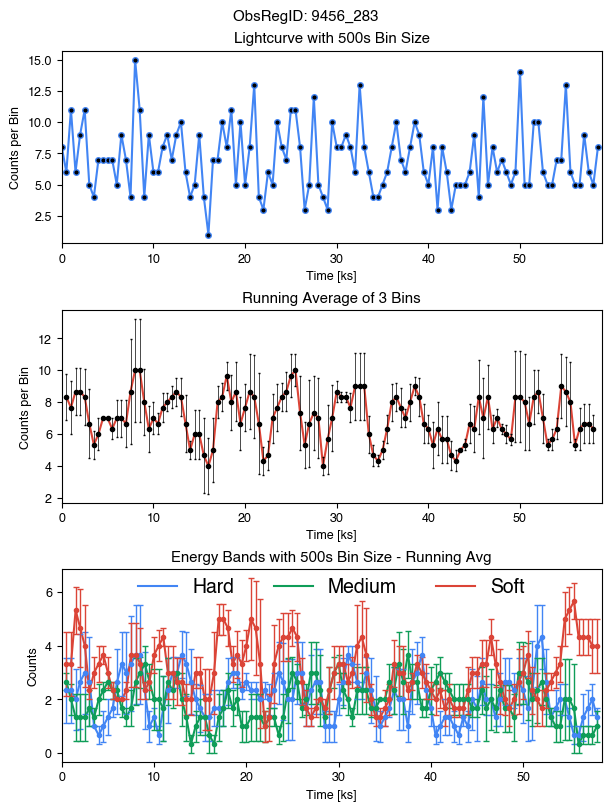

Name: 2CXO J221719.1+001428, ID: 9717-235, Date: 2007-10-01T07:04:13, Counts: 54
RA  334.3298179448286 DEC  0.2411900406224413 Off-axis theta  4.537993952058113


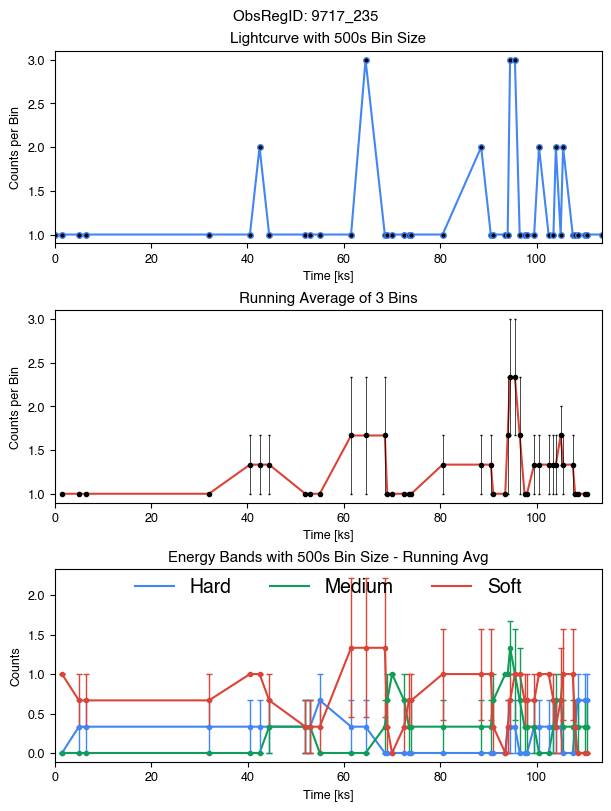

Name: 2CXO J141946.3+525942, ID: 9722-345, Date: 2008-06-13T07:17:14, Counts: 193
RA  214.943226203854 DEC  52.99517581554613 Off-axis theta  4.122045196750614


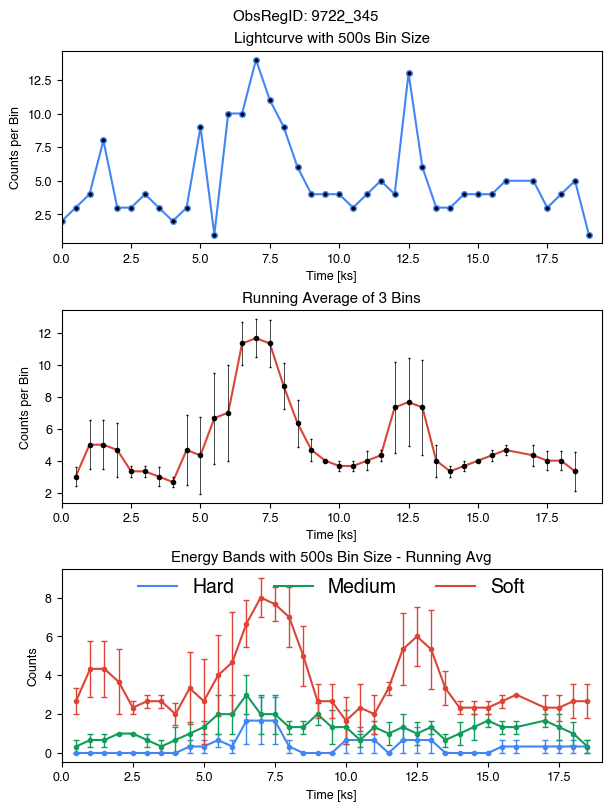

Name: 2CXO J141946.3+525942, ID: 9723-345, Date: 2008-06-18T13:56:45, Counts: 488
RA  214.943226203854 DEC  52.99517581554613 Off-axis theta  4.189972151615033


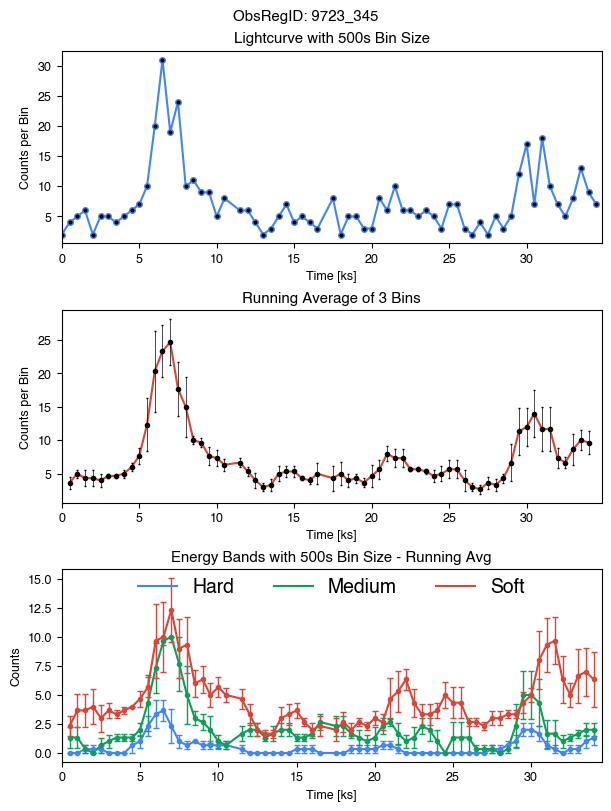

Name: 2CXO J141946.3+525942, ID: 9725-345, Date: 2008-03-31T05:36:53, Counts: 270
RA  214.943226203854 DEC  52.99517581554613 Off-axis theta  3.948022230021952


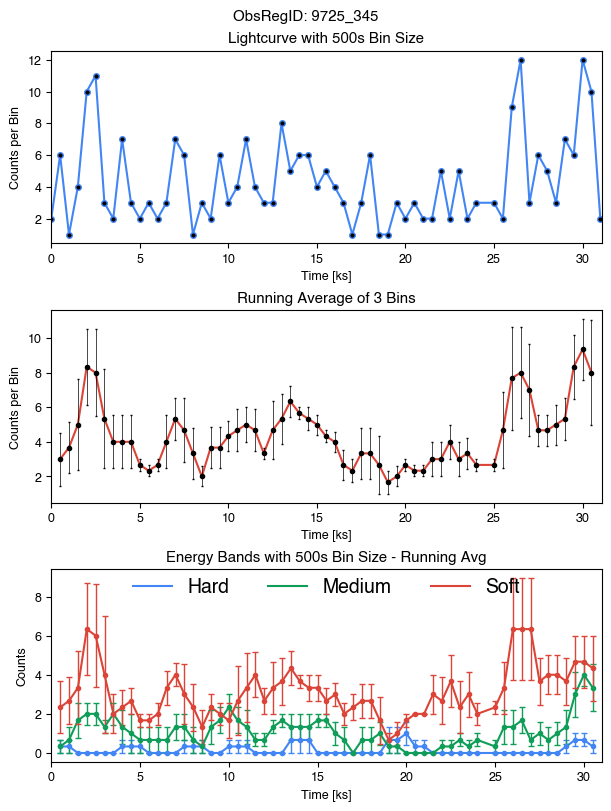

Name: 2CXO J141946.3+525942, ID: 9726-345, Date: 2008-06-05T08:58:50, Counts: 485
RA  214.943226203854 DEC  52.99517581554613 Off-axis theta  4.122796382619335


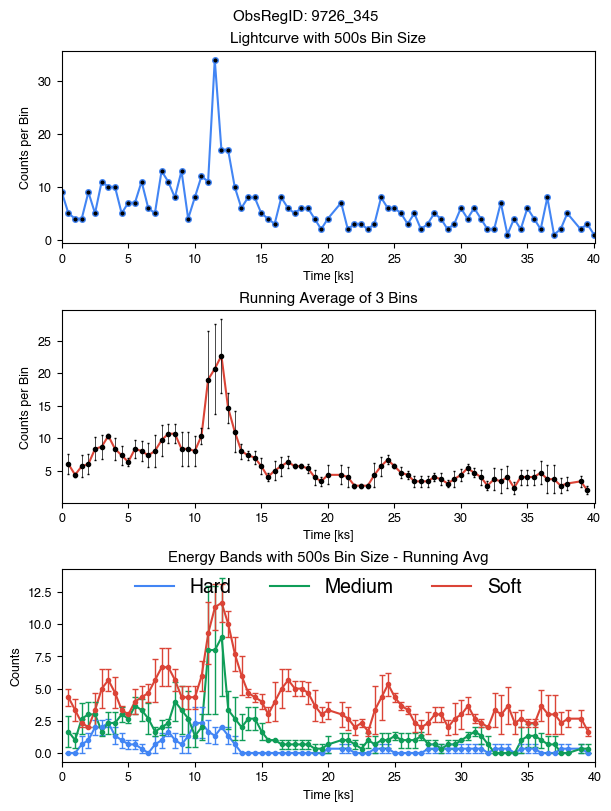

Name: 2CXO J141946.3+525942, ID: 9793-345, Date: 2007-12-19T03:09:48, Counts: 366
RA  214.943226203854 DEC  52.99517581554613 Off-axis theta  4.666429947975829


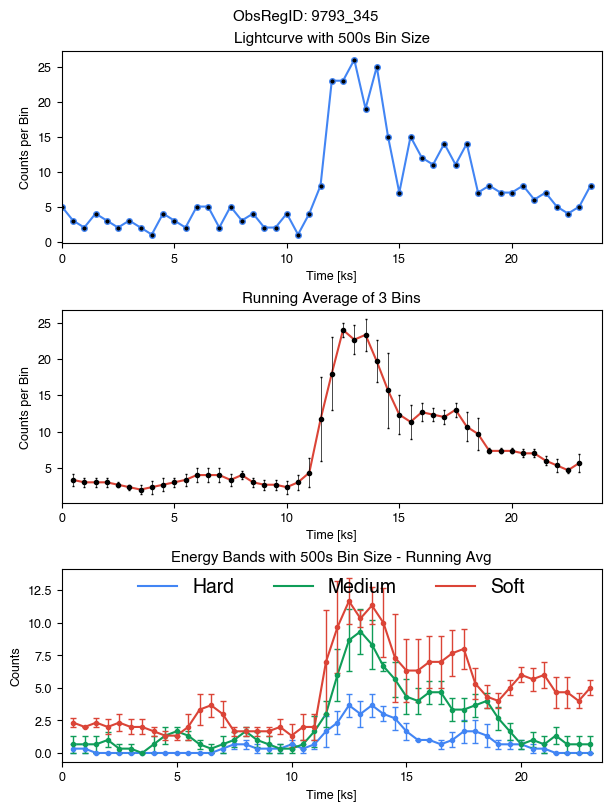

Name: 2CXO J141946.3+525942, ID: 9842-345, Date: 2008-04-02T21:18:27, Counts: 402
RA  214.943226203854 DEC  52.99517581554613 Off-axis theta  3.947955575315635


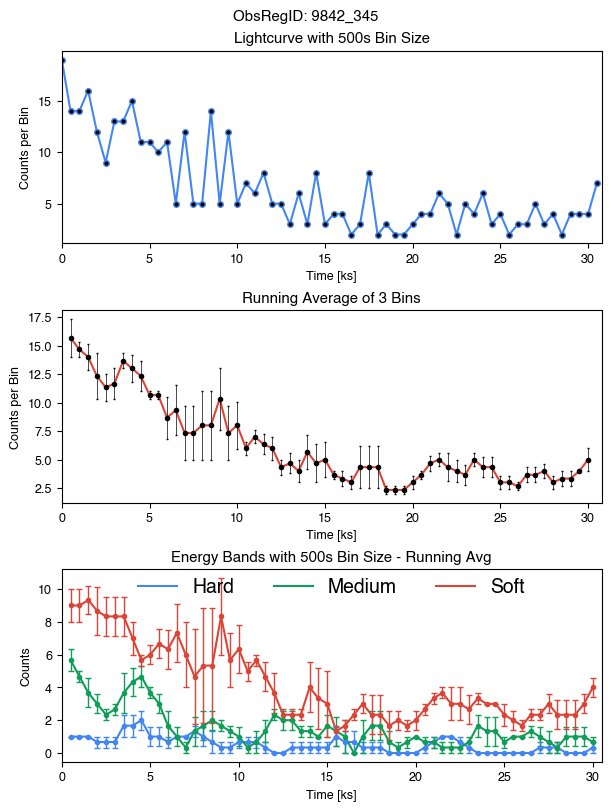

Name: 2CXO J141946.3+525942, ID: 9866-345, Date: 2008-06-03T22:57:05, Counts: 488
RA  214.943226203854 DEC  52.99517581554613 Off-axis theta  4.122869052088888


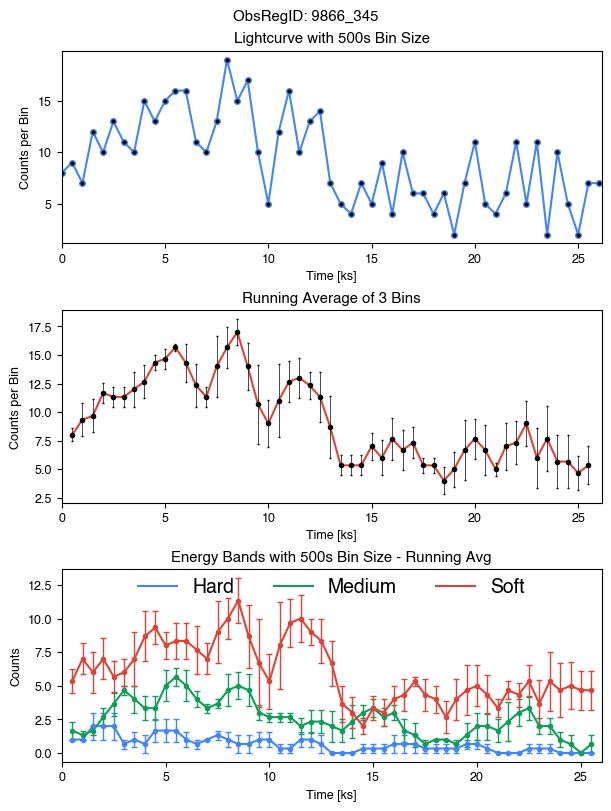

Name: 2CXO J141946.3+525942, ID: 9875-345, Date: 2008-06-23T23:11:12, Counts: 329
RA  214.943226203854 DEC  52.99517581554613 Off-axis theta  4.206163108345386


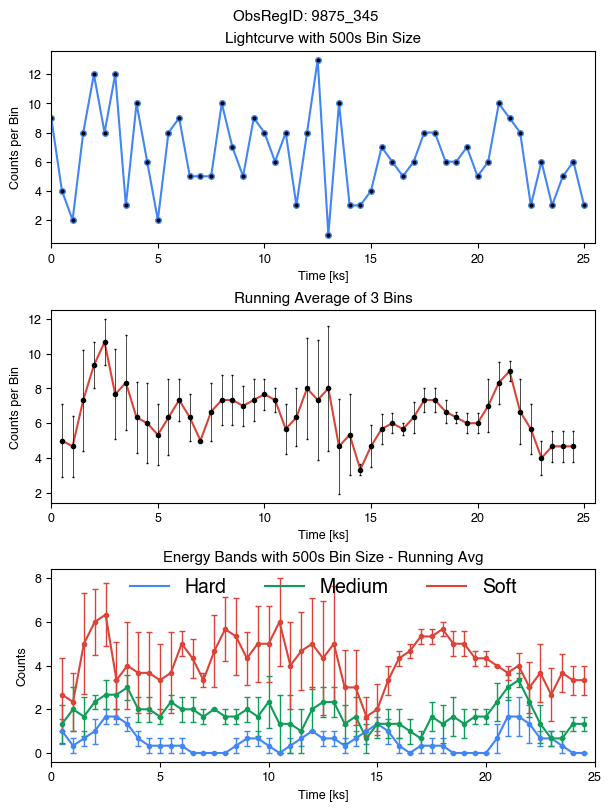

Name: 2CXO J141930.8+525915, ID: 9876-344, Date: 2008-06-22T00:35:47, Counts: 80
RA  214.87850167512815 DEC  52.98772060172808 Off-axis theta  6.543263664460984


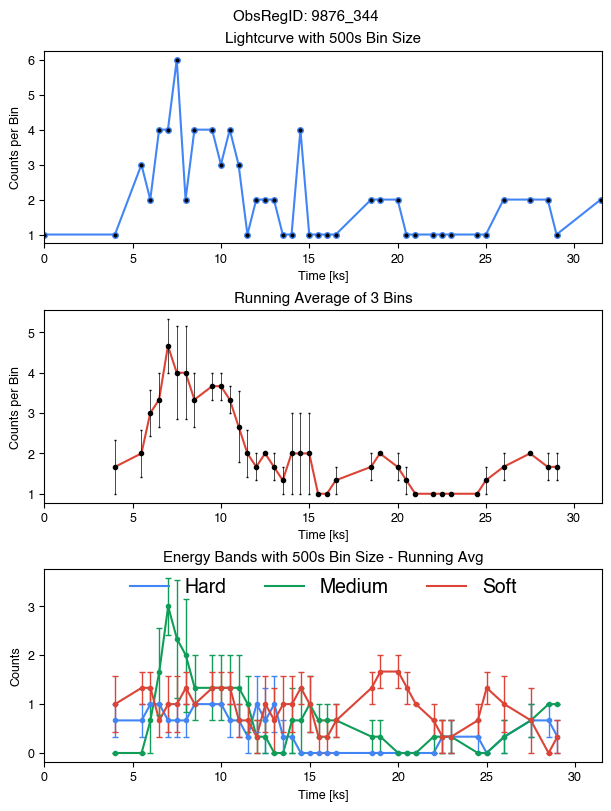

Name: 2CXO J141946.3+525942, ID: 9876-345, Date: 2008-06-22T00:35:47, Counts: 327
RA  214.943226203854 DEC  52.99517581554613 Off-axis theta  4.188932128634149


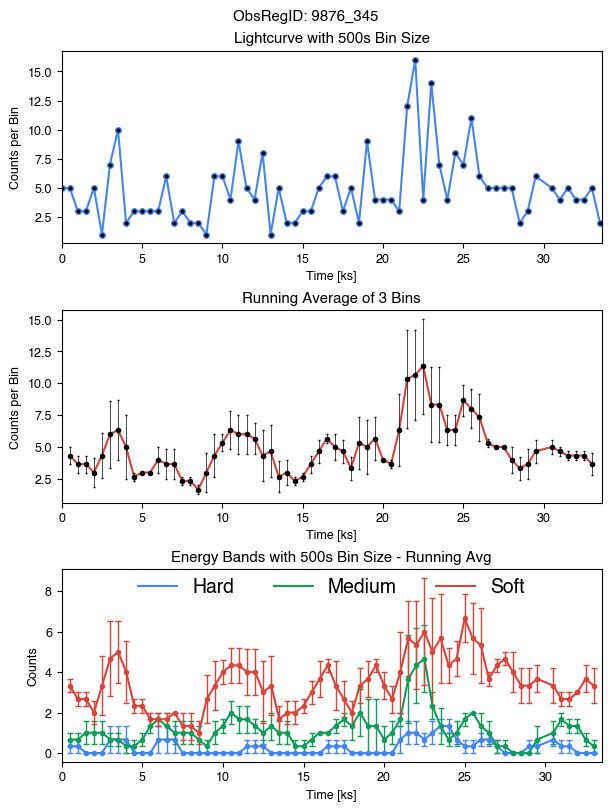

In [8]:
# keep = all_ids[50000:55000]
cmap = '' ##'RdYlBu' #'bwr' #'coolwarm_r' #'cividis' #'viridis'
bb_p0 = 0.1
pha_folder = '/Users/steven/Library/Mobile Documents/com~apple~CloudDocs/0-CfA/4-Data/Datasets/Full/spectrum_files/'

df_eventfiles_group_filtered = df_eventfiles_group.filter(lambda x: x.name in keep).groupby('obsreg_id')
for id_name, dfi in df_eventfiles_group_filtered:
   dfi.sort_values(by='time', inplace = True) 
   dfi.reset_index(drop=True, inplace = True)
   # print('Bayesian Blocks p0: ', bb_p0)
   # Get IDs
   obsid = id_name.split("_")[0]
   regionid = id_name.split("_")[1]
   # Get property columns
   name = df_properties_anomalies[df_properties_anomalies['obsreg_id'] == id_name].name.values[0]
   ra = df_properties_anomalies[df_properties_anomalies['obsreg_id'] == id_name].ra.values[0]
   dec = df_properties_anomalies[df_properties_anomalies['obsreg_id'] == id_name].dec.values[0]
   date = df_properties_anomalies[df_properties_anomalies['obsreg_id'] == id_name].gti_obs.values[0] 
   theta = df_properties_anomalies[df_properties_anomalies['obsreg_id'] == id_name].theta.values[0] 
   print(f'Name: {name}, ID: {obsid}-{regionid}, Date: {date}, Counts: {len(dfi)}')
   print('RA ', str(ra), 'DEC ', str(dec), 'Off-axis theta ', str(theta))
   # Data Products
   # lightcurveplotterNEW(dfi,id_name,750,bb_p0=0.1)
   lightcurveplotterNEW2(dfi,id_name,500,bb_p0=0.1)
   # # #obsid_search_csc(obsid = obsid, outfile='none', download='all',catalog='cur', filetype = 'lc,pha,rmf,arf', root = pha_folder
   # csc_plotter(dfi,id_name,pha_folder,group_counts = 10, fmt = '.', plot_what = 's', c1 = 'black', c2 = '#dfc16d', c3 = '#A51C30')
   # csc_plotter(dfi,id_name,pha_folder,group_counts = 10, fmt = '.', plot_what = 'lc', c1 = 'black', c2 = '#dfc16d', c3 = '#A51C30')
   # csc_plotter(dfi,id_name,pha_folder,group_counts = 10, fmt = '.', plot_what = 'lc-log', c1 = imperial, c2 = '#dfc16d', c3 = '#A51C30', t_start=23300, t_end=24500)

   # hist2D(dfi, id_name, 24, 16, norm = 'minmax', plot = True, colmap = 'viridis', lognorm = True)
   # hist2D(dfi, id_name, 24, 16, norm = 'minmax', plot = True, colmap = cmap_h2, lognorm = False)
   # hist2D(dfi, id_name, 24, 16, norm = 'minmax', plot = True, colmap = cmap_ic2, lognorm = False)
   # hist2D(dfi, id_name, 24, 16, norm = 'minmax', plot = True, colmap = 'binary_r', lognorm = False)
   # hist3D(dfi, id_name, 24, 16, 16, norm = 'minmax', plot = True, colmap = 'viridis', lognorm = True)
   # hist3D(dfi, id_name, 24, 16, 16, norm = 'minmax', plot = True, colmap = 'binary_r', lognorm = True)
   # lightcurveplotter(dfi,id_name,500,bb_p0=0.1)
   # print(dfi)
#  lc_plotter(dfi,id_name,bin_size_sec=1500, bb_p0 = bb_p0, plot_what = 'lightcurve', c1 = imperial, c2 = silver2, c3 = harvard)
#     # print(dfi)
#  lc_plotter(dfi,id_name,bin_size_sec=500, bb_p0 = bb_p0, plot_what = 'lightcurve', c1 = harvard, c2 = gold, c3 = imperial)
   # lc_plotter(dfi,id_name,bin_size_sec=800, bb_p0 = bb_p0, plot_what = 'lightcurve', c1 = harvard, c2 = gold, c3 = imperial)
   # lc_plotter(dfi,id_name,bin_size_sec=500, bb_p0 = bb_p0, plot_what = 'lightcurve', c1 = harvard, c2 = gold, c3 = imperial)
   # lc_plotter(dfi,id_name,bin_size_sec=500, bb_p0 = bb_p0, plot_what = 'bands', c1 = imperial, c2 = gold, c3 = harvard)
   # lc_plotter(dfi,id_name,bin_size_sec=500, bb_p0 = bb_p0, plot_what = 'bb', c1 = imperial, c2 = gold, c3 = harvard)

   # spec_plotter(dfi,id_name,200)



 

In [100]:
 with fits.open('/Users/steven/Library/Mobile Documents/com~apple~CloudDocs/0-CfA/4-Data/Datasets/Full/spectrum_files/acisf23022_000N027_r0122b_lc3.fits.gz') as hdul_lc:
            lc3 = hdul_lc[1].data
            bg3 = hdul_lc[2].data
            time = lc3['Time'] - min(lc3['Time'])
            countrate = lc3['COUNT_RATE']
            y_err = lc3['COUNT_RATE_ERR']
            hdul_lc.info()
            lc3_df = pd.DataFrame(lc3)
            print(lc3_df)

Filename: /Users/steven/Library/Mobile Documents/com~apple~CloudDocs/0-CfA/4-Data/Datasets/Full/spectrum_files/acisf23022_000N027_r0122b_lc3.fits.gz
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      29   ()      
  1  LIGHTCURVE    1 BinTableHDU    160   285R x 5C   ['1D', '1D', '1D', '1D', '1D']   
  2  BKGLIGHTCURVE    1 BinTableHDU    164   285R x 5C   ['1D', '1D', '1D', '1D', '1D']   
             Time  COUNT_RATE  COUNT_RATE_ERR  Minus_3Sig  Plus_3Sig
0    7.059316e+08    0.001520        0.001515   -0.003024   0.006064
1    7.059317e+08    0.001520        0.001515   -0.003024   0.006064
2    7.059318e+08    0.001520        0.001515   -0.003024   0.006064
3    7.059318e+08    0.001520        0.001515   -0.003024   0.006064
4    7.059319e+08    0.001533        0.001527   -0.003049   0.006115
..            ...         ...             ...         ...        ...
280  7.059562e+08    0.014795        0.004779    0.000457   0.029134
281  7.

In [ ]:
srcflux(


obsid_search_csc(obsid = obsid, outfile='none', download='all',catalog='cur', filetype = 'lc,pha,rmf,arf', root = pha_folder

read ARF file /Users/steven/Library/Mobile Documents/com~apple~CloudDocs/0-CfA/4-Data/Datasets/Full/spectrum_files/acisf23022_000N027_r0122_arf3.fits
read RMF file /Users/steven/Library/Mobile Documents/com~apple~CloudDocs/0-CfA/4-Data/Datasets/Full/spectrum_files/acisf23022_000N027_r0122_rmf3.fits
read background file /Users/steven/Library/Mobile Documents/com~apple~CloudDocs/0-CfA/4-Data/Datasets/Full/spectrum_files/acisf23022_000N027_r0122_pha3.fits
dataset 1: 0.0073:14.9504 -> 0.511:14.9504 Energy (keV)
dataset 1: 0.511:14.9504 -> 0.511:7.9862 Energy (keV)
dataset 1: 0.511:7.9862 -> 0.292:7.9862 Energy (keV)
Dataset               = 1
Method                = levmar
Statistic             = chi2gehrels
Initial fit statistic = 145822
Final fit statistic   = 12.675 at function evaluation 37
Data points           = 23
Degrees of freedom    = 21
Probability [Q-value] = 0.919581
Reduced statistic     = 0.603571
Change in statistic   = 145809
   p1.PhoIndex    0.356338     +/- 0.230656    


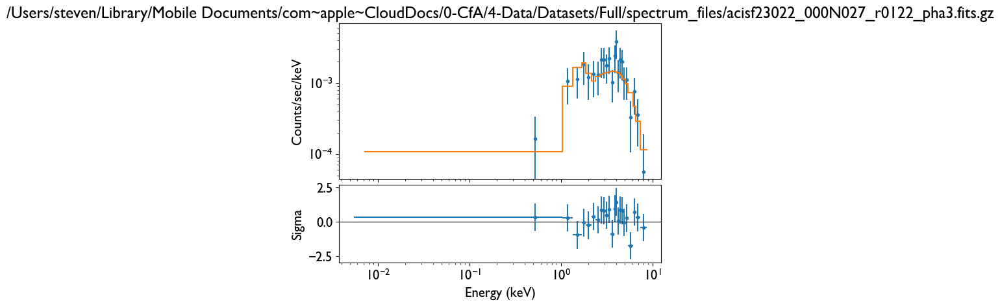

In [89]:
# Set the statistic and analysis method
pha_filename = [spec for spec in glob.iglob(f'{pha_folder}/acisf*pha3.fits.gz') if str(obsid) in spec and str(regionid) in spec][0]
ui.load_pha(pha_filename)
ui.ignore('0.:0.5,8.0:')
ui.subtract()
ui.notice_id(1,0.3,7.)
ui.group_counts(10)

ui.set_stat('chi2gehrels')
ui.set_analysis('ener')

# Set the source model
ui.set_source('xsphabs.abs1 * xspowerlaw.p1')

# Set initial parameter values
ui.set_par('p1.PhoIndex', 1.5)   # Photon index of the power law
ui.set_par('p1.norm', 1e-3)      # Normalization of the power law
ui.set_par('abs1.nH', 0.251)     # Absorption column density

# Freeze the absorption column density
ui.freeze('abs1.nH')

# Perform the fit
ui.fit()

# Access the best-fit parameter values
best_fit_values = [ui.get_par('p1.PhoIndex').val,ui.get_par('p1.norm').val]

# Print the best-fit parameter values
print(f"Photon Index: {best_fit_values[0]}")
print(f"Normalization: {best_fit_values[1]}")

# ui.plot_fit()
# ui.plot_fit_resid()

ui.set_ylog()
ui.set_xlog()
ui.plot_fit_delchi(xlog=True, ylog=True)

# fit_curve = ui.get_fit_plot()
# data = fit_curve.dataplot.plot()
# model = fit_curve.modelplot.plot()
# print(model)

In [ ]:
# keep = all_ids[50000:55000]
cmap = '' ##'RdYlBu' #'bwr' #'coolwarm_r' #'cividis' #'viridis'
bb_p0 = 0.1
pha_folder = '/Users/steven/Library/Mobile Documents/com~apple~CloudDocs/0-CfA/4-Data/Datasets/Full/spectrum_files/'

df_eventfiles_group_filtered = df_eventfiles_group.filter(lambda x: x.name in keep).groupby('obsreg_id')
for id_name, dfi in df_eventfiles_group_filtered:
   dfi.sort_values(by='time', inplace = True) 
   dfi.reset_index(drop=True, inplace = True)
   # print('Bayesian Blocks p0: ', bb_p0)
   # Get IDs
   obsid = id_name.split("_")[0]
   regionid = id_name.split("_")[1]
   # Get property columns
   name = df_properties_anomalies[df_properties_anomalies['obsreg_id'] == id_name].name.values[0]
   ra = df_properties_anomalies[df_properties_anomalies['obsreg_id'] == id_name].ra.values[0]
   dec = df_properties_anomalies[df_properties_anomalies['obsreg_id'] == id_name].dec.values[0]
   date = df_properties_anomalies[df_properties_anomalies['obsreg_id'] == id_name].gti_obs.values[0] 
   theta = df_properties_anomalies[df_properties_anomalies['obsreg_id'] == id_name].theta.values[0] 
   print(f'Name: {name}, ID: {obsid}-{regionid}, Date: {date}, Counts: {len(dfi)}')
   print('RA ', str(ra), 'DEC ', str(dec), 'Off-axis theta ', str(theta))
   # Data Products
   # lightcurveplotterNEW(dfi,id_name,400,bb_p0=0.1)
   # # #obsid_search_csc(obsid = obsid, outfile='none', download='all',catalog='cur', filetype = 'lc,pha,rmf,arf', root = pha_folder
#  csc_plotter(dfi,id_name,pha_folder,group_counts = 10, fmt = '.', plot_what = 's', c1 = 'black', c2 = '#dfc16d', c3 = '#A51C30')
#  csc_plotter(dfi,id_name,pha_folder,group_counts = 10, fmt = '.', plot_what = 'lc', c1 = 'black', c2 = '#dfc16d', c3 = '#A51C30')
   # csc_plotter(dfi,id_name,pha_folder,group_counts = 10, fmt = '.', plot_what = 'lc-log', c1 = imperial, c2 = '#dfc16d', c3 = '#A51C30', t_start=23300, t_end=24500)

   # hist2D(dfi, id_name, 24, 16, norm = 'minmax', plot = True, colmap = 'viridis', lognorm = True)
   # hist2D(dfi, id_name, 24, 16, norm = 'minmax', plot = True, colmap = cmap_h2, lognorm = False)
   # hist2D(dfi, id_name, 24, 16, norm = 'minmax', plot = True, colmap = cmap_ic2, lognorm = False)
   # hist2D(dfi, id_name, 24, 16, norm = 'minmax', plot = True, colmap = 'binary_r', lognorm = False)
   # hist3D(dfi, id_name, 24, 16, 16, norm = 'minmax', plot = True, colmap = 'viridis', lognorm = True)
   # hist3D(dfi, id_name, 24, 16, 16, norm = 'minmax', plot = True, colmap = 'binary_r', lognorm = False)
   # lightcurveplotter(dfi,id_name,500,bb_p0=0.1)
   # print(dfi)
#  lc_plotter(dfi,id_name,bin_size_sec=1500, bb_p0 = bb_p0, plot_what = 'lightcurve', c1 = imperial, c2 = silver2, c3 = harvard)
#     # print(dfi)
#  lc_plotter(dfi,id_name,bin_size_sec=500, bb_p0 = bb_p0, plot_what = 'lightcurve', c1 = harvard, c2 = gold, c3 = imperial)
   # lc_plotter(dfi,id_name,bin_size_sec=800, bb_p0 = bb_p0, plot_what = 'lightcurve', c1 = harvard, c2 = gold, c3 = imperial)
   # lc_plotter(dfi,id_name,bin_size_sec=500, bb_p0 = bb_p0, plot_what = 'lightcurve', c1 = harvard, c2 = gold, c3 = imperial)
   # lc_plotter(dfi,id_name,bin_size_sec=500, bb_p0 = bb_p0, plot_what = 'bands', c1 = imperial, c2 = gold, c3 = harvard)
   # lc_plotter(dfi,id_name,bin_size_sec=500, bb_p0 = bb_p0, plot_what = 'bb', c1 = imperial, c2 = gold, c3 = harvard)

   # spec_plotter(dfi,id_name,200)



   # Set the statistic and analysis method
   ui.set_stat('chi2gehrels')
   ui.set_analysis('ener')

   # Set the source model
   ui.set_source('xsphabs.abs1 * (xsbknpower.p1 + xsdiskbb.p2)')
   ui.set_source('xsbknpower.p1')

   # Set initial parameter values
   ui.set_par('p1.PhoIndx1', 1.5)  # Index of the first power law segment
   ui.set_par('p1.norm', 1e-3)     # Normalization of the first power law segment
   ui.set_par('p1.BreakE', 10)     # Break energy where the power law transitions to the second segment
   ui.set_par('p1.PhoIndx2', -1.5) # Index of the second power law segment
   ui.set_par('p2.Tin', 0.5)       # Inner disk temperature
   ui.set_par('p2.norm', 1e-2)     # Normalization of the disk blackbody component

   # Freeze the absorption column density
   ui.freeze('abs1.nH')

   # Perform the fit
   ui.fit()

   # Access the best-fit parameter values
   best_fit_values = [
      ui.get_par('p1.PhoIndx1').val,
      ui.get_par('p1.norm').val,
      ui.get_par('p1.BreakE').val,
      ui.get_par('p1.PhoIndx2').val,
      ui.get_par('p2.Tin').val,
      ui.get_par('p2.norm').val
   ]

   # Get the covariance results
   covar_results = ui.get_covar_results()

   # Access the errors on the best-fit parameters
   best_fit_errors = [
      covar_results.parmaxes['p1.PhoIndx1'],
      covar_results.parmaxes['p1.norm'],
      covar_results.parmaxes['p1.BreakE'],
      covar_results.parmaxes['p1.PhoIndx2'],
      covar_results.parmaxes['p2.Tin'],
      covar_results.parmaxes['p2.norm']
   ]

   # Print the best-fit parameter values and errors
   for i in range(len(best_fit_values)):
      print(f"Parameter {i+1}: {best_fit_values[i]} +/- {best_fit_errors[i]}")





Name: 2CXO J051117.2-672556, ID: 23022-122, Date: 2020-05-15T12:05:31, Counts: 188
RA  77.82201630020825 DEC  -67.4323964828582 Off-axis theta  11.74569441727
Dataset               = 1
Method                = levmar
Statistic             = chi2gehrels
Initial fit statistic = 223109
Final fit statistic   = 13.3726 at function evaluation 56
Data points           = 23
Degrees of freedom    = 19
Probability [Q-value] = 0.818962
Reduced statistic     = 0.703821
Change in statistic   = 223096
   p1.PhoIndx1    0.18962      +/- 0.221979    
   p1.BreakE      10           +/- 0           
   p1.PhoIndx2    -1.5         +/- 0           
   p1.norm        6.32774e-06  +/- 1.77517e-06 
Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "/Users/steven/anaconda3/envs/ciao_my_xspec/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 3508, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/var/folders/q1/jbx7qj7s0dxbh7nv02nfvc680000gn/T/ipykernel_34532/3225713501.py", line 82, in <module>
    covar_results = ui.get_covar_results()
  File "<string>", line 1, in get_covar_results
  File "/Users/steven/anaconda3/envs/ciao_my_xspec/lib/python3.8/site-packages/sherpa/ui/utils.py", line 9985, in get_covar_results
    raise SessionErr('noaction', "covariance")
sherpa.utils.err.SessionErr: covariance has not been performed

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/Users/steven/anaconda3/envs/ciao_my_xspec/lib/python3.8/site-packages/IPython/core/interactiveshell.py", line 2105, in showtraceback
    stb = self.InteractiveTB.structured_traceback(
  File "/Users/steven/anaconda3/e

(0.1, 10)

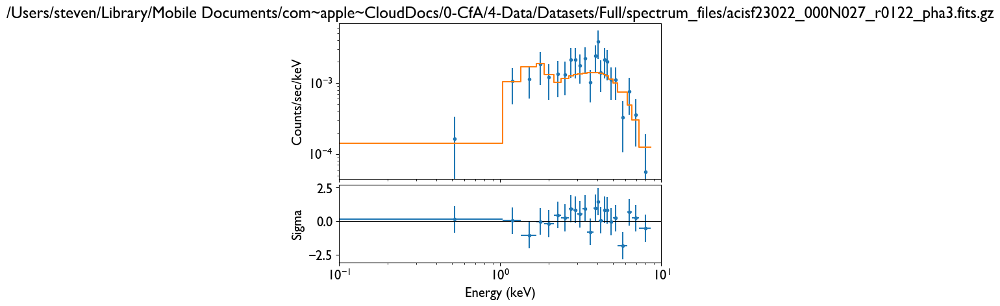

In [ ]:

# 6. Spectrum Plotter Function
def spec_plotter(df_eventfiles_input,id_name,bin_size):
    # Define Font Settings
    plt.rcParams.update({'font.size': 15})
    plt.rcParams['font.family'] = 'sans-serif'
    plt.rcParams['font.sans-serif'] = 'Gill Sans'
    # Define Color  Settings
    dark = '#003170'
    bright = '#cfbd62'
    grey = '#777777'
    # Prepare df
    df = df_eventfiles_input.copy()
    # Create binned lightcurve
    df_binned = df.groupby(df['energy'] // bin_size * bin_size).agg(broad_count = ('energy', lambda x: ((x >= 500) & (x <= 7000)).sum()))
    # Create rolling 3-bin averaged lightcurved
    df_rolling = df_binned.rolling(window=3, center=True).mean()
    rolling_std = df_binned.rolling(window=3, center=True).std()
    errors = rolling_std['broad_count']/math.sqrt(3)
    errors.iloc[0] = errors.iloc[0] * math.sqrt(3)/math.sqrt(2)
    errors.iloc[-1] = errors.iloc[-1] * math.sqrt(3)/math.sqrt(2)
    # Create subplots 
    fig, ax = plt.subplots(1, 1, figsize=(8, 5))
    # Plot binned lightcurve
    print(f'Bin Size {bin_size}s')
    ax.step(df_binned.index/1000, df_binned['broad_count'], color = grey,where="mid")#, marker = 'o', markerfacecolor = 'black', markersize = 8)
    ax.fill_between(df_binned.index/1000, df_binned['broad_count'], step="mid", color = grey, alpha=0.4,label=f'Energy Binned Eventfile')
    ax.plot(df_rolling.index/1000, df_rolling['broad_count'], color = dark, label='Running Average Spectrum')
    ax.errorbar(df_rolling.index/1000, df_rolling['broad_count'], yerr = errors, xerr = None,fmt ='.',color = dark,linewidth = 1,capsize = 2)
    ax.set_xlabel('Energy [keV]')
    ax.set_ylabel('Counts')
    # ax.set_xscale('log')
    # ax.set_xlim([0.5,max(df_binned.index)/1000])
    ax.set_xlim(1E-1,10)  
    # ax.set_ylim([0,max(df_binned['broad_count'])*1.3])
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.tick_params(which='both', direction='in', top=True, right=True)
    ax.minorticks_on()
    ax.legend(loc='best',frameon=False)
    plt.show()
    return

# 6. Image Plotter Function
def img_plotter(df_eventfiles_input,id_name,bin_size):
    # Define Font Settings
    plt.rcParams.update({'font.size': 16})
    plt.rcParams['font.family'] = 'sans-serif'
    plt.rcParams['font.sans-serif'] = 'Gill Sans'
    # Define Color  Settings
    dark = '#003170'
    bright = '#cfbd62'
    grey = '#777777'
    # Prepare df
    df = df_eventfiles_input.copy()
    fig, ax = plt.subplots(1, 1, figsize=(5, 5))
    plt.hist2d()
    # Create 2D histogram
    plt.hist2d(x, y, bins=20, cmap='cividis')
    plt.colorbar()  # Add colorbar
    ax.set_xlabel('X-position')  # Set x-axis label
    ax.set_ylabel('Y-position')  # Set y-axis label

    ax.tick_params(which='both', direction='in', top=True, right=True)
    ax.minorticks_on()
    ax.legend(loc='upper left',frameon=False)
    plt.show()
    return

In [87]:
PATH = f'{global_path}/{set_id}'

search_csc('38.94521969459174, 34.68734478897538','1.0','test1.tsv','arcsec','', 'no', 'all', PATH, 'broad', 'lc,pha,rmf,arf', 'cur','1','1')

search_csc
             pos = 38.94521969459174, 34.68734478897538
          radius = 1
         outfile = test1.tsv
         radunit = arcsec
         columns = 
     sensitivity = no
        download = all
            root = /Users/steven/Library/Mobile Documents/com~apple~CloudDocs/0-CfA/4-Data/Datasets/Full
           bands = broad
       filetypes = lc,pha,rmf,arf
         catalog = current
         verbose = 1
         clobber = yes
            mode = hl


2 rows returned by query
1 Different Master Source(s).
2 Different Observation(s).

name                	ra          	dec         	sepn	obsid	
 2CXO J023546.8+344115	3.894522e+01	3.468734e+01	0"	26201	
 2CXO J023546.8+344115	3.894522e+01	3.468734e+01	0"	 1870	
Retrieving files for obsid_obi 26201_000
Retrieved file /Users/steven/Library/MobileDocuments/com~apple~CloudDocs/0-CfA/4-Data/Datasets/Full/2CXOJ023546.8+344115/26201_000/acisf26201_000N030_r0004_pha3.fits
Retrieved file /Users/steven/Library/MobileDocuments/com~apple~Cl